# COVID19: Sick patient detection using Machine Learning. 

In [805]:
# Import Data Analysis python library 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns

# 1. Exploratory Data Analysis
## First Objectif 
 - **Understand the dataset**
 - **Develop first modelisation strategy**
## Final Objectif
 - **Predict sick patient with a metrics**: F1= 50% and Recall = 70%.

## Form Analysis
 - **Target Variable**: SARS-Cov-2 exam result
 - **Number of lines and columns**: 5644, 111
 - **Types of variables**: 74 Numericals and 37 categoricals
 - **Analyse missing value**: 65% dataset has +90% missing values
       + 2 groupes (76% NAN -> Viral Load Test , 89% NAN -> Blood Test)

## Detailed Analysis
 - **Target Visualisation** : 10% postifs values, 90% negatifs values. 
 - **Variable Meaning**:
    - Numerical variable (float) : Blood test are standardise.
    - Categorical variable : Viral Load Test are  binary (0,1).
      The variable "Parainfluenza 2" need to be excluded, it does not variable (only none detected).
    - Patient age quantile: can not be interpreted, those are clearly process data, it can range data (0 -> [0,5]) or another treatment.
    
 - **Relationship between Target/Features**:
    - Numerical variable (float/Blood) : ["Platelets", "Leukocytes", "Monocytes", ]  have small difference in distribution between positive and negative patient.
    - Numerical "Patient Age Quantile" (int range): Introduce the ideas that patient from low level range have less chance to be postive to covid.
    - Categorical variable (Viral Load): It look like that it is very rare to have a virus and the covid19 at the same. Maybe the virus and covid19 are not relatted.
  
## Advanced Analysis
- **Relationship between Variable/Variable**:
  - Blood/Blood: Some variable have a real strong correlation between them (+0.9).
  - Blooad/age : Correlation between blood and patient is to low for them to clearly influence each other.
  - Virus/Virus: The Influenza A/B quick test are not reliable.
  - Sickness/Blood : The Lymphocytes distribution is different between sick and not sick patient.
  - Hospitalisation/sickness
  - Hospitalisation/virus
  - Hospitalisation/Blood

## NAN ANalysis
**RATIO TARGET INITIAL (90/10)**:
- Viral load without NAN 1352, Ratio target (92/8)
- Blood without NAN 598 lines, Ratio target (86/14)
- DATASET without NAN 99 lines, Ratio target (90/10)
      
## Hypothesis NUll H0
- Patient with covid have Leukocytes, Mococytes and Platelets significantly different from sick patient.
     - H0: The mean value of those blood test are identical
    



In [806]:
# Import the dataset 
df_covid = pd.read_excel("covid19.xlsx")

### DATASET FORM ANALYSIS

In [807]:
# Visualise the first 5 rows of the dataset
df_covid.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,...,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [808]:
#Identify the number rows and columns
dim = df_covid.shape
dim

(5644, 111)

In [809]:
# Identify the target
y = df_covid["SARS-Cov-2 exam result"]
y 

0       negative
1       negative
2       negative
3       negative
4       negative
          ...   
5639    positive
5640    negative
5641    negative
5642    negative
5643    positive
Name: SARS-Cov-2 exam result, Length: 5644, dtype: object

In [810]:
# Retreive the feature data types
# pd.set_option("display.max-row", df_covid.shape[0]) # Display all the dataset rows
df_covid.dtypes.value_counts()

float64    70
object     37
int64       4
Name: count, dtype: int64

In [811]:
# Visualise the all dataset
missing_values = df_covid.isna()
missing_values

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,...,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
0,False,False,False,False,False,False,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
1,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,True,True,True,True,True,True
2,False,False,False,False,False,False,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
3,False,False,False,False,False,False,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
4,False,False,False,False,False,False,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5639,False,False,False,False,False,False,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
5640,False,False,False,False,False,False,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
5641,False,False,False,False,False,False,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
5642,False,False,False,False,False,False,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True


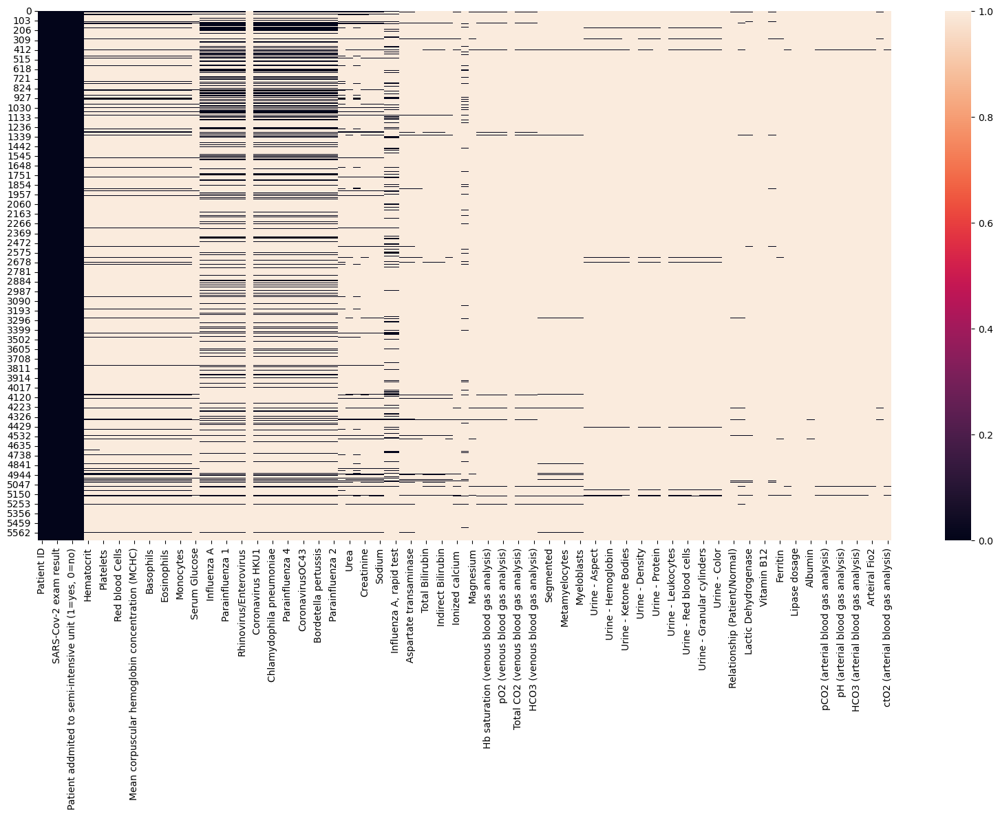

In [812]:
plt.figure(figsize=(20,10))
sns.heatmap(missing_values)
plt.show()

In [813]:
# Calculate percent missing values 
pd.set_option("display.max_row", df_covid.shape[0])
(missing_values.sum(axis=0)/df_covid.shape[0]).sort_values(ascending=True)

Patient ID                                               0.000000
Patient age quantile                                     0.000000
SARS-Cov-2 exam result                                   0.000000
Patient addmited to regular ward (1=yes, 0=no)           0.000000
Patient addmited to semi-intensive unit (1=yes, 0=no)    0.000000
Patient addmited to intensive care unit (1=yes, 0=no)    0.000000
Influenza B                                              0.760099
Respiratory Syncytial Virus                              0.760099
Influenza A                                              0.760099
Rhinovirus/Enterovirus                                   0.760454
Inf A H1N1 2009                                          0.760454
CoronavirusOC43                                          0.760454
Coronavirus229E                                          0.760454
Parainfluenza 4                                          0.760454
Adenovirus                                               0.760454
Chlamydoph

In [814]:
missing_90_per = (missing_values.sum()/df_covid.shape[0] < 0.90)
missing_90_per_cat = missing_90_per.value_counts()
round(missing_90_per_cat/missing_90_per_cat.sum() *100, 2)

False    64.86
True     35.14
Name: count, dtype: float64

In [815]:
# Retreive the dataset columns 

# Stock features with at least 10% variables (without  the target "SARS-Cov-2 exam result")
columns_at10 = list()
# Stock features with at least 200% variables (without  the target "SARS-Cov-2 exam result")
columns_at20 = list()

for i, variable in enumerate(df_covid.columns) :
    value_percent =  df_covid[variable].value_counts().sum()/df_covid.shape[0] * 100
    print(f"{i}: {variable} --> {value_percent:.2f}%")

    if variable == "SARS-Cov-2 exam result": # Ignore target
        continue
    if value_percent > 10.00:
        columns_at10.append(variable)
    if value_percent > 20.00:
        columns_at20.append(variable)
    

0: Patient ID --> 100.00%
1: Patient age quantile --> 100.00%
2: SARS-Cov-2 exam result --> 100.00%
3: Patient addmited to regular ward (1=yes, 0=no) --> 100.00%
4: Patient addmited to semi-intensive unit (1=yes, 0=no) --> 100.00%
5: Patient addmited to intensive care unit (1=yes, 0=no) --> 100.00%
6: Hematocrit --> 10.68%
7: Hemoglobin --> 10.68%
8: Platelets --> 10.67%
9: Mean platelet volume  --> 10.61%
10: Red blood Cells --> 10.67%
11: Lymphocytes --> 10.67%
12: Mean corpuscular hemoglobin concentration (MCHC) --> 10.67%
13: Leukocytes --> 10.67%
14: Basophils --> 10.67%
15: Mean corpuscular hemoglobin (MCH) --> 10.67%
16: Eosinophils --> 10.67%
17: Mean corpuscular volume (MCV) --> 10.67%
18: Monocytes --> 10.65%
19: Red blood cell distribution width (RDW) --> 10.67%
20: Serum Glucose --> 3.69%
21: Respiratory Syncytial Virus --> 23.99%
22: Influenza A --> 23.99%
23: Influenza B --> 23.99%
24: Parainfluenza 1 --> 23.95%
25: CoronavirusNL63 --> 23.95%
26: Rhinovirus/Enterovirus --

In [816]:
columns_at10

['Patient ID',
 'Patient age quantile',
 'Patient addmited to regular ward (1=yes, 0=no)',
 'Patient addmited to semi-intensive unit (1=yes, 0=no)',
 'Patient addmited to intensive care unit (1=yes, 0=no)',
 'Hematocrit',
 'Hemoglobin',
 'Platelets',
 'Mean platelet volume ',
 'Red blood Cells',
 'Lymphocytes',
 'Mean corpuscular hemoglobin concentration\xa0(MCHC)',
 'Leukocytes',
 'Basophils',
 'Mean corpuscular hemoglobin (MCH)',
 'Eosinophils',
 'Mean corpuscular volume (MCV)',
 'Monocytes',
 'Red blood cell distribution width (RDW)',
 'Respiratory Syncytial Virus',
 'Influenza A',
 'Influenza B',
 'Parainfluenza 1',
 'CoronavirusNL63',
 'Rhinovirus/Enterovirus',
 'Coronavirus HKU1',
 'Parainfluenza 3',
 'Chlamydophila pneumoniae',
 'Adenovirus',
 'Parainfluenza 4',
 'Coronavirus229E',
 'CoronavirusOC43',
 'Inf A H1N1 2009',
 'Bordetella pertussis',
 'Metapneumovirus',
 'Parainfluenza 2',
 'Influenza B, rapid test',
 'Influenza A, rapid test']

In [817]:
columns_at20

['Patient ID',
 'Patient age quantile',
 'Patient addmited to regular ward (1=yes, 0=no)',
 'Patient addmited to semi-intensive unit (1=yes, 0=no)',
 'Patient addmited to intensive care unit (1=yes, 0=no)',
 'Respiratory Syncytial Virus',
 'Influenza A',
 'Influenza B',
 'Parainfluenza 1',
 'CoronavirusNL63',
 'Rhinovirus/Enterovirus',
 'Coronavirus HKU1',
 'Parainfluenza 3',
 'Chlamydophila pneumoniae',
 'Adenovirus',
 'Parainfluenza 4',
 'Coronavirus229E',
 'CoronavirusOC43',
 'Inf A H1N1 2009',
 'Bordetella pertussis',
 'Metapneumovirus',
 'Parainfluenza 2']

### DATASET DETAILED ANALYSIS

#### Select the features variables

In [818]:
select_features = df_covid[columns_at10]
pd.set_option("display.max_rows", 10)
select_features

,Patient ID,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,...,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,44477f75e8169d2,13,0,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,0,0,0,0.236515,-0.022340,-0.517413,0.010677,0.102004,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,a46b4402a0e5696,8,0,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,0,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,0,0,0,NaN,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5639,ae66feb9e4dc3a0,3,0,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5640,517c2834024f3ea,17,0,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5641,5c57d6037fe266d,4,0,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5642,c20c44766f28291,10,0,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [819]:
# Delete useless columns for model.
select_features = select_features.drop("Patient ID", axis=1)
select_features

,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,...,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,13,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17,0,0,0,0.236515,-0.022340,-0.517413,0.010677,0.102004,0.318366,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,8,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,15,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5639,3,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5640,17,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5641,4,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5642,10,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [820]:
select_features.shape

(5644, 37)

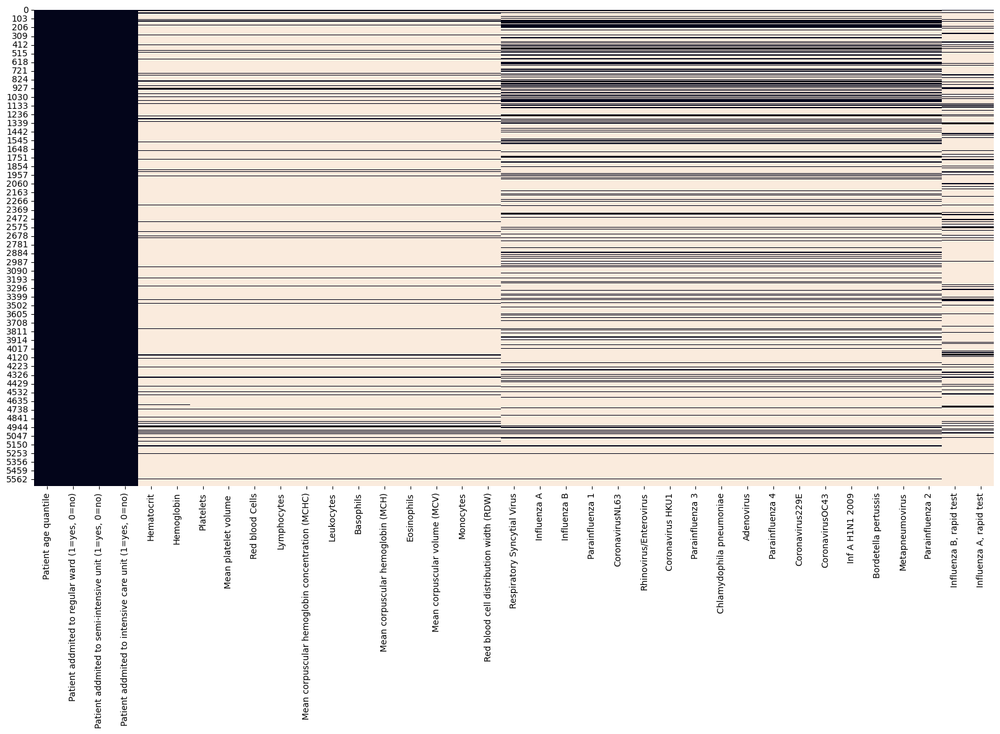

In [821]:
plt.figure(figsize=(20,10))
sns.heatmap(select_features.isna(), cbar=False)
plt.show()

#### Evaluate the target

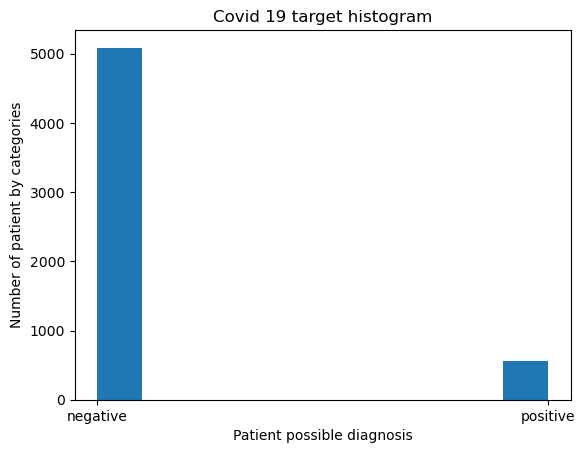

In [822]:
# Visualise the target
plt.figure()
plt.title("Covid 19 target histogram")
plt.xlabel("Patient possible diagnosis")
plt.ylabel("Number of patient by categories")
plt.hist(y)
plt.show()

In [823]:
y.value_counts(normalize=True)

SARS-Cov-2 exam result
negative    0.901134
positive    0.098866
Name: proportion, dtype: float64

#### Analyse the features columns

In [824]:
# Identify the selected features types. 
select_features.dtypes.value_counts()

object     19
float64    14
int64       4
Name: count, dtype: int64

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


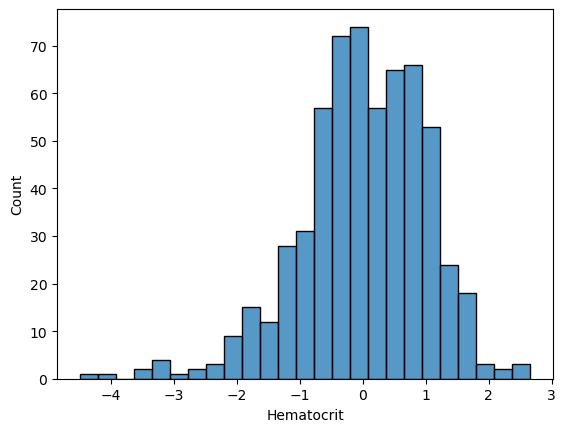

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


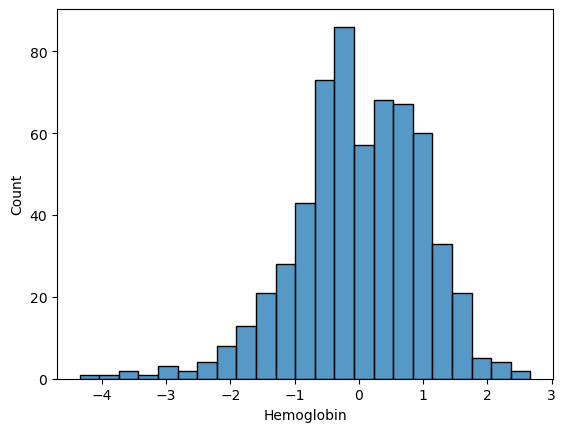

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


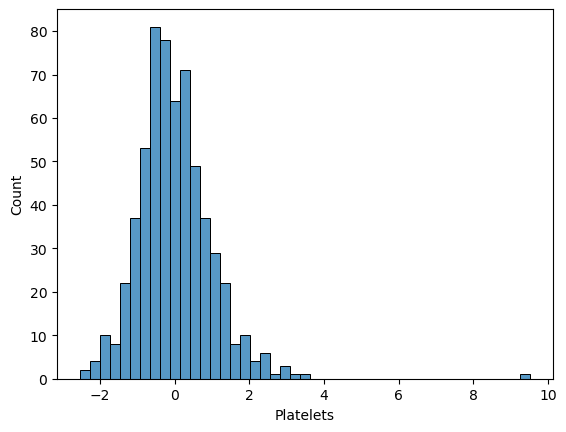

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


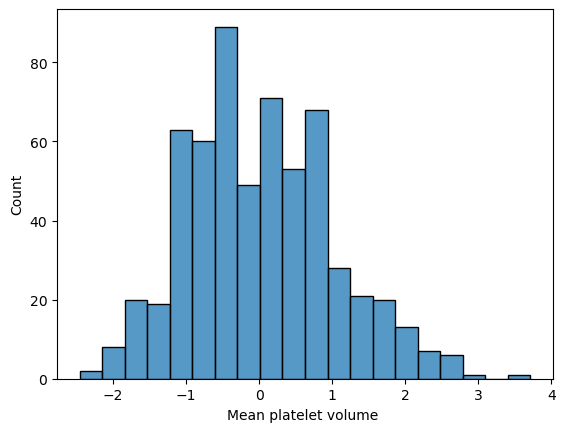

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


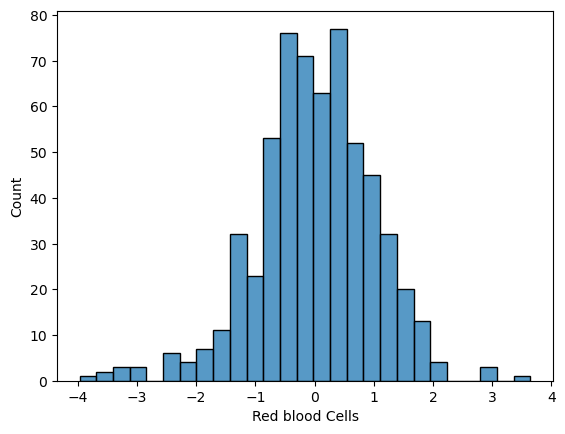

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


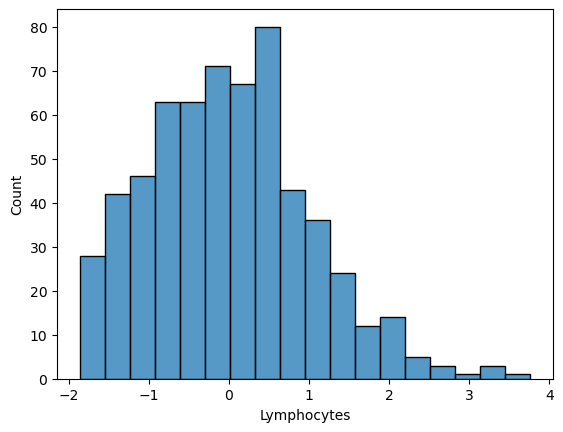

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


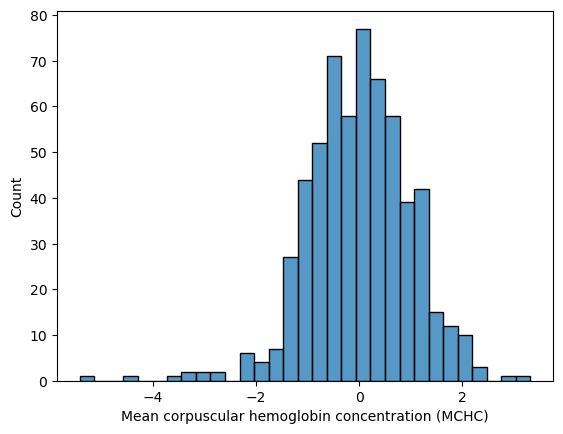

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


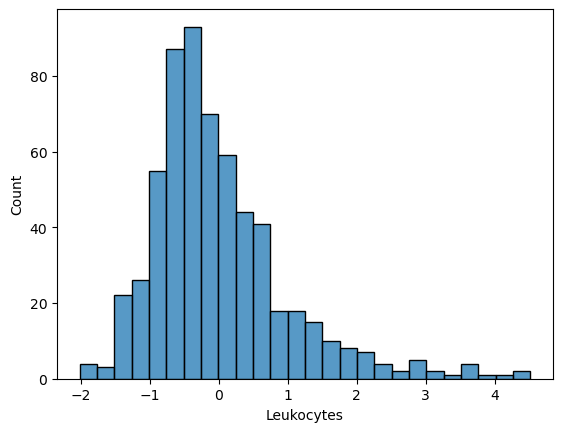

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


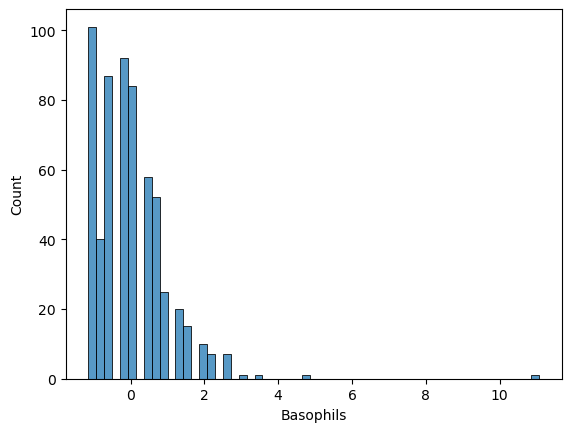

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


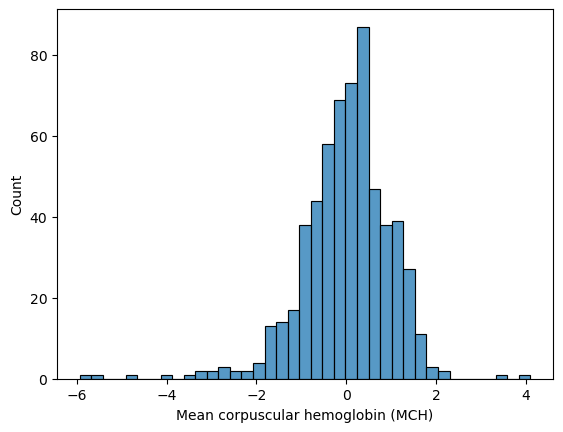

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


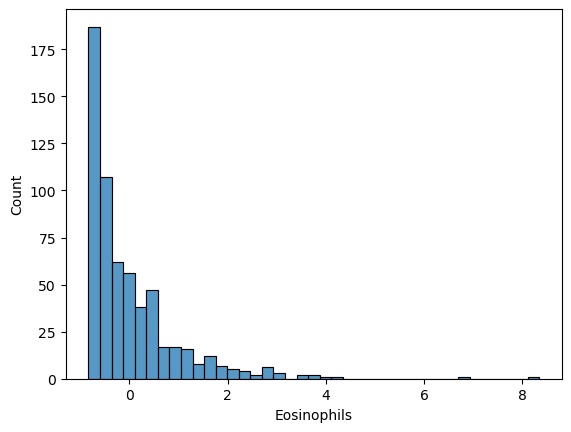

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


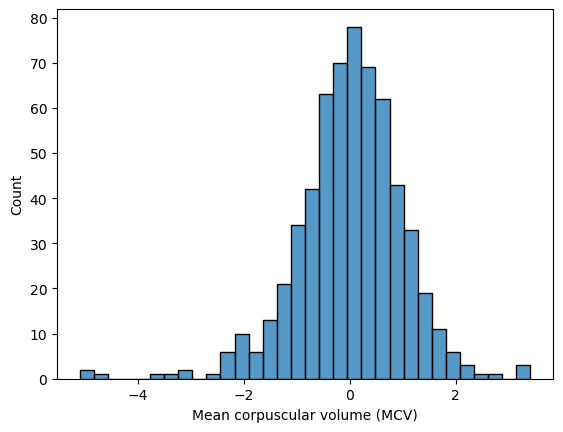

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


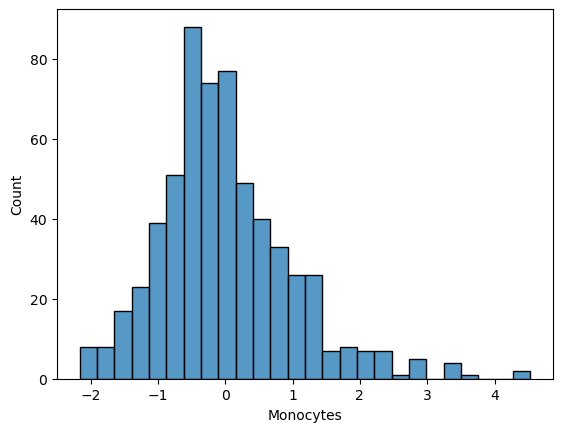

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


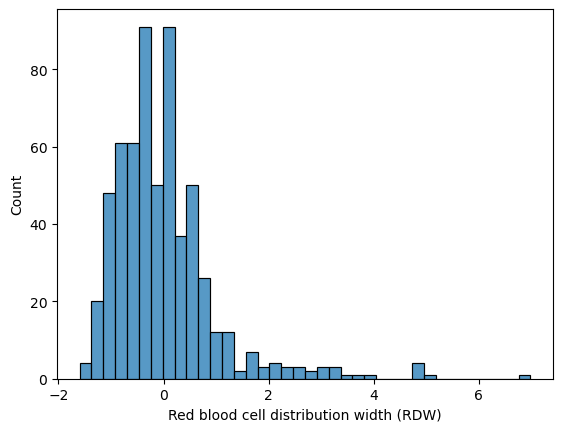

In [825]:
for col in select_features.select_dtypes("float"):
    plt.figure()
    sns.histplot(x=col, data=select_features, cbar=True)
    plt.xlabel(col)
    plt.show()

In [826]:
#Check categorical columns various output
for col in select_features.select_dtypes("object"):
    print(f"{col:-<50} {select_features[col].unique()}")

Respiratory Syncytial Virus----------------------- [nan 'not_detected' 'detected']
Influenza A--------------------------------------- [nan 'not_detected' 'detected']
Influenza B--------------------------------------- [nan 'not_detected' 'detected']
Parainfluenza 1----------------------------------- [nan 'not_detected' 'detected']
CoronavirusNL63----------------------------------- [nan 'not_detected' 'detected']
Rhinovirus/Enterovirus---------------------------- [nan 'detected' 'not_detected']
Coronavirus HKU1---------------------------------- [nan 'not_detected' 'detected']
Parainfluenza 3----------------------------------- [nan 'not_detected' 'detected']
Chlamydophila pneumoniae-------------------------- [nan 'not_detected' 'detected']
Adenovirus---------------------------------------- [nan 'not_detected' 'detected']
Parainfluenza 4----------------------------------- [nan 'not_detected' 'detected']
Coronavirus229E----------------------------------- [nan 'not_detected' 'detected']
Coro

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

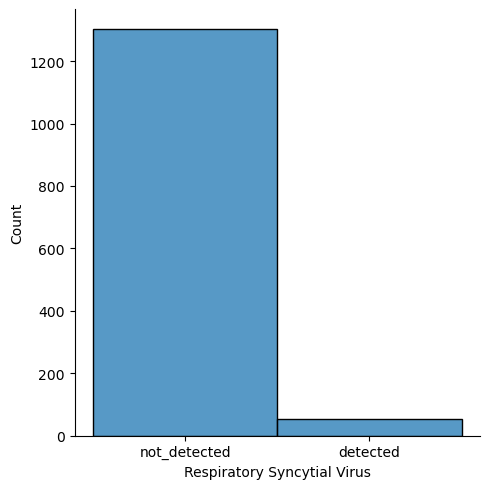

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

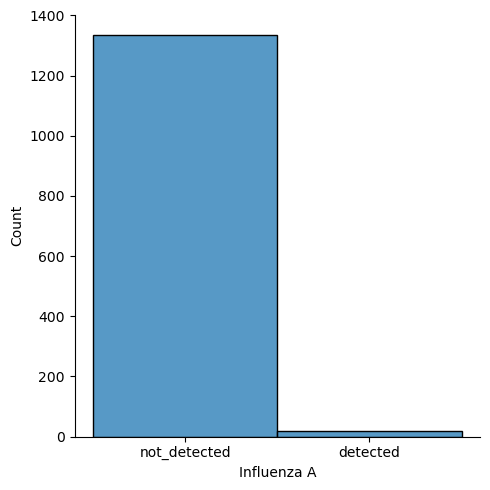

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

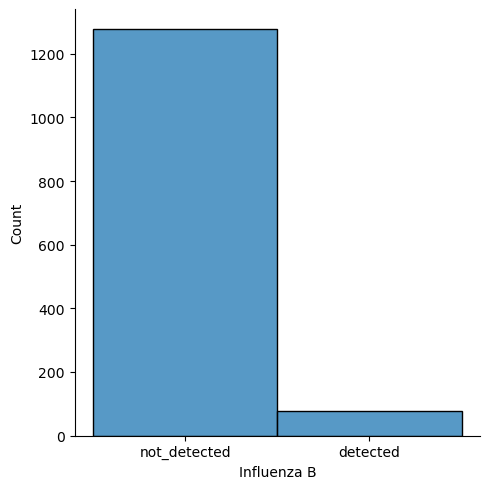

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

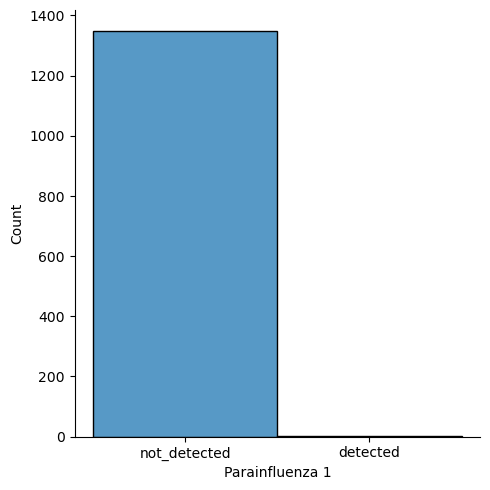

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

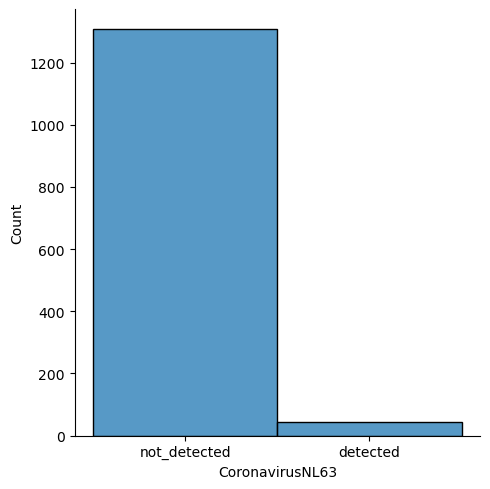

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

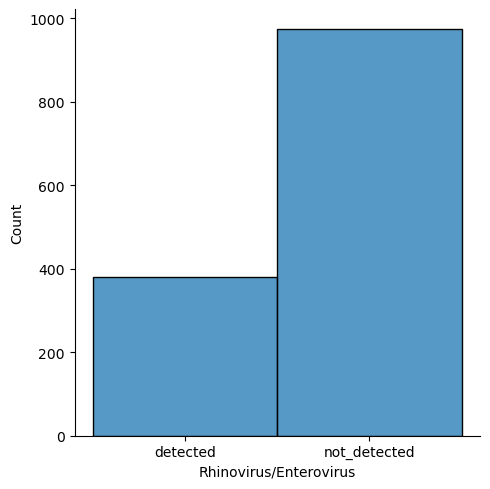

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

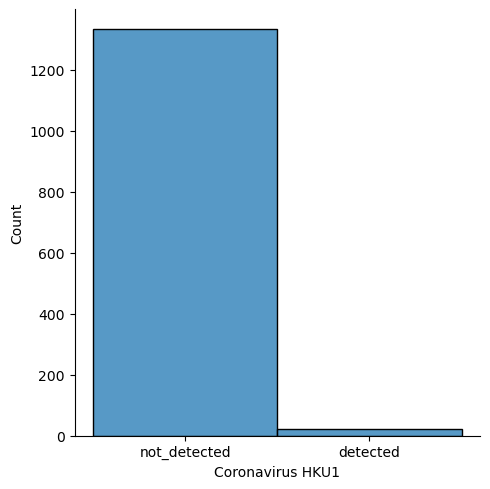

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

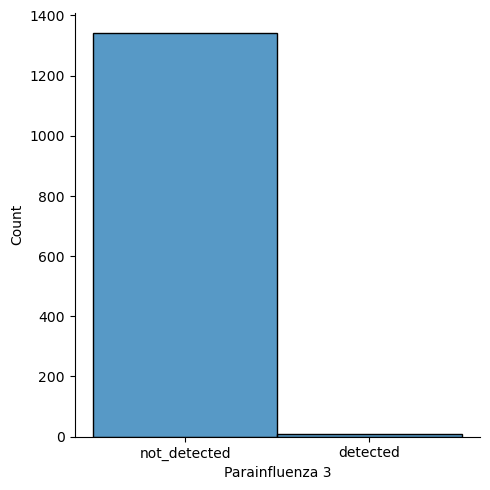

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

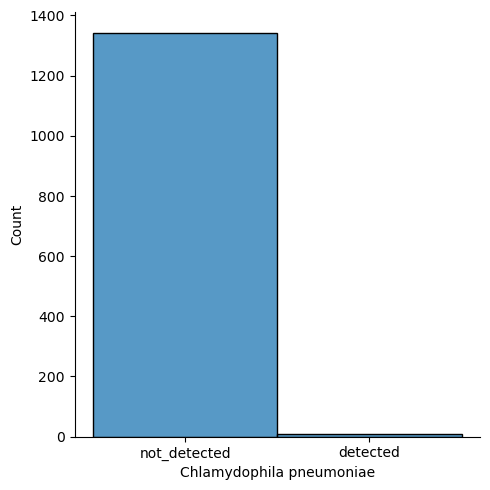

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

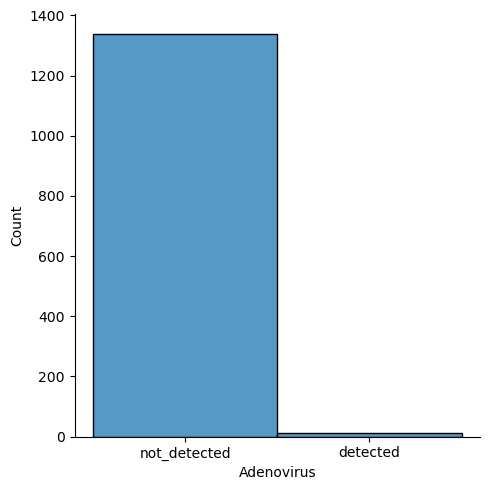

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

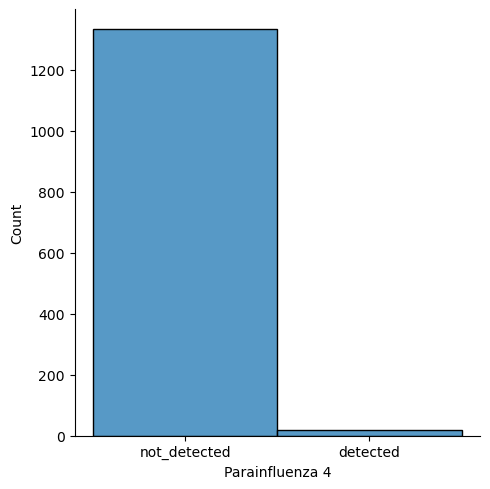

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

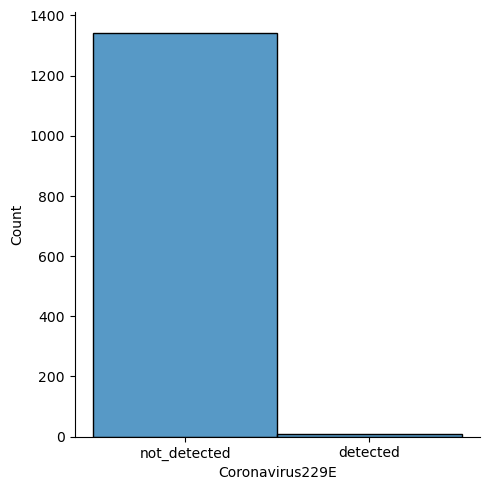

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

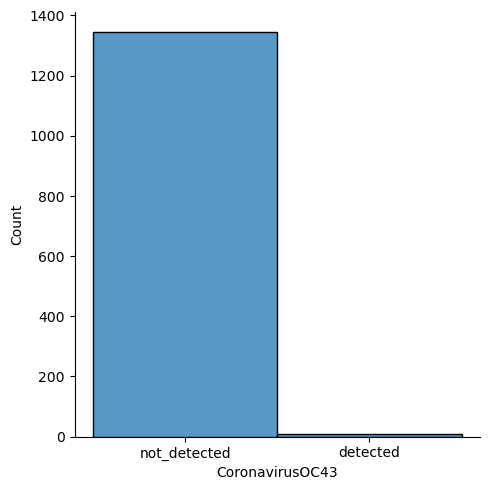

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

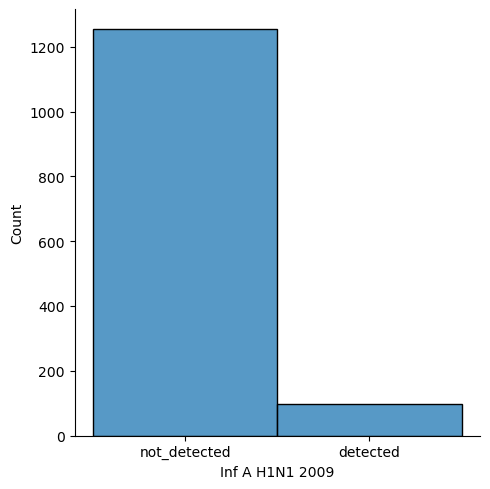

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

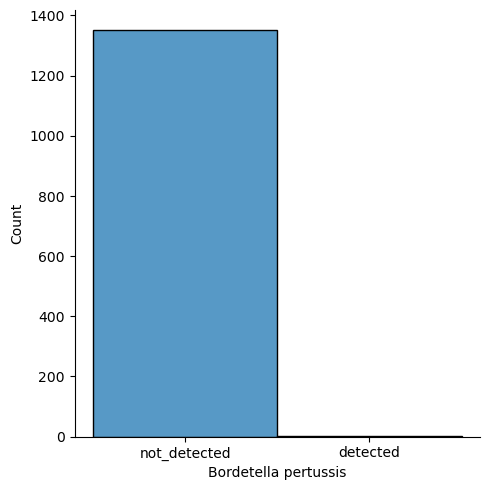

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

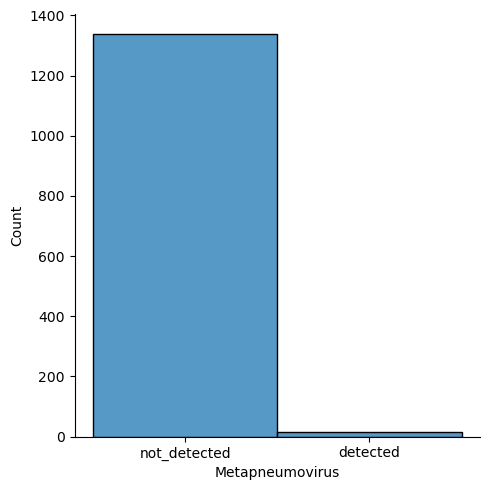

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

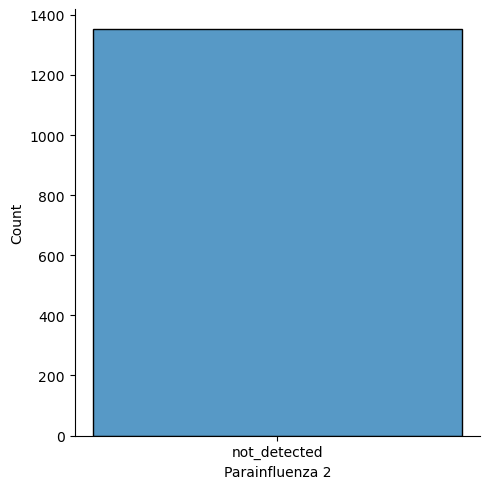

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

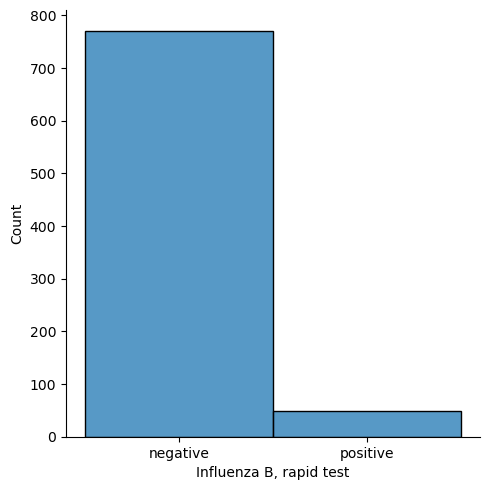

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

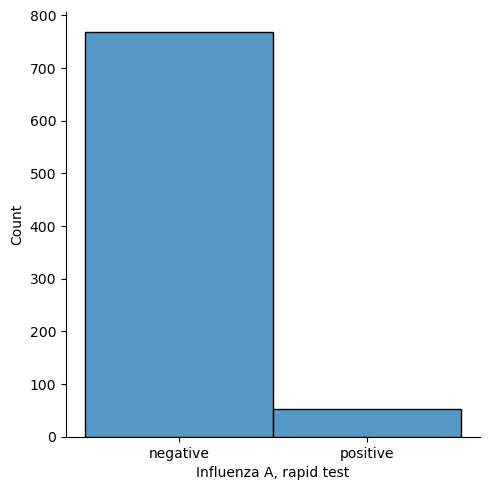

In [827]:
for col in select_features.select_dtypes("object"):
    plt.figure()
    sns.displot(data=select_features, x=col, )
    plt.show()

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


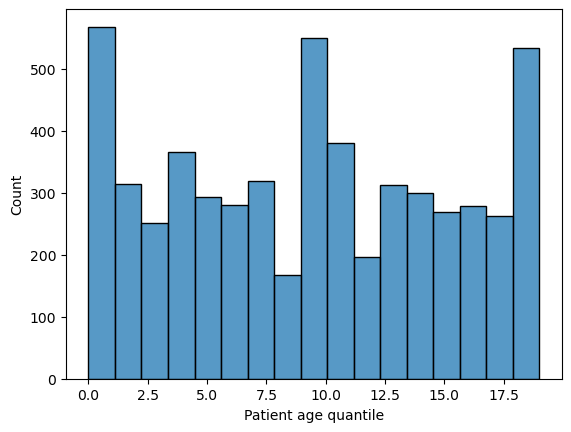

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


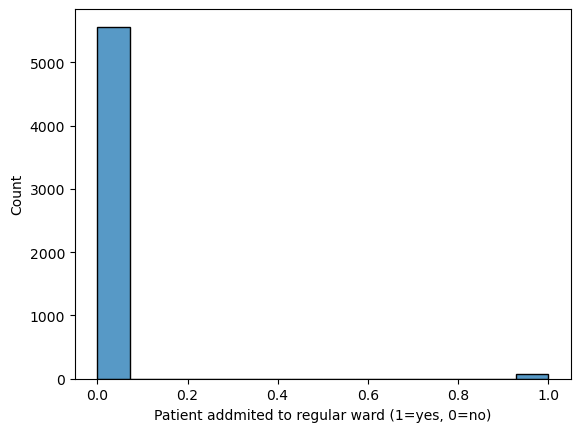

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


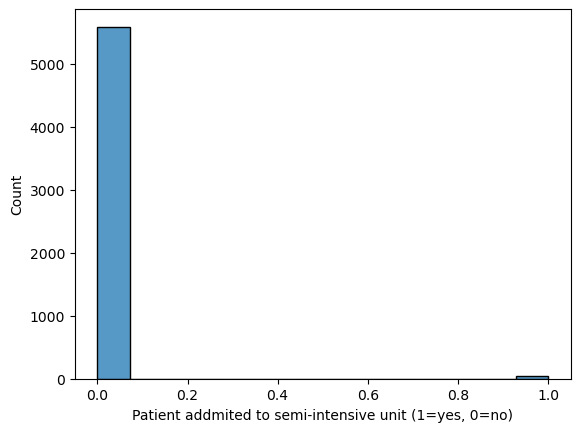

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


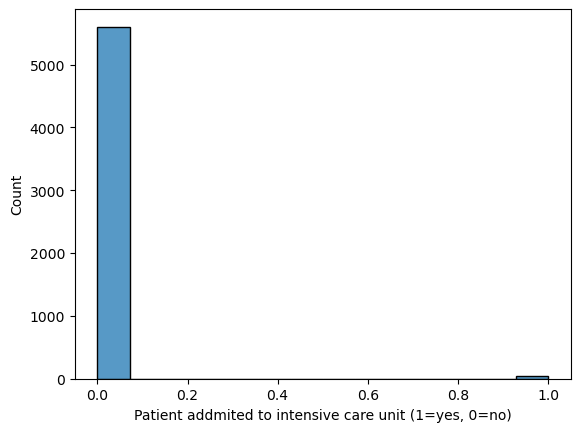

In [828]:
for col in select_features.select_dtypes("int"):
    plt.figure()
    sns.histplot(x=col, data=select_features,)
    plt.xlabel(col)
    plt.show()

#### Analyse the features columns

##### Creation of positive and negative dataframe

In [829]:
df_pos = select_features[y == "positive"]
df_pos

,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,...,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
67,7,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
284,16,1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
513,10,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
568,2,0,0,0,0.991838,0.792188,-0.341548,1.469188,1.653476,-0.048383,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
676,15,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5632,16,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5633,4,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5634,15,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5639,3,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [830]:
df_neg = select_features[y == "negative"]
df_neg

,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,...,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,13,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,8,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,15,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5637,12,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5638,14,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5640,17,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5641,4,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


##### Create Blood and viral columns

In [831]:
missing_rate = df_covid.isna().sum()/df_covid.shape[0]
missing_rate

Patient ID                                               0.000000
Patient age quantile                                     0.000000
SARS-Cov-2 exam result                                   0.000000
Patient addmited to regular ward (1=yes, 0=no)           0.000000
Patient addmited to semi-intensive unit (1=yes, 0=no)    0.000000
                                                           ...   
HCO3 (arterial blood gas analysis)                       0.995216
pO2 (arterial blood gas analysis)                        0.995216
Arteiral Fio2                                            0.996456
Phosphor                                                 0.996456
ctO2 (arterial blood gas analysis)                       0.995216
Length: 111, dtype: float64

In [832]:
blood_columns = df_covid.columns[(missing_rate < 0.90) &  (missing_rate > 0.88)]
blood_columns

Index(['Hematocrit', 'Hemoglobin', 'Platelets', 'Mean platelet volume ',
       'Red blood Cells', 'Lymphocytes',
       'Mean corpuscular hemoglobin concentration (MCHC)', 'Leukocytes',
       'Basophils', 'Mean corpuscular hemoglobin (MCH)', 'Eosinophils',
       'Mean corpuscular volume (MCV)', 'Monocytes',
       'Red blood cell distribution width (RDW)'],
      dtype='object')

In [833]:
viral_columns = df_covid.columns[(missing_rate < 0.88) &  (missing_rate > 0.75)]
viral_columns

Index(['Respiratory Syncytial Virus', 'Influenza A', 'Influenza B',
       'Parainfluenza 1', 'CoronavirusNL63', 'Rhinovirus/Enterovirus',
       'Coronavirus HKU1', 'Parainfluenza 3', 'Chlamydophila pneumoniae',
       'Adenovirus', 'Parainfluenza 4', 'Coronavirus229E', 'CoronavirusOC43',
       'Inf A H1N1 2009', 'Bordetella pertussis', 'Metapneumovirus',
       'Parainfluenza 2', 'Influenza B, rapid test',
       'Influenza A, rapid test'],
      dtype='object')

##### Relationship Target/Blood (Numerical variable)

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

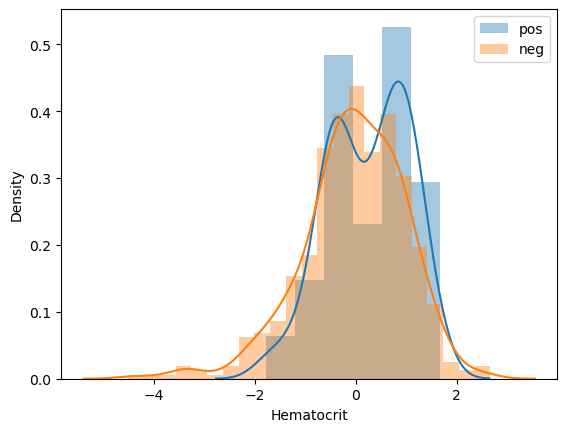

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

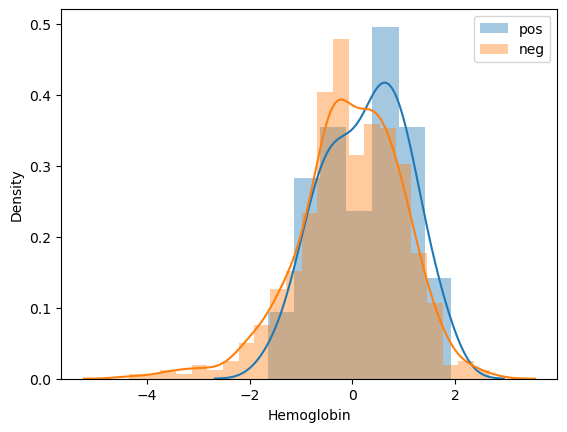

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

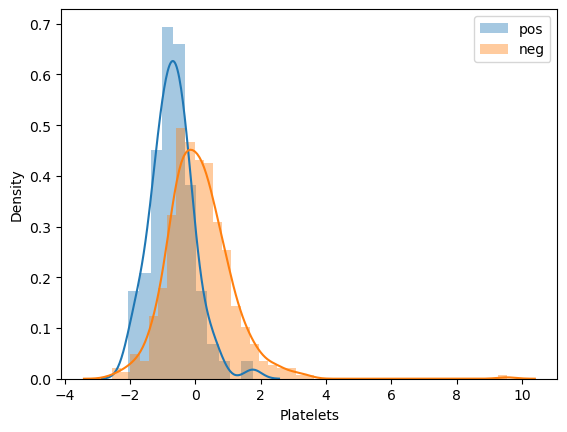

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

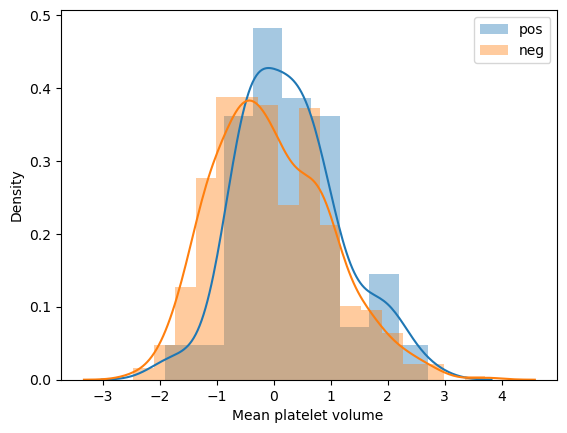

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

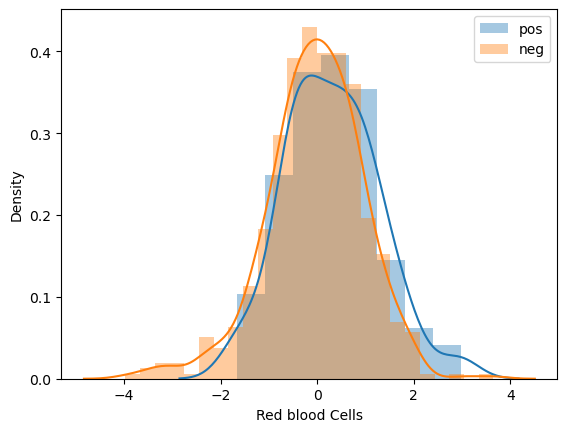

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

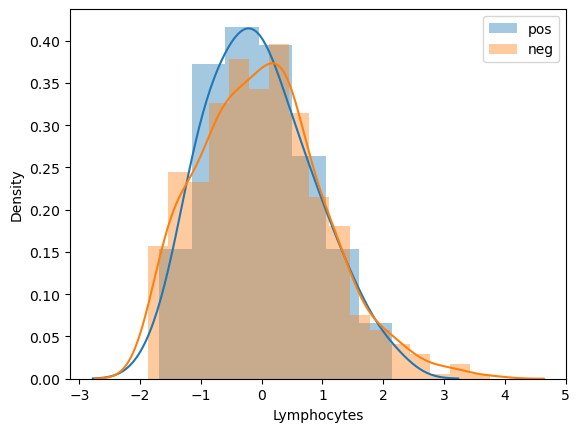

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

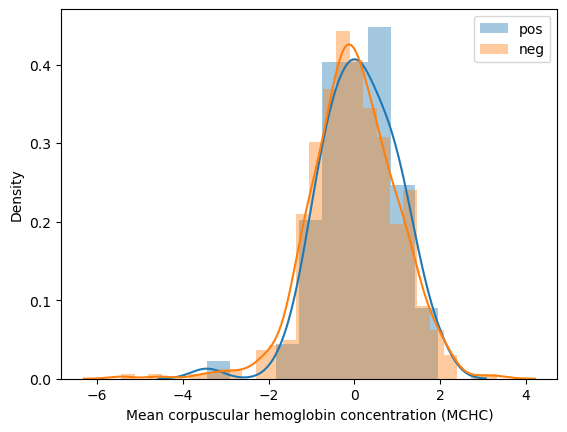

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

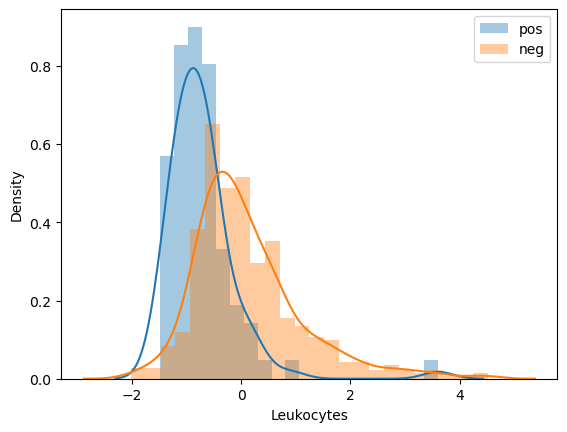

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

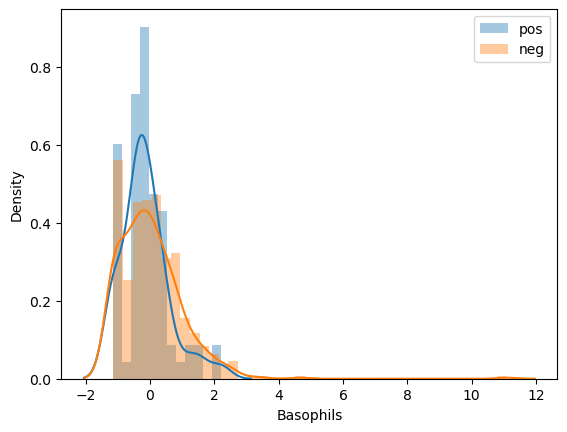

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

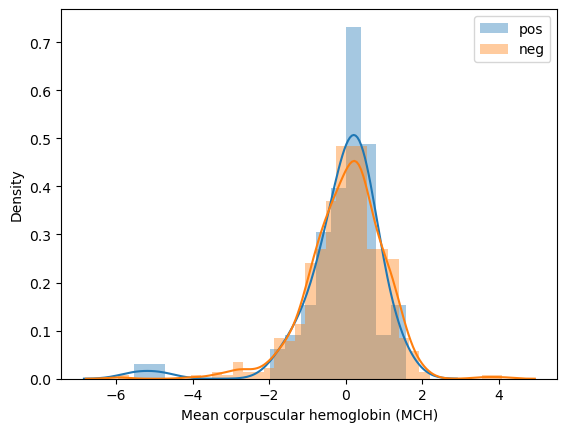

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

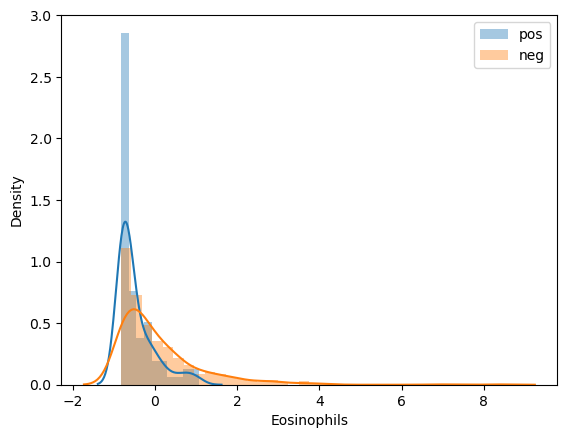

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

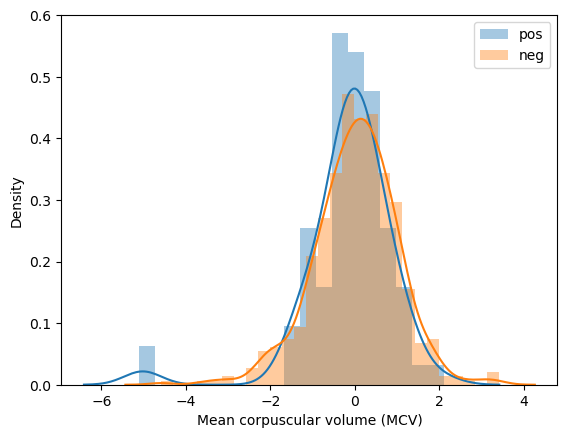

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

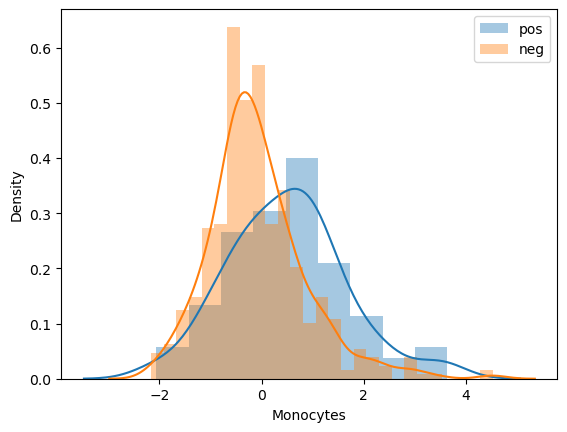

/tmp/ipykernel_26145/2923973364.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_pos[col], label="pos")
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2923973364.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level funct

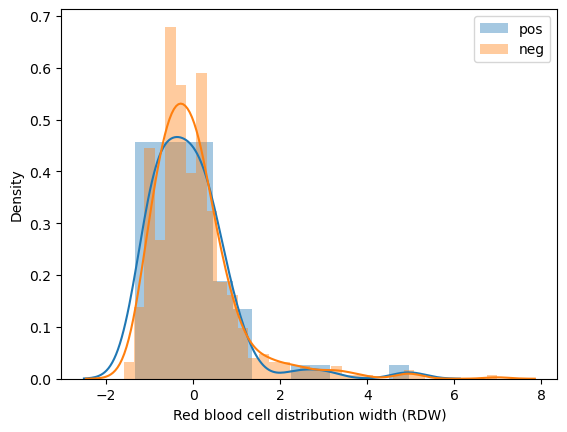

In [834]:
for col in blood_columns:
    plt.figure()
    sns.distplot(df_pos[col], label="pos")
    sns.distplot(df_neg[col], label="neg")
    plt.legend()
    plt.show()

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

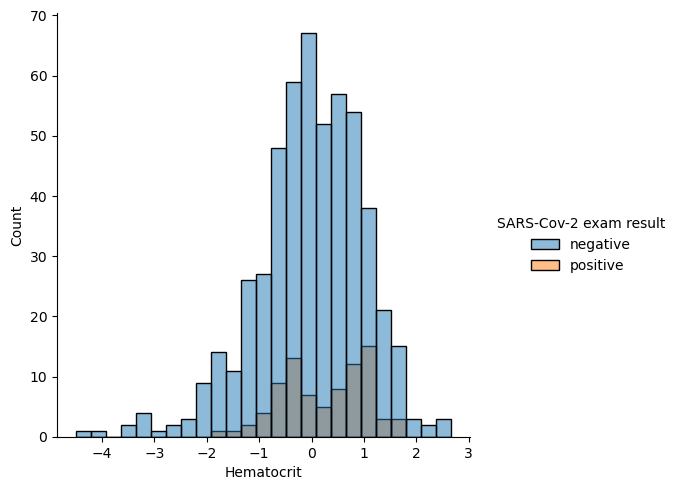

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

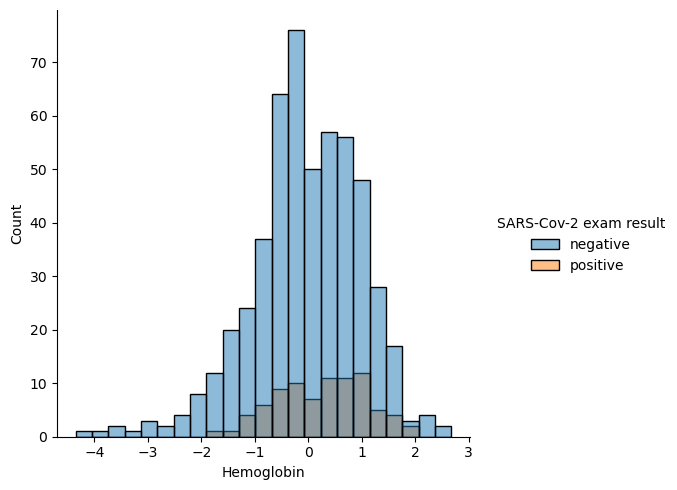

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

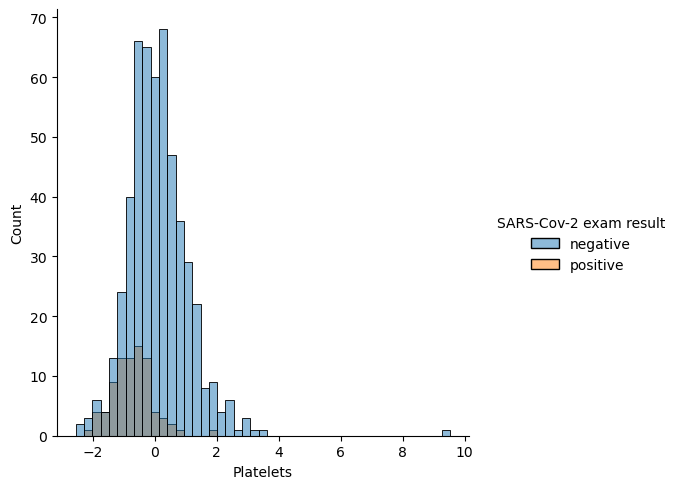

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

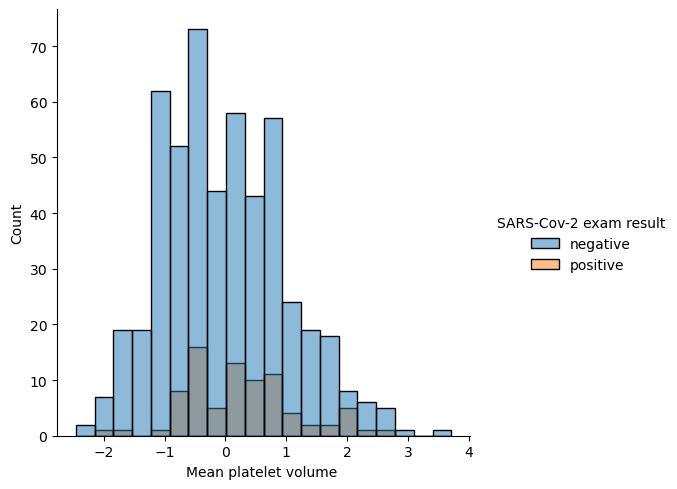

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

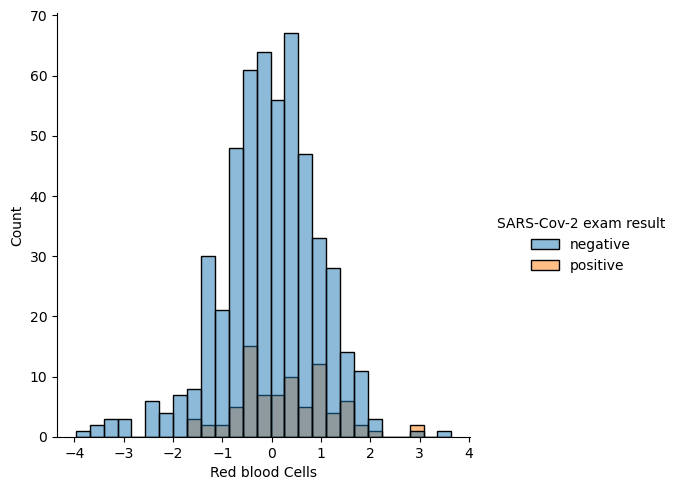

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

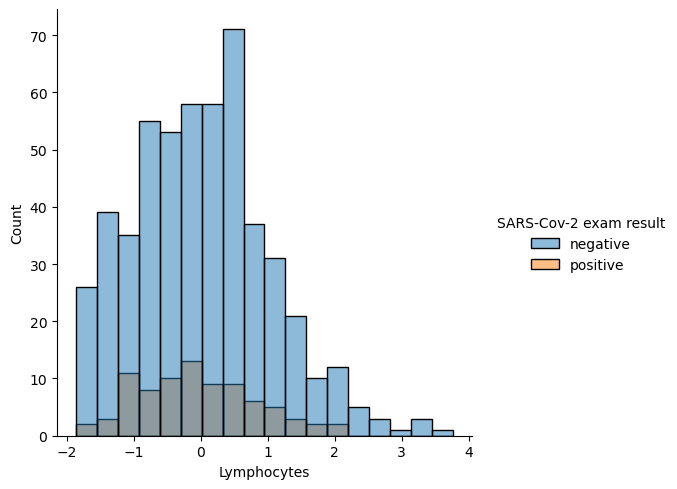

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

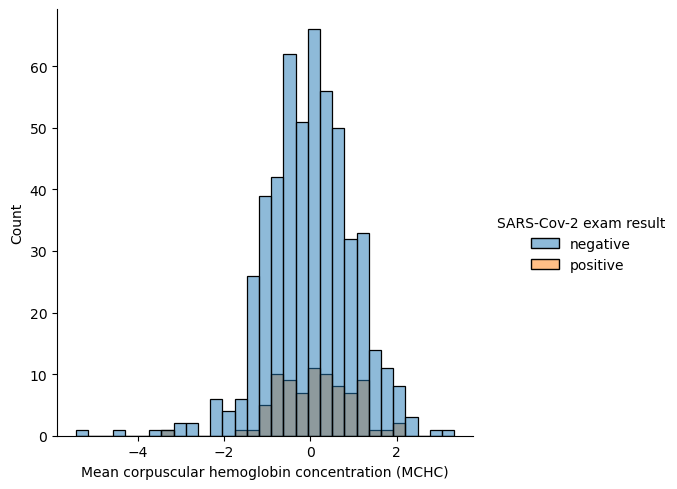

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

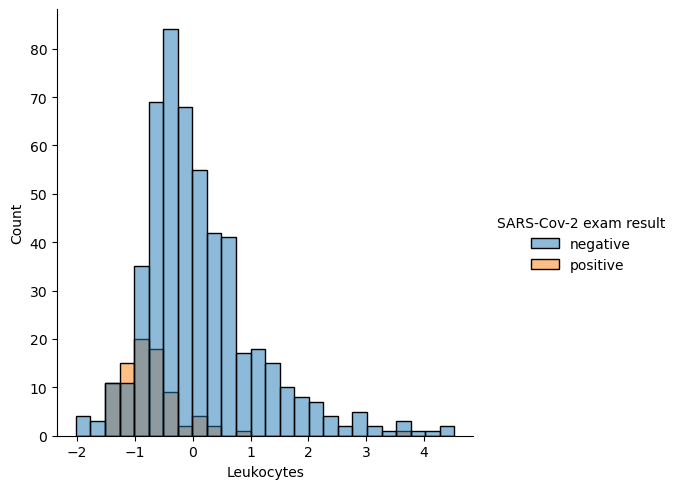

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

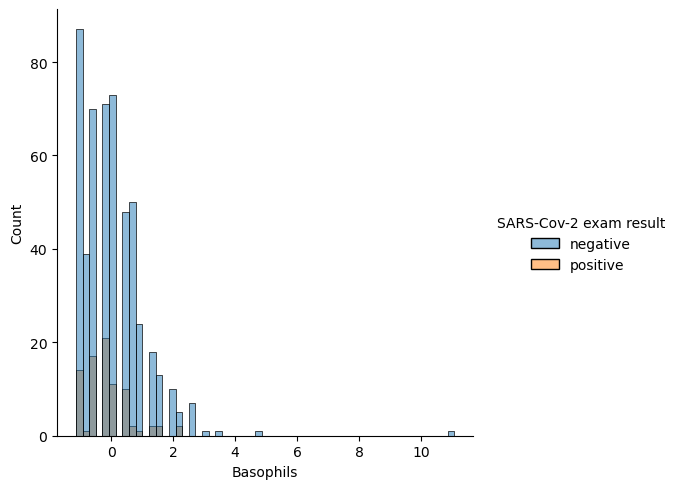

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

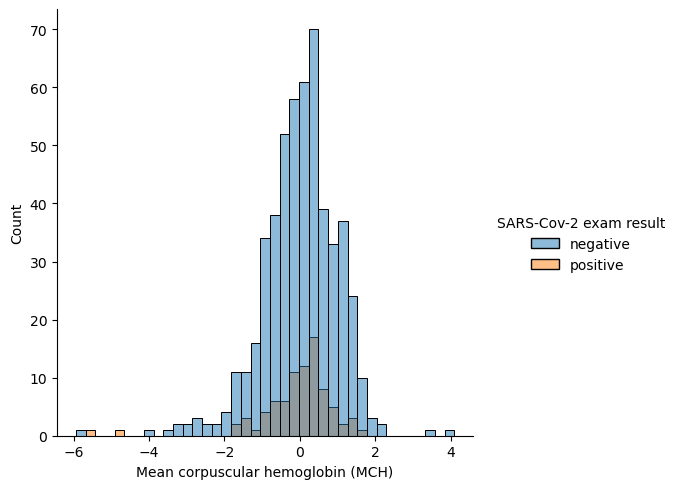

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

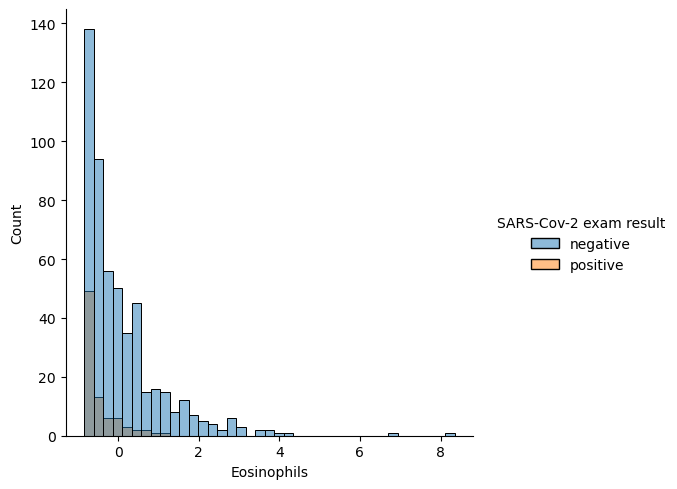

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

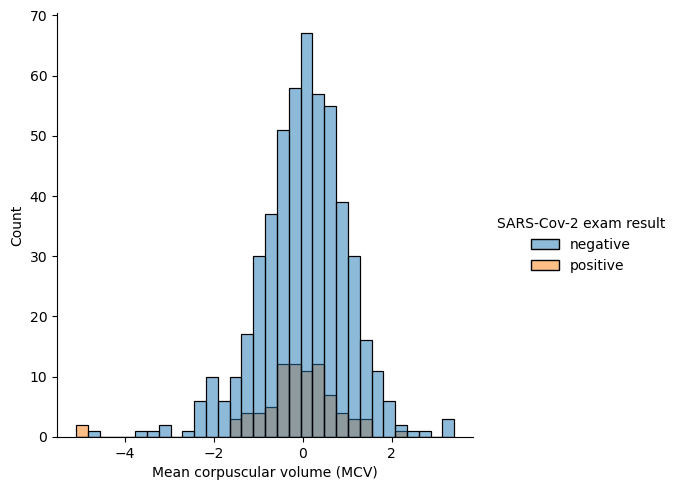

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

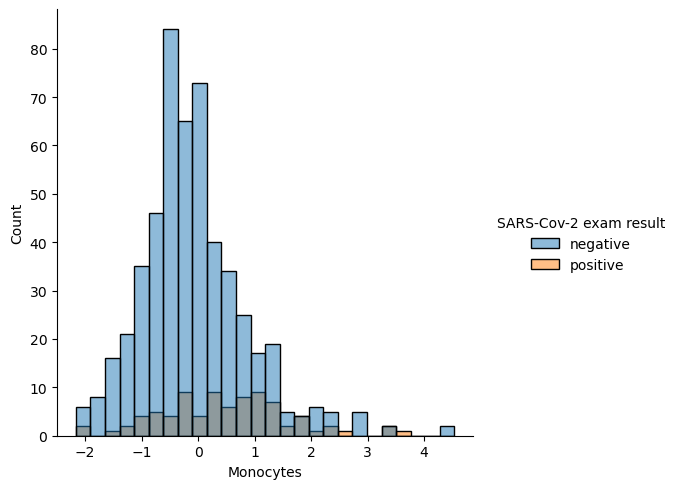

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

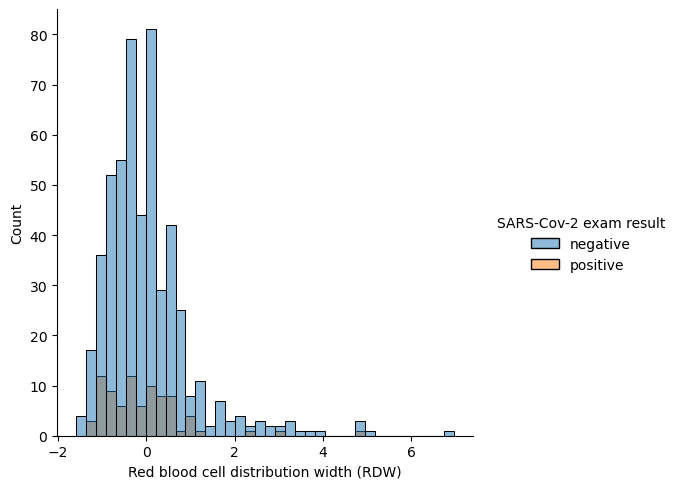

In [835]:
for col in blood_columns:
    plt.figure()
    sns.displot(data=select_features, x=col, hue=y)
    plt.show()

##### Relationship Target/age (Numerical variable)

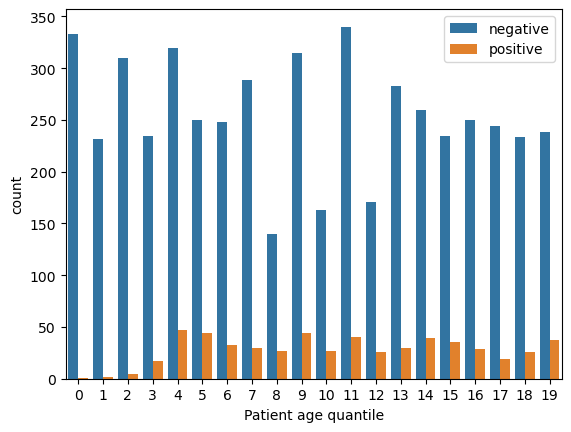

In [836]:
plt.figure()
sns.countplot(data=df_covid, x="Patient age quantile", hue=y)
plt.legend()
plt.show()

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

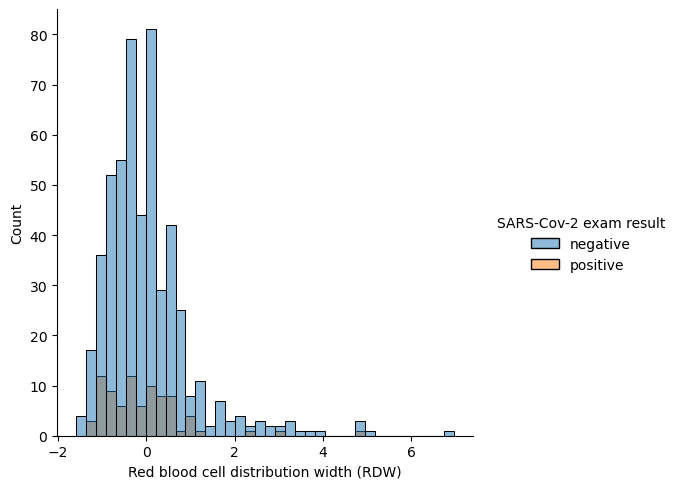

In [837]:
plt.figure()
sns.displot(data=select_features, x=col, hue=y)
plt.show()

##### Relationship Target/Viral (Categorical variable)

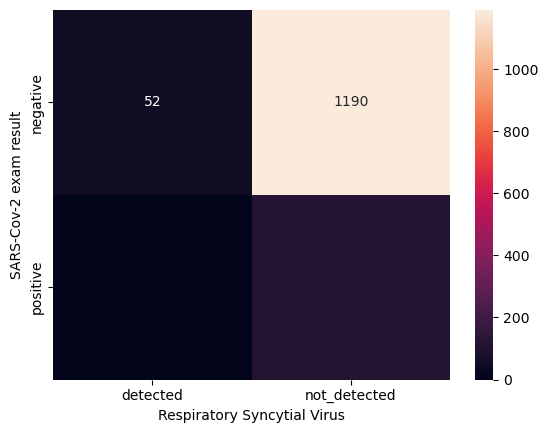

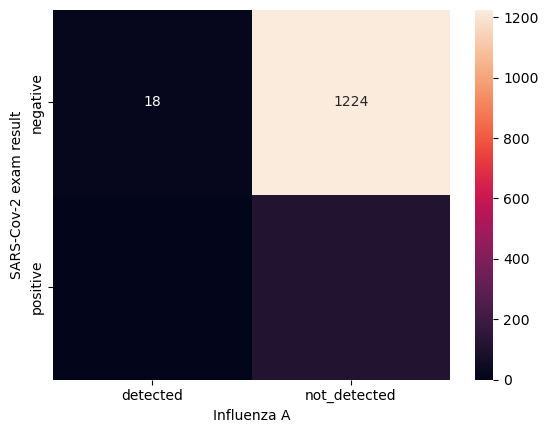

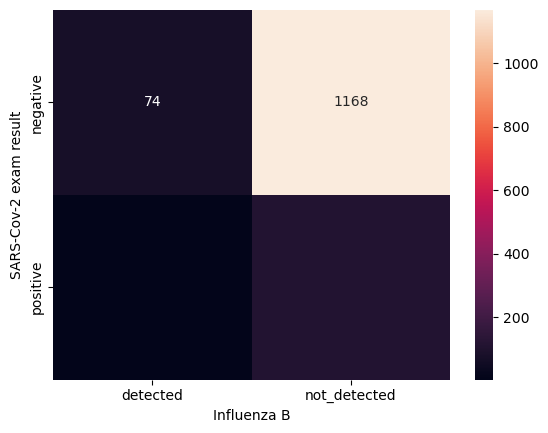

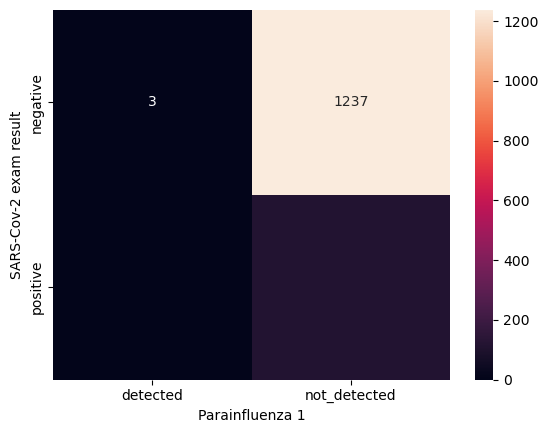

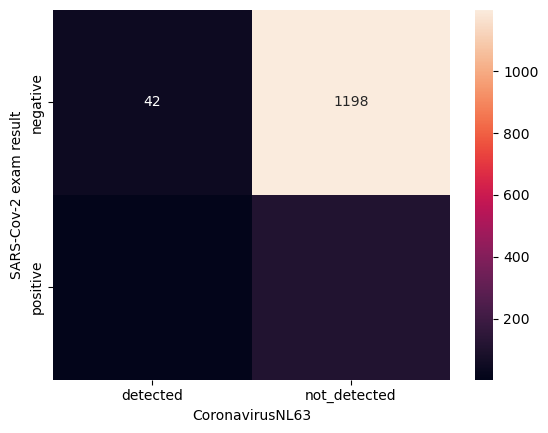

...

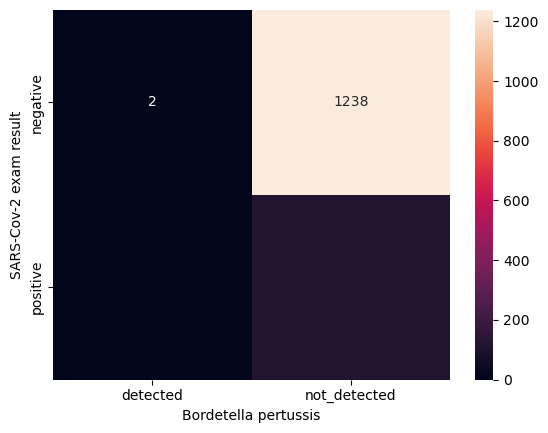

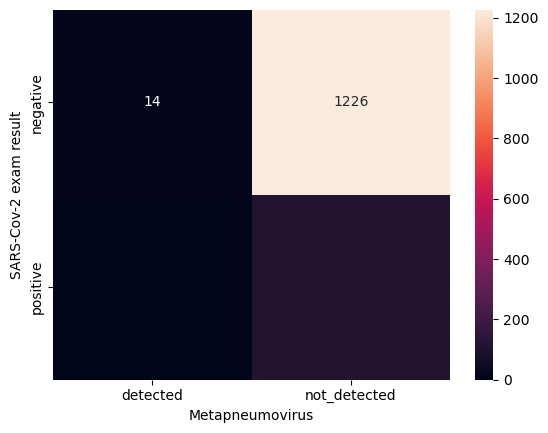

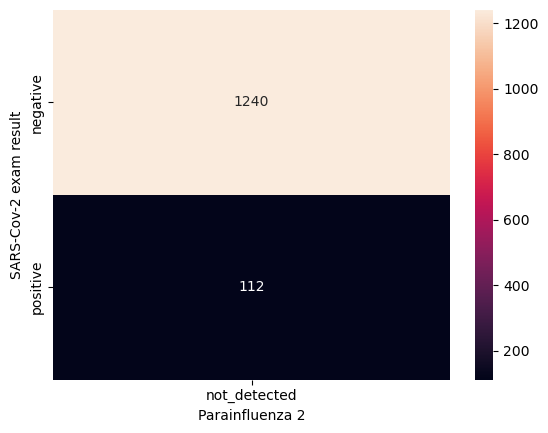

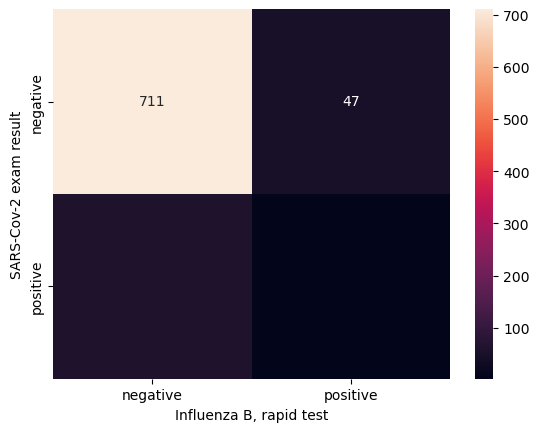

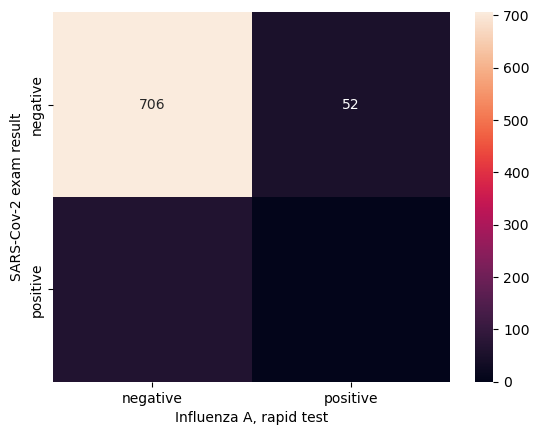

In [838]:
for col in viral_columns:
    plt.figure()
    sns.heatmap(pd.crosstab(y, select_features[col]), annot=True, fmt="d")
    plt.show()

In [839]:
# Identify the various features 

# (X) Patient ID [Categorical]: Patient identification
# (V) Patient age quantile [Numerical]
# (V) Patient addmited to regular ward (1=yes, 0=no) [Numerical]
# (V) Patient addmited to intensive care unit (1=yes, 0=no) [Numerical] 
# (V) Respiratory Syncytial Virus [Categorical]: Common respiratory virus that usually causes mild, cold-like symptoms.
# (V) Influenza A [Categorical] : Influenza A is a type of virus that causes influenza (the flu), a highly contagious respiratory illness.
# (V) Influenza B [Categorical] : Influenza B is one of the two types of influenza (flu) viruses that cause seasonal outbreaks of flu. It is highly contagious and can cause a range of symptoms like cough, headache, and chills
# (V) Parainfluenza 1 (Categorical]: Represent distinct serotypes defined by a lack of significant cross-neutralization and cross protection. 
# (V) Parainfluenza 2 (Categorical]: Represent distinct serotypes defined by a lack of significant cross-neutralization and cross protection.
# (V) Parainfluenza 3 (Categorical]: Represent distinct serotypes defined by a lack of significant cross-neutralization and cross protection. 
# (V) Parainfluenza 4 (Categorical]: Represent distinct serotypes defined by a lack of significant cross-neutralization and cross protection. 
# (V) CoronavirusNL63 [Categoriacal]: Infection, that cause were cough, fever, and inspiratory stridor. 
# (V) Rhinovirus/Enterovirus [Categorical]: The most common viral infectious agent in humans and is the predominant cause of the common cold. 
# (V) Coronavirus HKU1 [Categorical] : A common virus that causes symptomatic disease in only a relatively small percentage of infected persons.
# (V) Chlamydophila pneumoniae [Categorical] : A type of bacteria that causes respiratory tract infections, such as pneumonia (lung infection)
# (V) Adenovirus [Categorical] : A group of common viruses that can cause cold-like symptoms
# (V) Coronavirus229E [Categorical] : A species of coronavirus which infects humans and bats, it is one of the viruses responsible for the common cold
# (V) CoronavirusOC43 [Categorical] : A member of the species Betacoronavirus 1, which infects humans and cattle, it is one of the viruses responsible for the common cold[5][6] and may have been responsible for the 1889–1890 pandemic.
# (V) Inf A H1N1 2009 [Categorical] : Virus continues to circulate as a seasonal virus and is included in the vaccines against seasonal influenza.
# (V) Bordetella pertussis [Categorical] : Causes whooping cough (pertussis), an acute respiratory infection marked by severe, spasmodic coughing episodes during the paroxysmal phase.
# (V) Metapneumovirus [Categorical] : A negative-sense single-stranded RNA virus of the family Pneumoviridae and is closely related to the Avian metapneumovirus (AMPV) subgroup C


### DATASET ADVANCED ANALYSIS

#### Relation Variable/Variable

##### Relationship Blood/Blood

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Co

<Figure size 640x480 with 0 Axes>

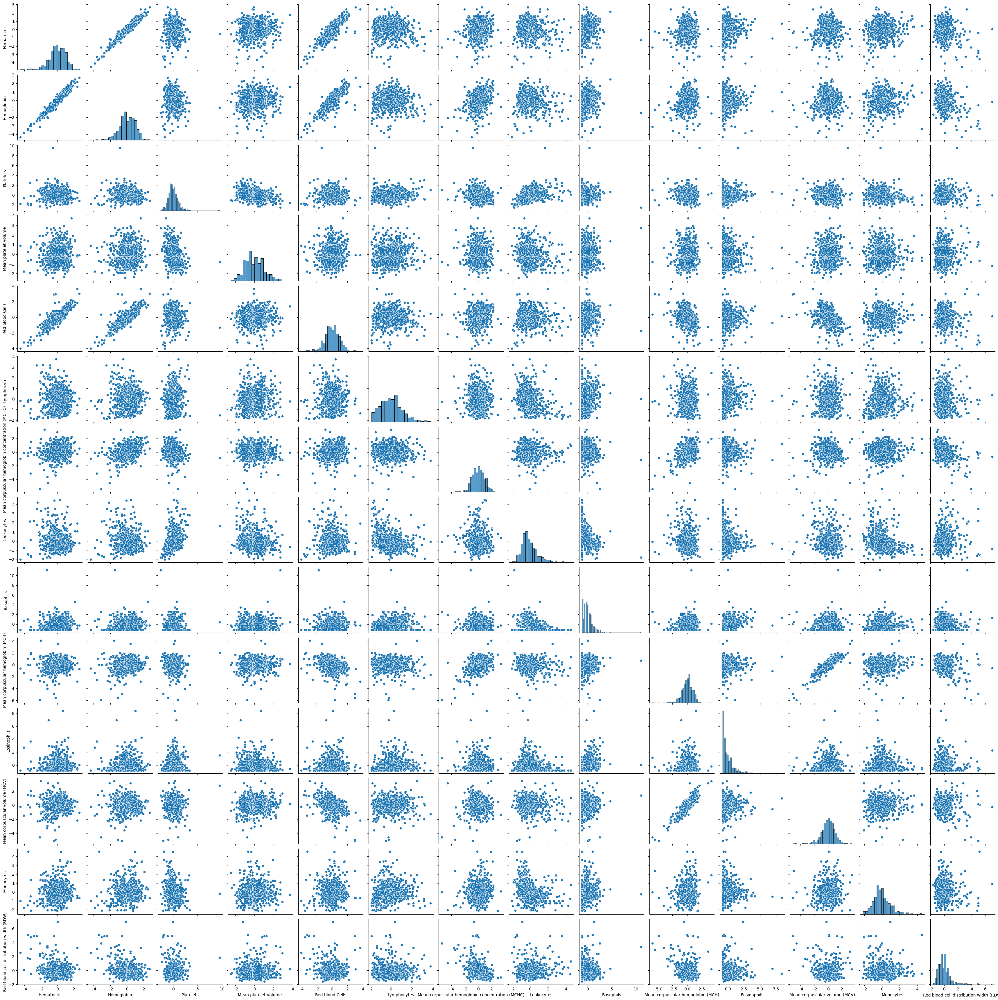

In [840]:
plt.figure()
sns.pairplot(select_features[blood_columns])
plt.show()

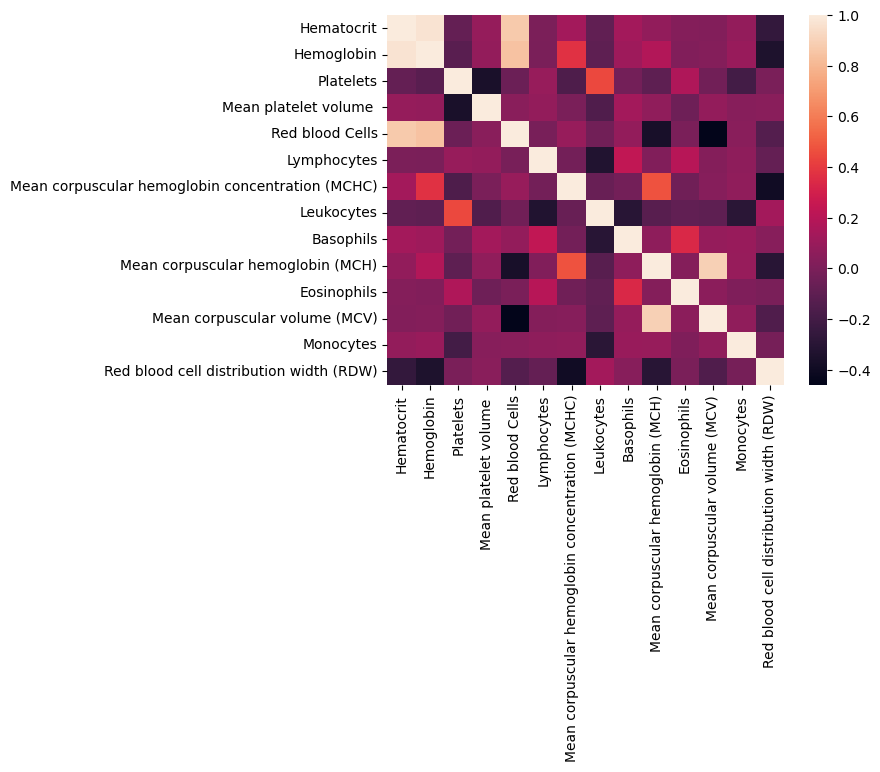

In [841]:
plt.figure()
sns.heatmap(select_features[blood_columns].corr())
plt.show()

<Figure size 640x480 with 0 Axes>

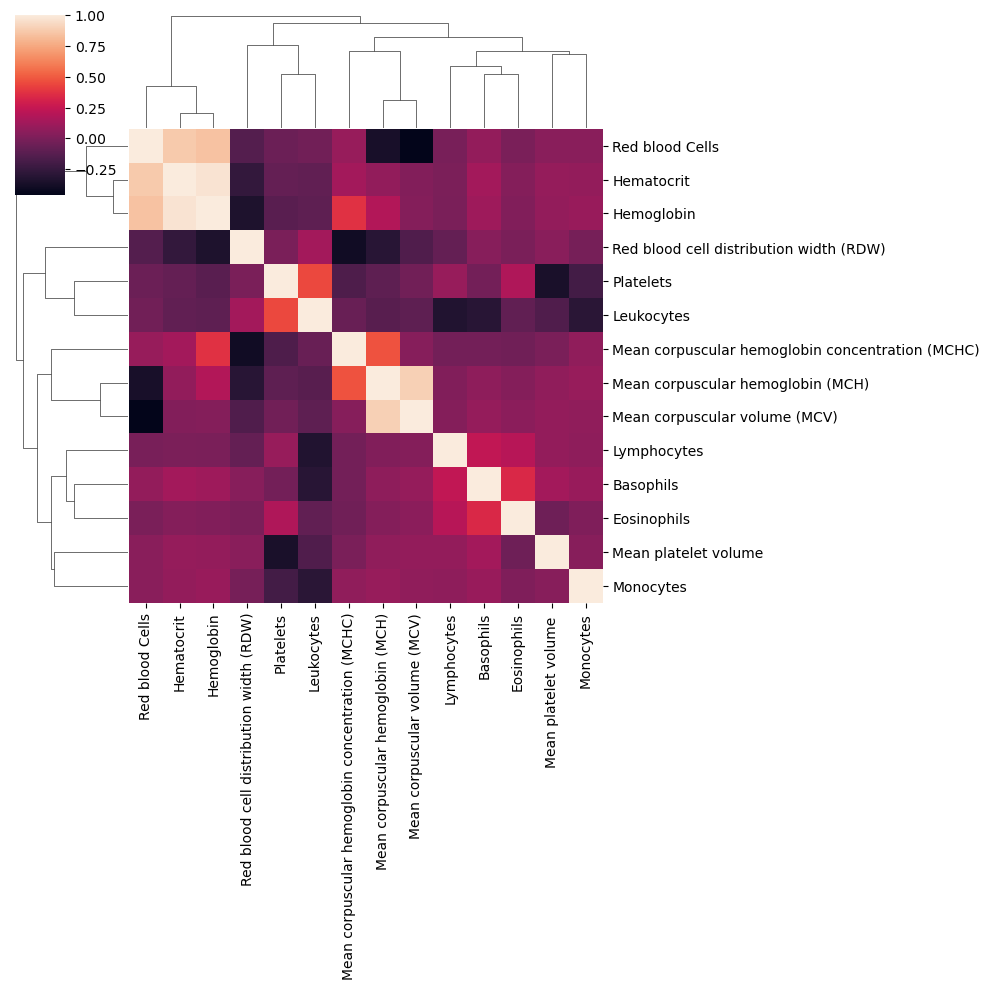

In [842]:
plt.figure()
sns.clustermap(select_features[blood_columns].corr())
plt.show()

##### Relationship Blood/Age

<Figure size 640x480 with 0 Axes>

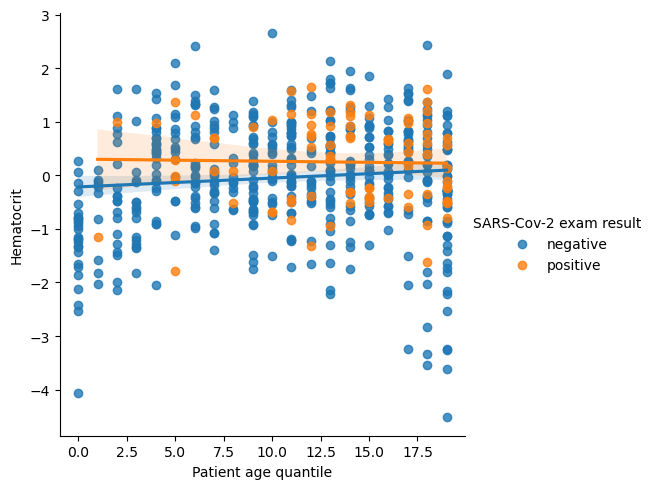

<Figure size 640x480 with 0 Axes>

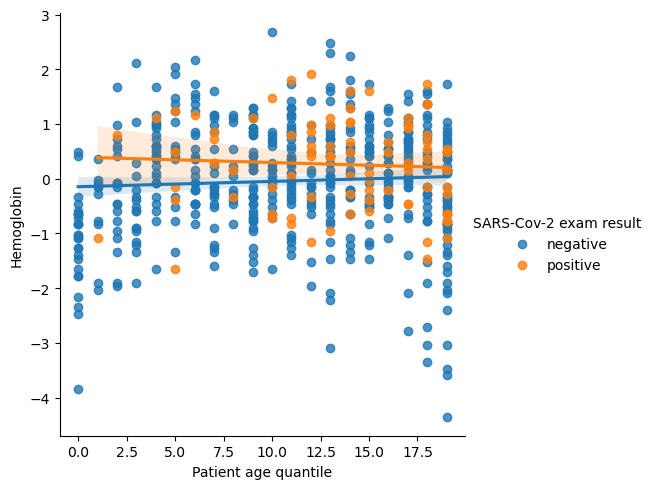

<Figure size 640x480 with 0 Axes>

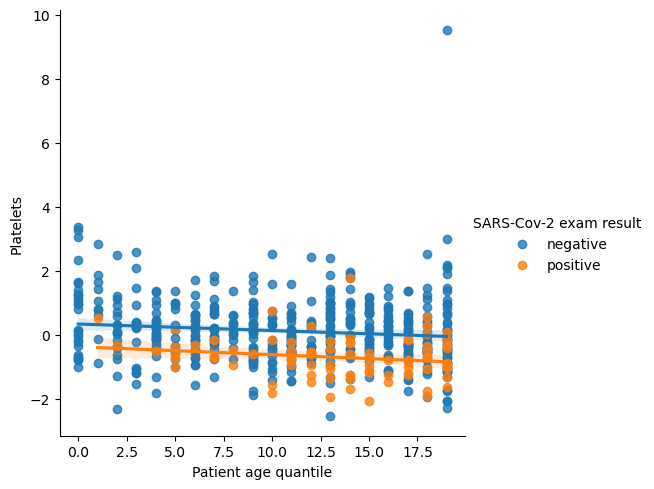

<Figure size 640x480 with 0 Axes>

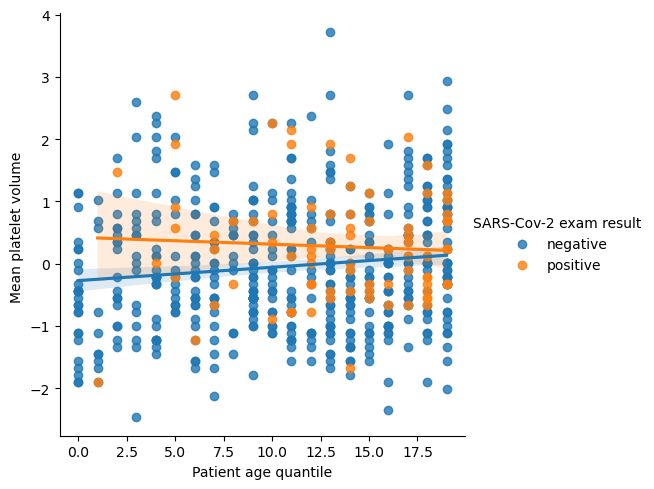

<Figure size 640x480 with 0 Axes>

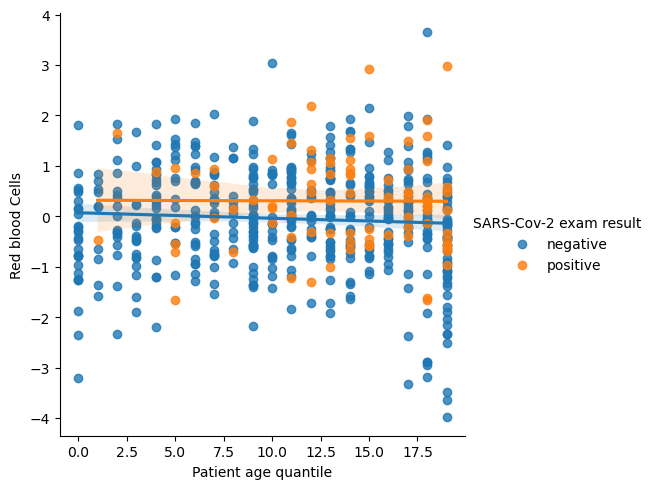

<Figure size 640x480 with 0 Axes>

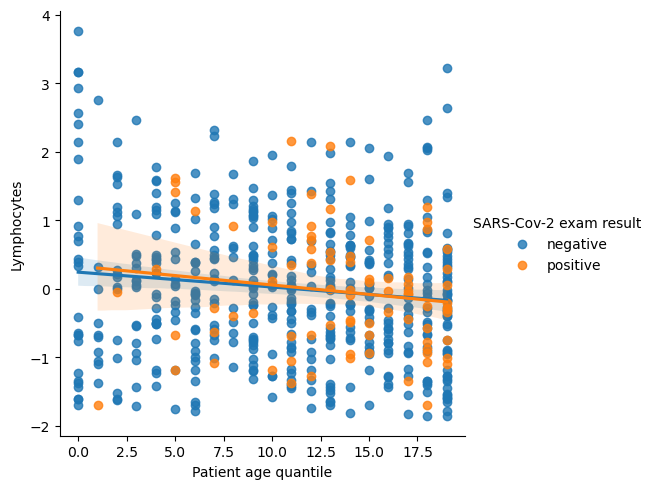

<Figure size 640x480 with 0 Axes>

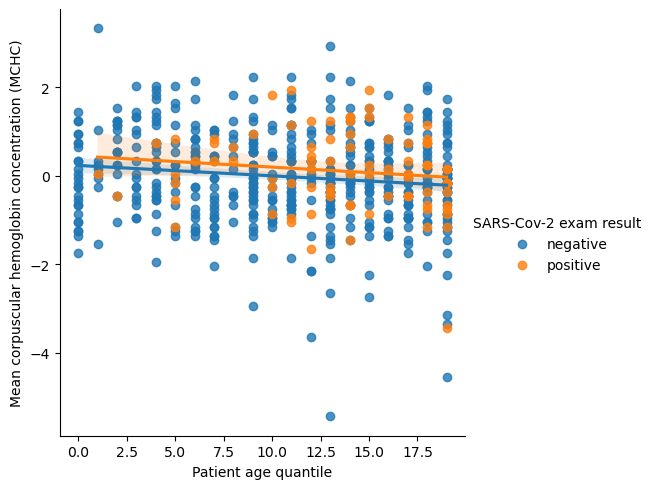

<Figure size 640x480 with 0 Axes>

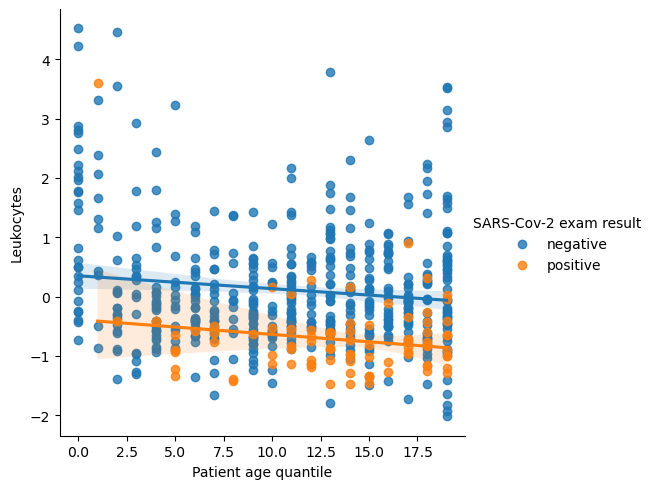

<Figure size 640x480 with 0 Axes>

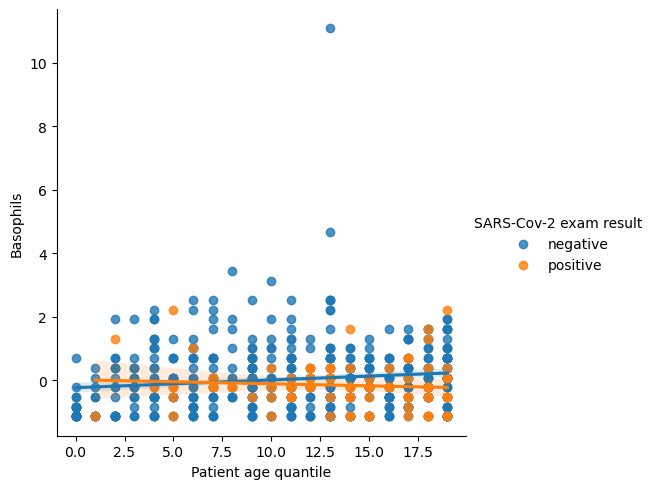

<Figure size 640x480 with 0 Axes>

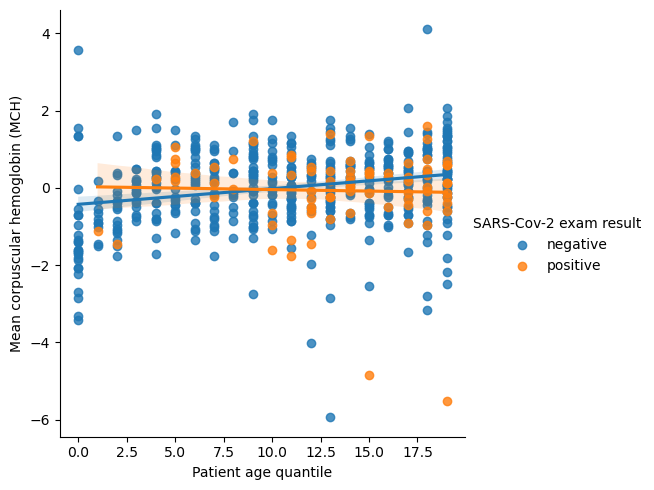

<Figure size 640x480 with 0 Axes>

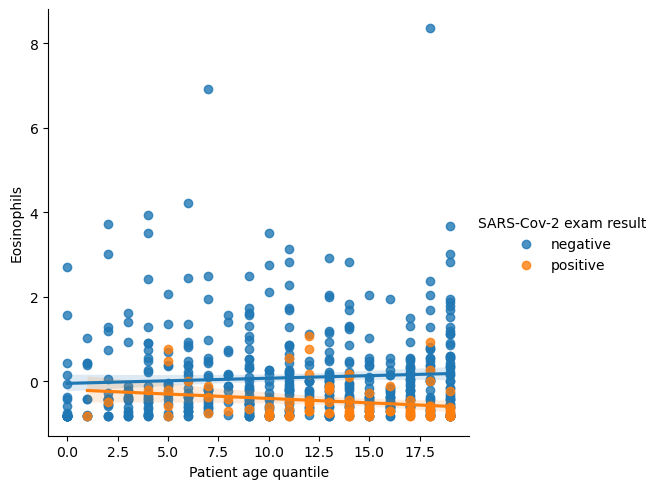

<Figure size 640x480 with 0 Axes>

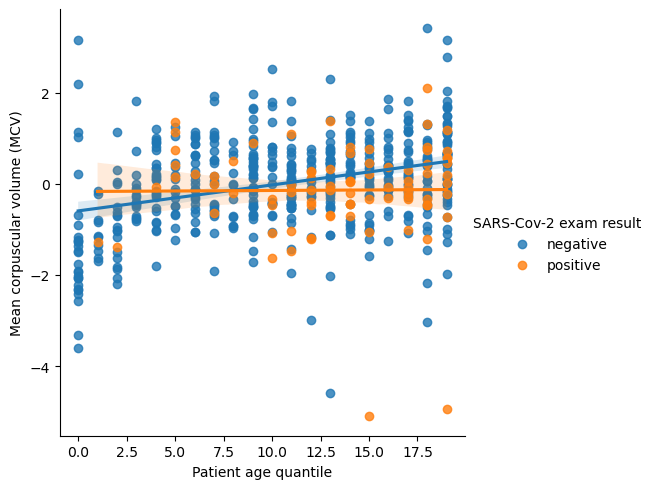

<Figure size 640x480 with 0 Axes>

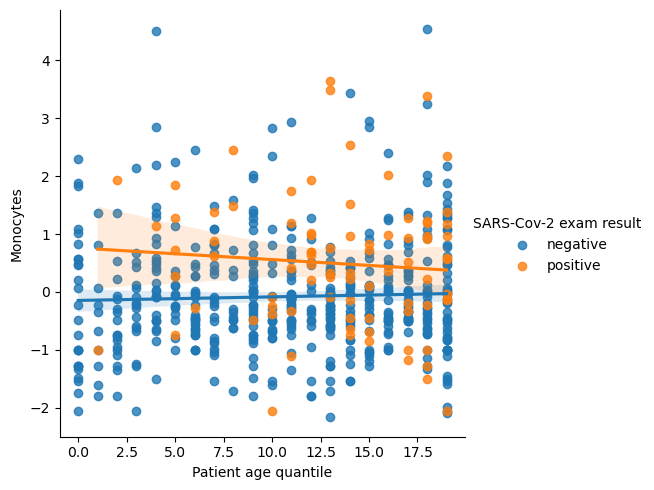

<Figure size 640x480 with 0 Axes>

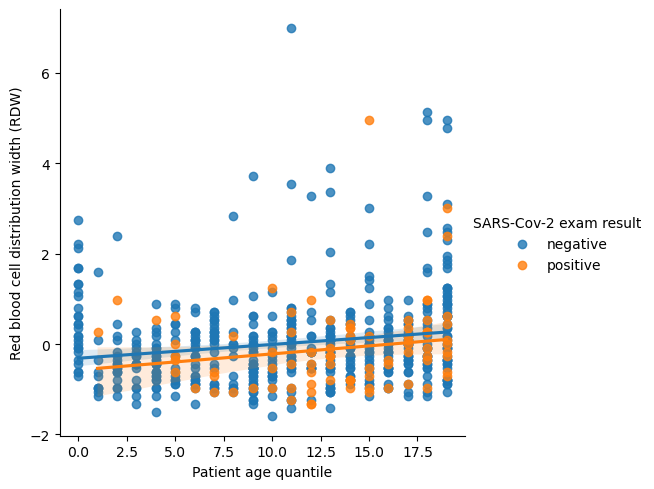

In [843]:
for col in blood_columns:
    plt.figure()
    sns.lmplot(data=df_covid, x="Patient age quantile", y=col, hue="SARS-Cov-2 exam result")
    plt.show()

In [844]:
age_plus_blood = ["Patient age quantile"]
for col in blood_columns:
    age_plus_blood.append(col)
select_features[age_plus_blood].corr()

,Patient age quantile,Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW)
Patient age quantile,1.000000,0.096808,0.060320,-0.158683,0.119449,-0.037510,-0.125935,-0.124671,-0.166386,0.107525,0.197394,0.022085,0.281655,0.050962,0.166429
Hematocrit,0.096808,1.000000,0.968447,-0.082296,0.083580,0.872987,0.002035,0.130771,-0.089937,0.129268,0.075216,0.029781,0.025161,0.082361,-0.264708
Hemoglobin,0.060320,0.968447,1.000000,-0.120150,0.078816,0.841420,-0.004105,0.371708,-0.102375,0.116389,0.184883,0.018618,0.027679,0.094586,-0.342426
Platelets,-0.158683,-0.082296,-0.120150,1.000000,-0.356332,-0.054561,0.090607,-0.159397,0.443056,-0.025990,-0.101245,0.169453,-0.033844,-0.200660,-0.008222
Mean platelet volume,0.119449,0.083580,0.078816,-0.356332,1.000000,0.043419,0.079060,-0.004011,-0.154643,0.128630,0.069457,-0.046539,0.078026,0.038380,0.045468
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Mean corpuscular hemoglobin (MCH),0.197394,0.075216,0.184883,-0.101245,0.069457,-0.367077,0.014736,0.474425,-0.124076,0.064536,1.000000,0.029756,0.895277,0.092752,-0.300411
Eosinophils,0.022085,0.029781,0.018618,0.169453,-0.046539,-0.004408,0.199562,-0.042352,-0.092125,0.334993,0.029756,1.000000,0.053551,0.009467,-0.007753
Mean corpuscular volume (MCV),0.281655,0.025161,0.027679,-0.033844,0.078026,-0.458531,0.026927,0.035352,-0.102604,0.085057,0.895277,0.053551,1.000000,0.066071,-0.151982
Monocytes,0.050962,0.082361,0.094586,-0.200660,0.038380,0.045172,0.065313,0.070070,-0.294731,0.098610,0.092752,0.009467,0.066071,1.000000,-0.016368


In [845]:
#Retreive correlation between Blood and Age
select_features[age_plus_blood].corr()["Patient age quantile"].sort_values()

Leukocytes                                         -0.166386
Platelets                                          -0.158683
Lymphocytes                                        -0.125935
Mean corpuscular hemoglobin concentration (MCHC)   -0.124671
Red blood Cells                                    -0.037510
                                                      ...   
Mean platelet volume                                0.119449
Red blood cell distribution width (RDW)             0.166429
Mean corpuscular hemoglobin (MCH)                   0.197394
Mean corpuscular volume (MCV)                       0.281655
Patient age quantile                                1.000000
Name: Patient age quantile, Length: 15, dtype: float64

##### Relationship Virus/Virus

In [846]:
select_features[viral_columns]

,Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5639,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5640,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5642,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [847]:
#Relation between Influenza and quick test
pd.crosstab(select_features["Influenza A"], select_features["Influenza A, rapid test"])

"Influenza A, rapid test",negative,positive
Influenza A,,
detected,2,4
not_detected,245,15


In [848]:
pd.crosstab(select_features["Influenza B"], select_features["Influenza B, rapid test"])

"Influenza B, rapid test",negative,positive
Influenza B,,
detected,18,11
not_detected,233,4


In [849]:
viral_columns

Index(['Respiratory Syncytial Virus', 'Influenza A', 'Influenza B',
       'Parainfluenza 1', 'CoronavirusNL63', 'Rhinovirus/Enterovirus',
       'Coronavirus HKU1', 'Parainfluenza 3', 'Chlamydophila pneumoniae',
       'Adenovirus', 'Parainfluenza 4', 'Coronavirus229E', 'CoronavirusOC43',
       'Inf A H1N1 2009', 'Bordetella pertussis', 'Metapneumovirus',
       'Parainfluenza 2', 'Influenza B, rapid test',
       'Influenza A, rapid test'],
      dtype='object')

##### Relationship Virus/Blood

In [850]:
#Retreive the sick patient dataframe (positive to virus)
df_sick_patient = select_features[viral_columns] == "detected"
df_sick_patient

,Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5639,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5640,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5641,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5642,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [851]:
sr_sick_patient_num = np.sum(df_sick_patient , axis=1)
sr_sick_patient_num

0       0
1       1
2       0
3       0
4       1
       ..
5639    0
5640    0
5641    0
5642    0
5643    0
Length: 5644, dtype: int64

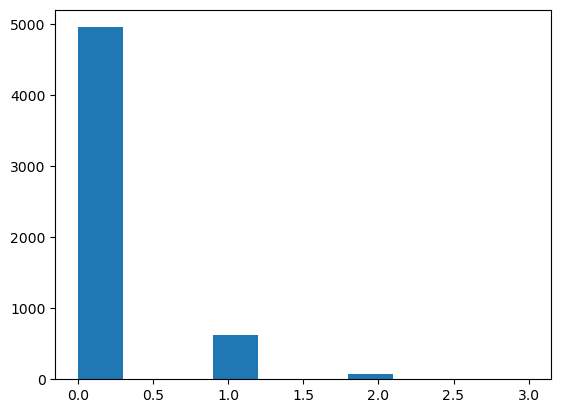

In [852]:
plt.figure()
plt.hist(sr_sick_patient_num)
plt.show()

In [853]:
sr_sick_patient_bool = sr_sick_patient_num >= 1
sr_sick_patient_bool.head()

0    False
1     True
2    False
3    False
4     True
dtype: bool

In [854]:
sr_sick_patient_bool.value_counts()

False    4952
True      692
Name: count, dtype: int64

In [855]:
select_features["sick"] = sr_sick_patient_bool
select_features

,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,...,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test",sick
0,13,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
1,17,0,0,0,0.236515,-0.022340,-0.517413,0.010677,0.102004,0.318366,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative,True
2,8,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
3,5,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
4,15,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5639,3,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
5640,17,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
5641,4,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
5642,10,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False


/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

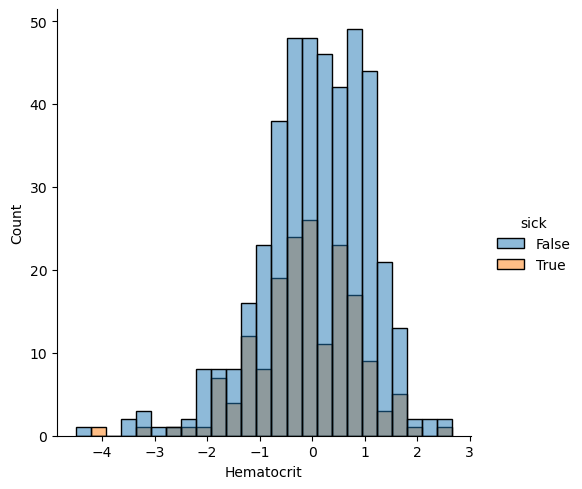

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

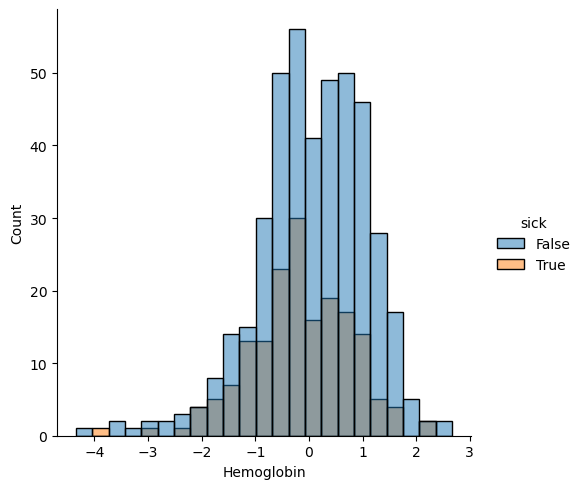

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

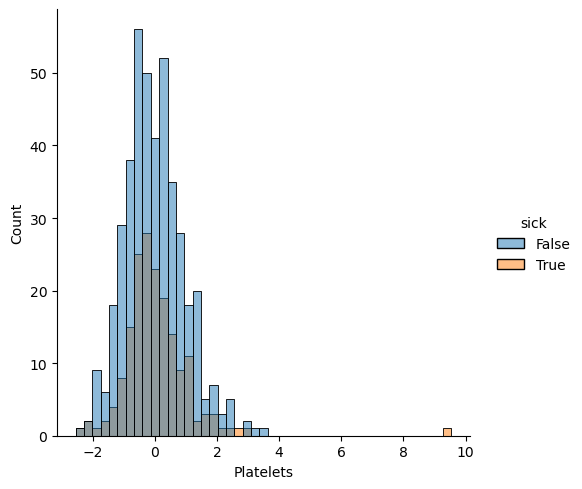

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

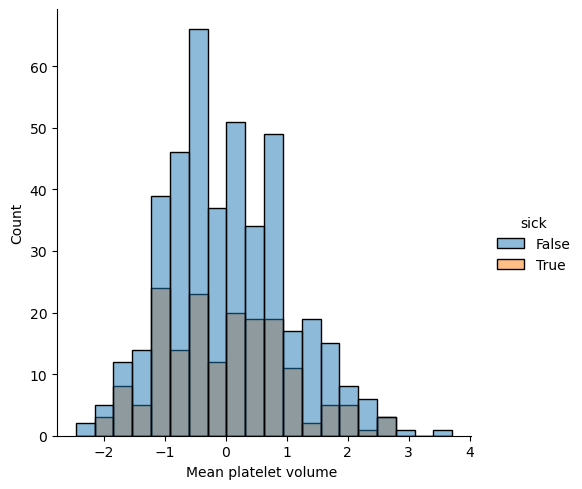

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

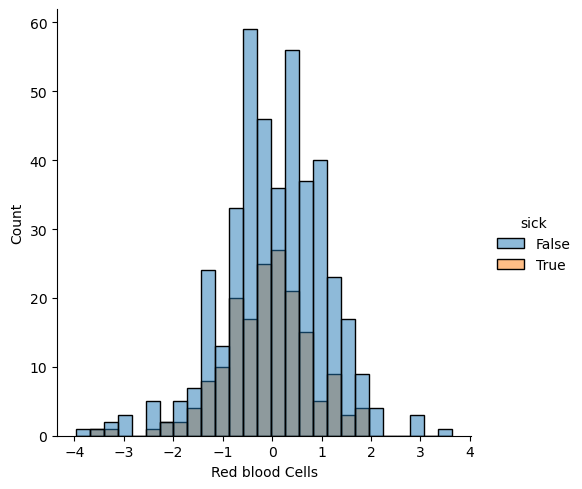

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

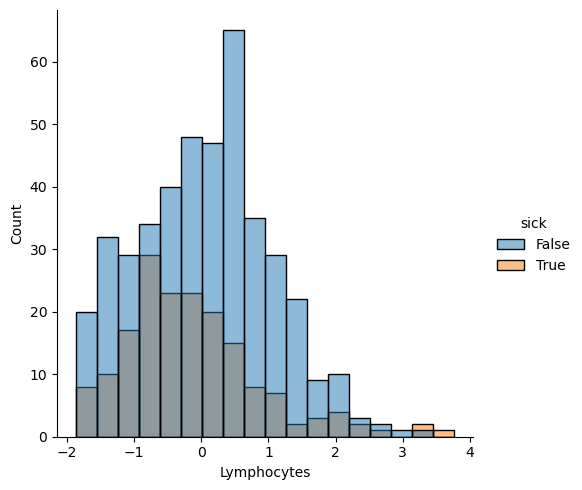

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

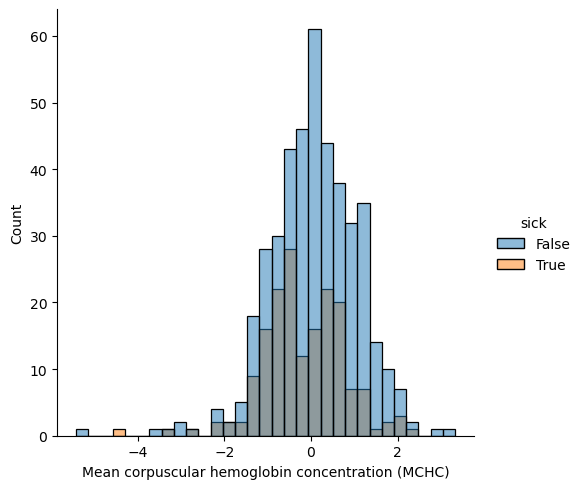

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

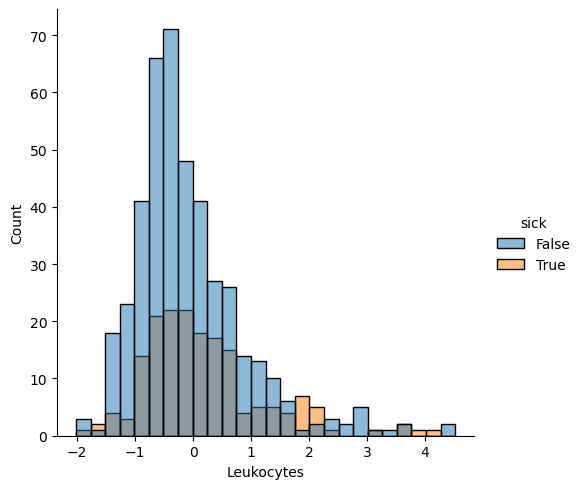

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

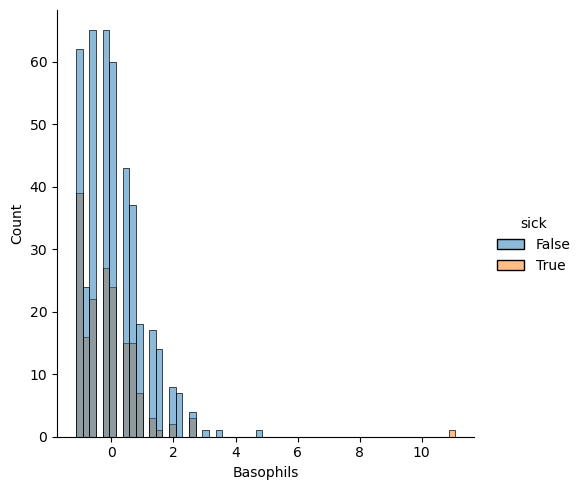

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

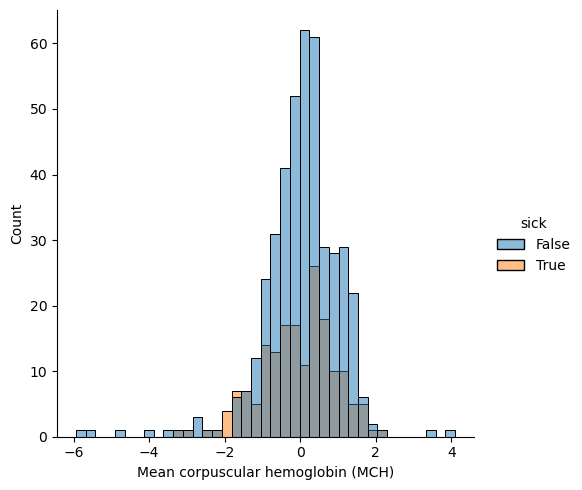

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

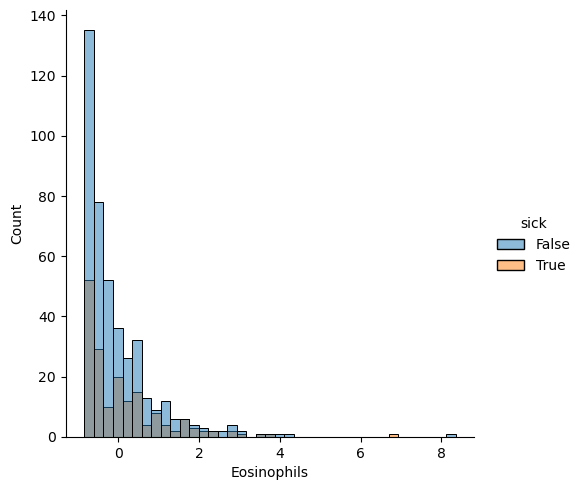

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

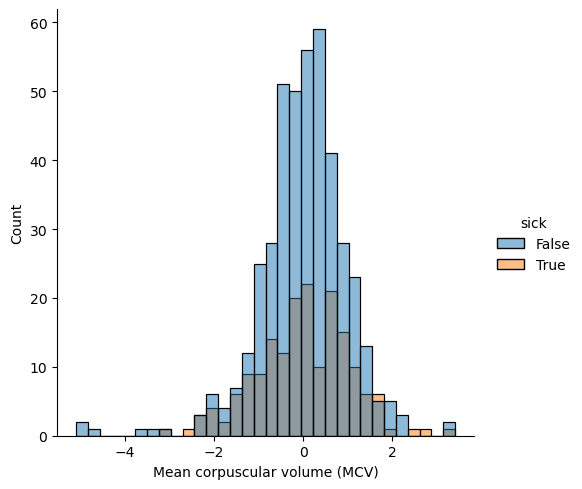

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

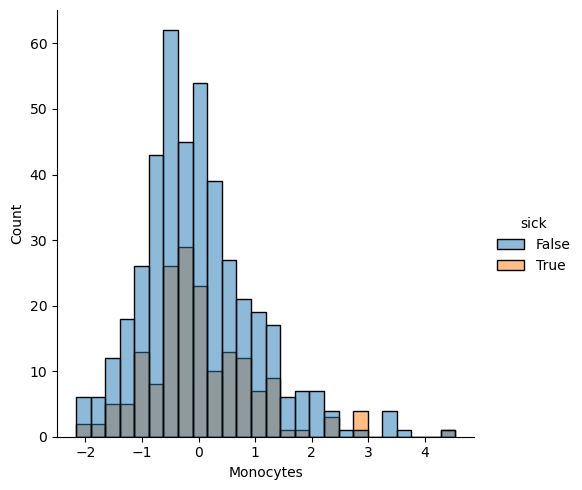

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

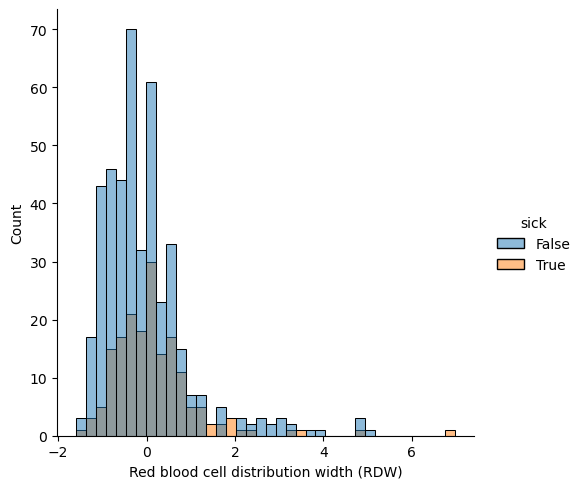

In [856]:
for col in blood_columns:
    plt.figure()
    sns.displot(data=select_features, x= col,  hue="sick")
    plt.show()

##### Relationship Hospistalisation/sickness

In [857]:
def hospitalisation(df):
    if df['Patient addmited to regular ward (1=yes, 0=no)'] == 1 :
        return "surveillance"
    if df['Patient addmited to semi-intensive unit (1=yes, 0=no)'] == 1 :
        return "semi-intensive"
    if df['Patient addmited to intensive care unit (1=yes, 0=no)'] == 1 :
        return "intensive"
    else:
        return "unknow"

In [858]:
# Create Series for hospitalisation status 
select_features["Hopspitalisation Status"] =  df_covid.apply(hospitalisation, axis=1)

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

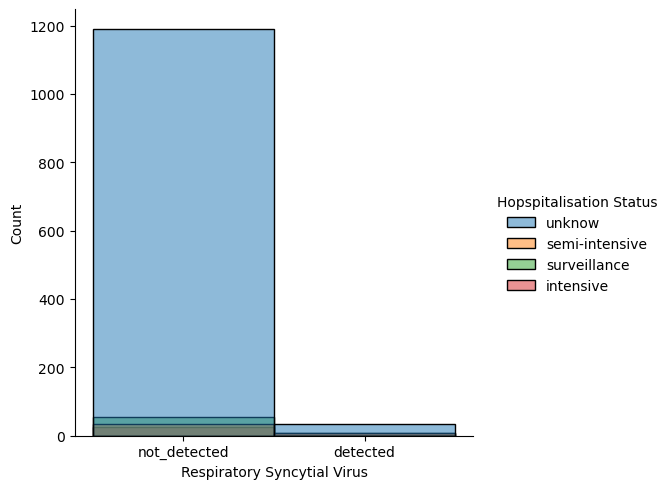

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

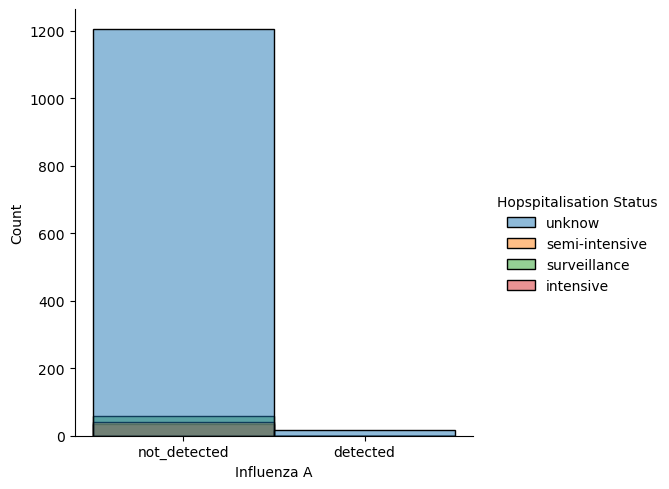

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

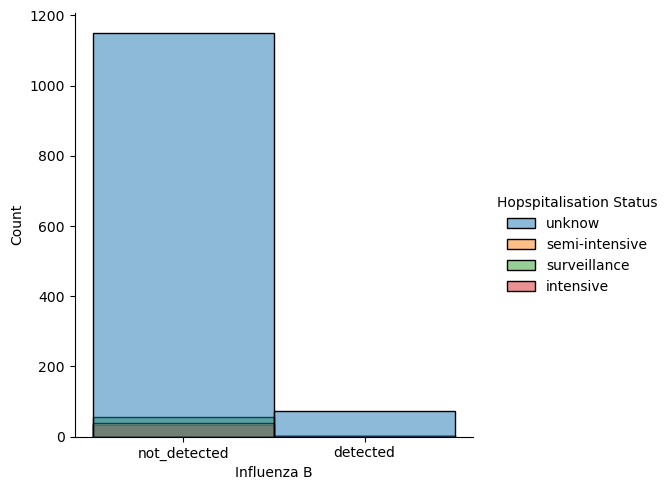

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

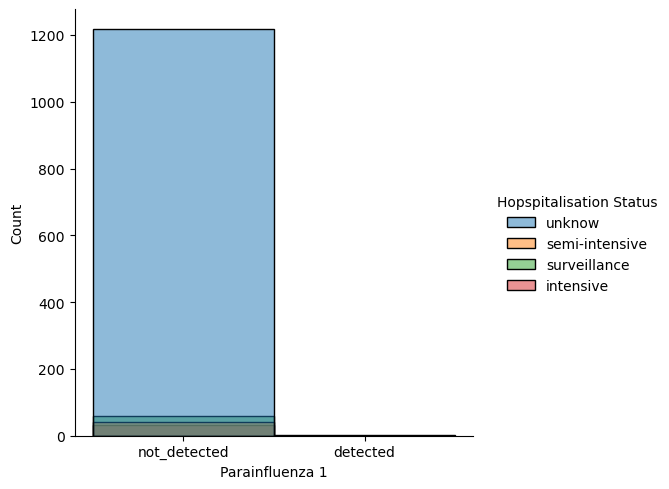

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

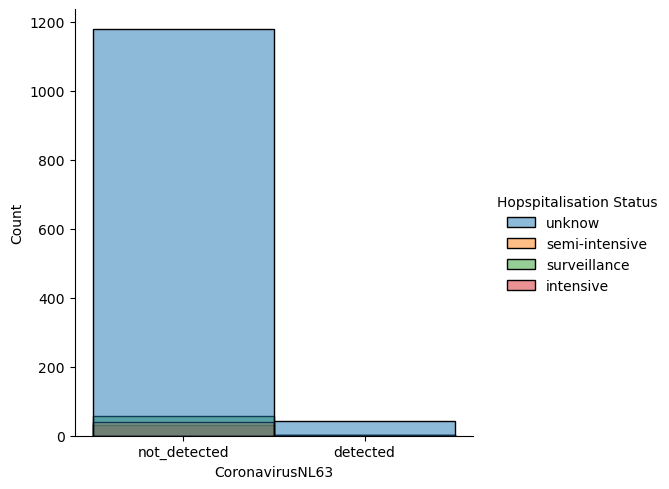

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

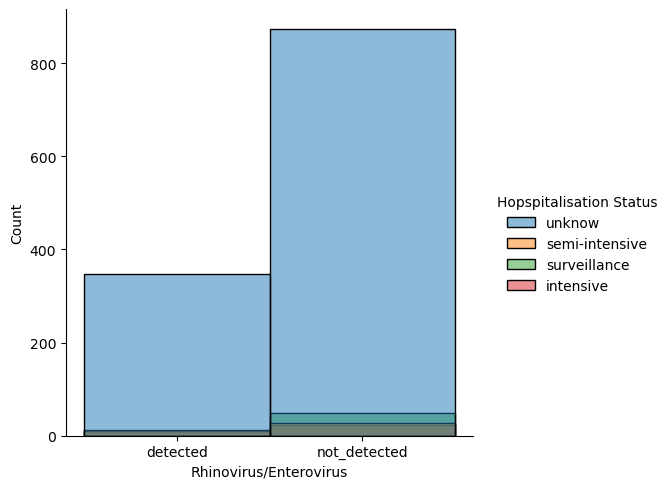

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

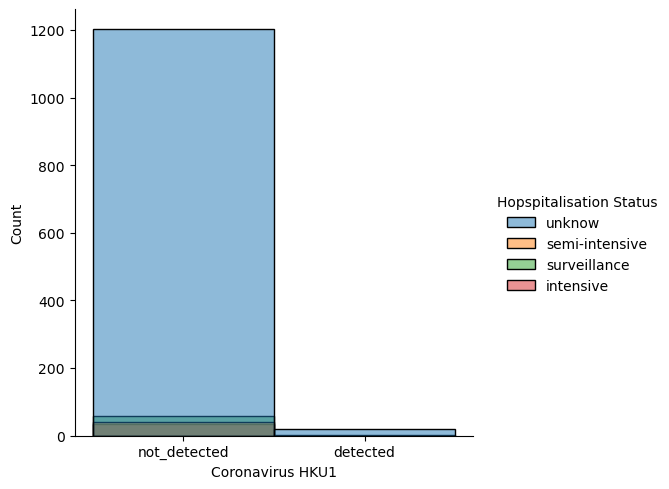

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

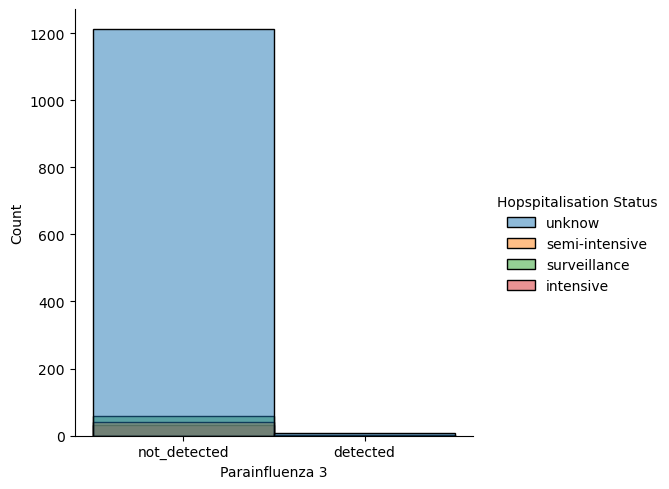

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

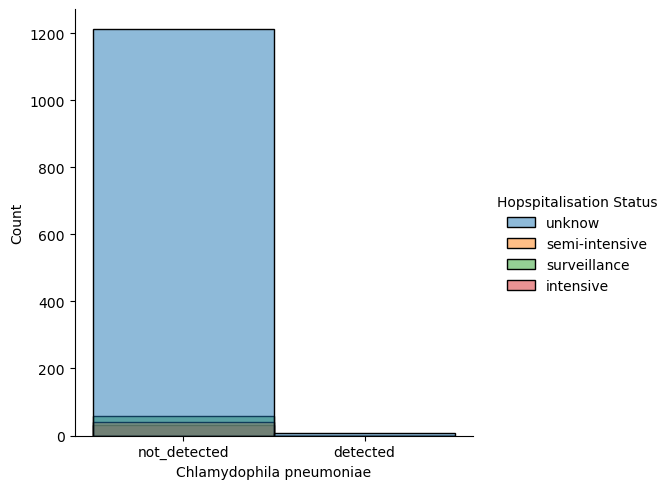

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

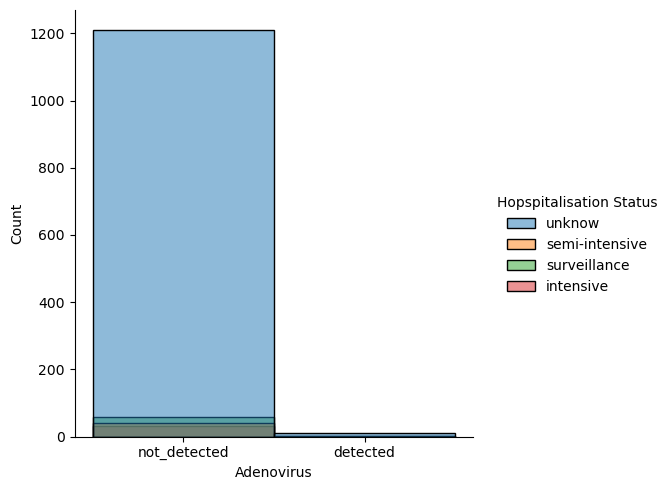

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

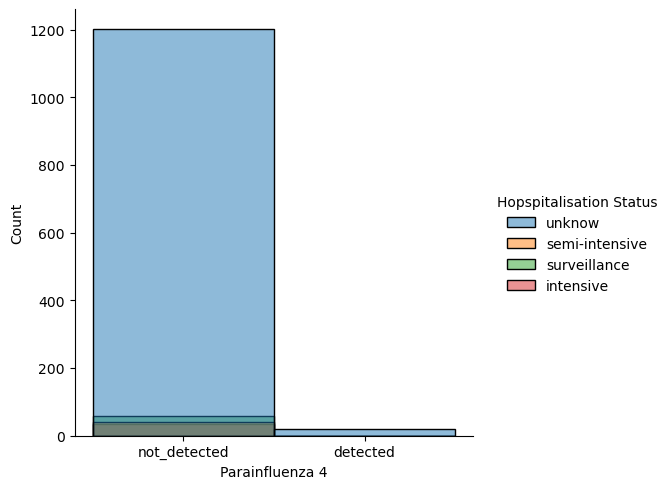

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

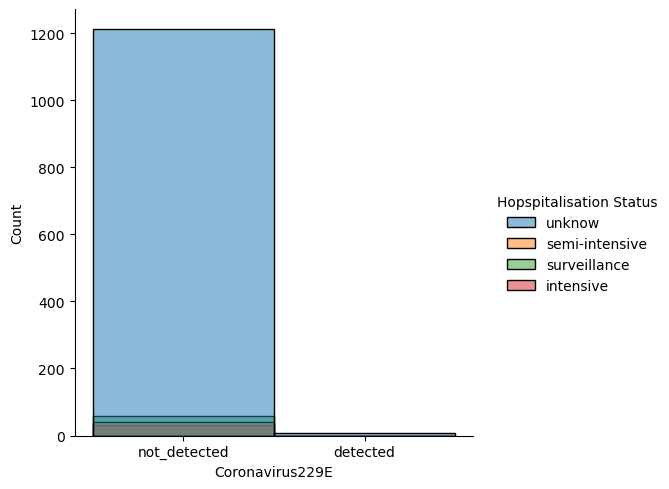

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

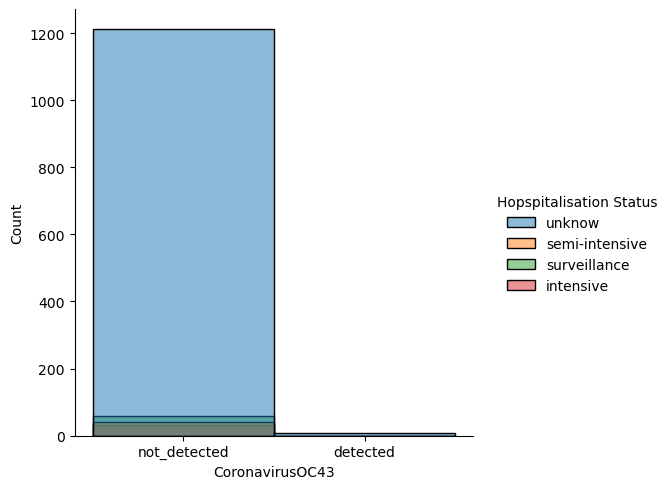

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

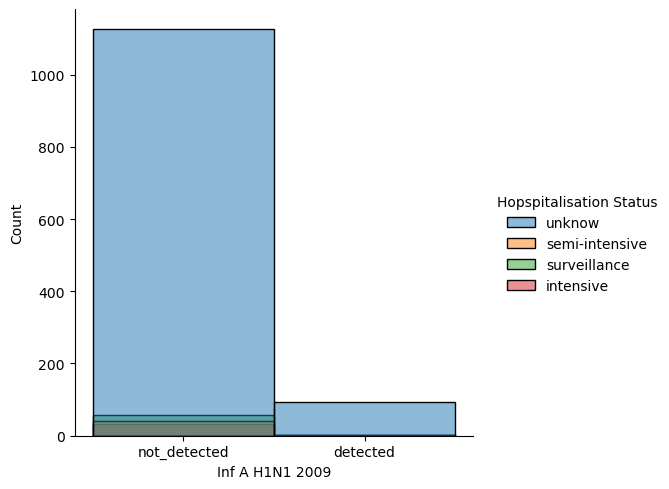

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

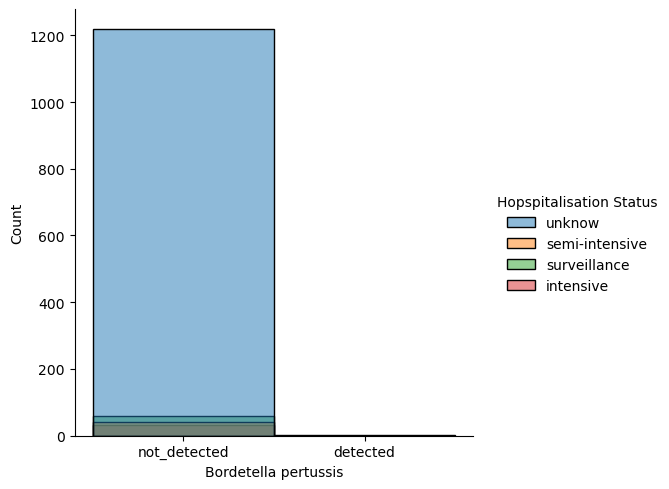

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

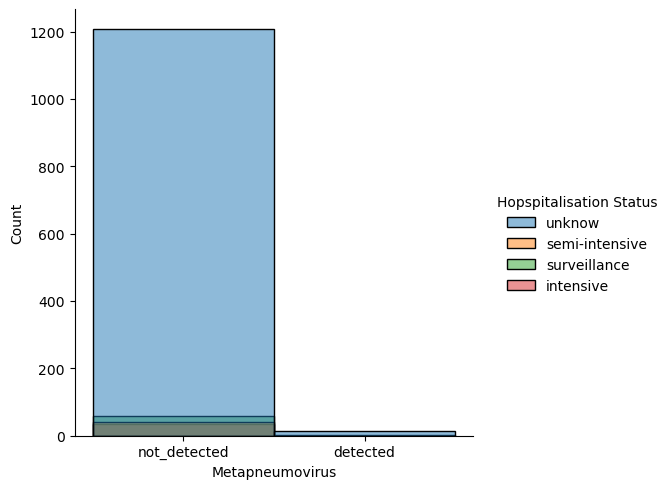

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

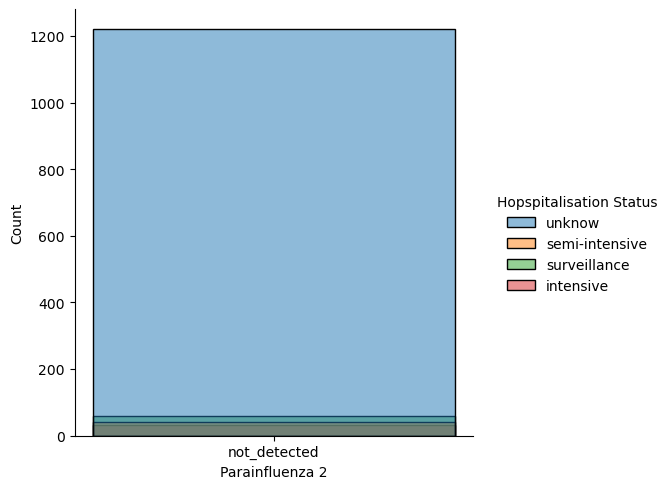

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

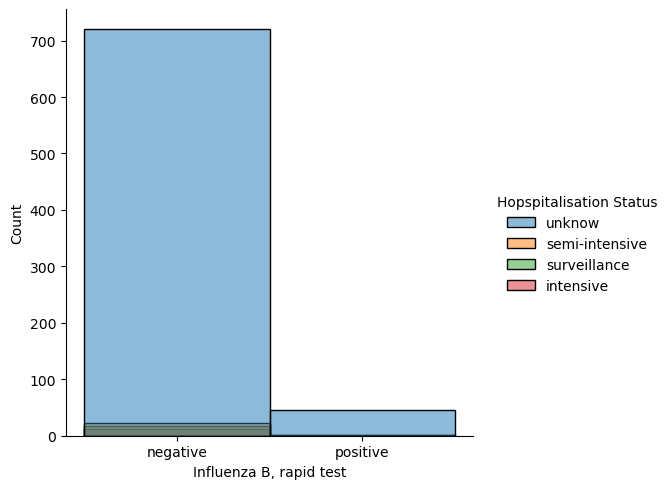

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

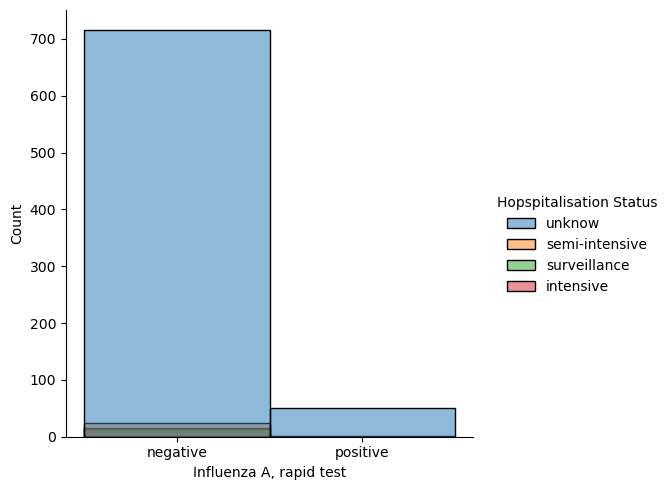

In [859]:
for col in viral_columns:
    plt.figure()
    sns.displot(data=select_features, x=col, hue="Hopspitalisation Status")
    plt.show()

##### Relationship Hospistalisation/blood

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

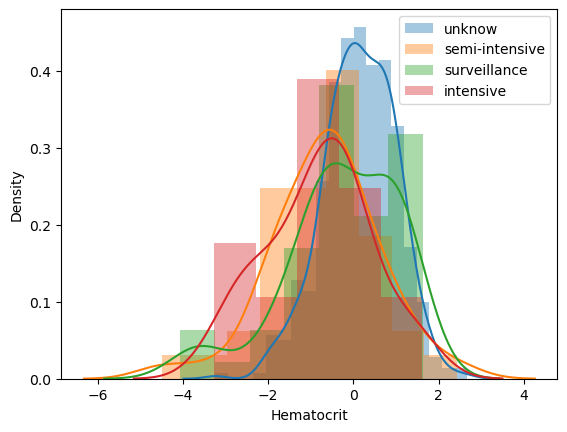

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

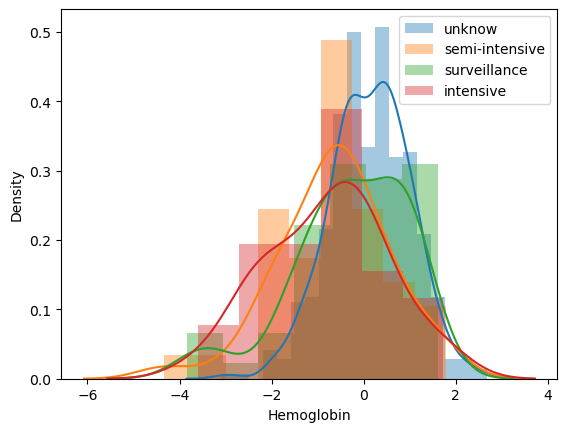

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

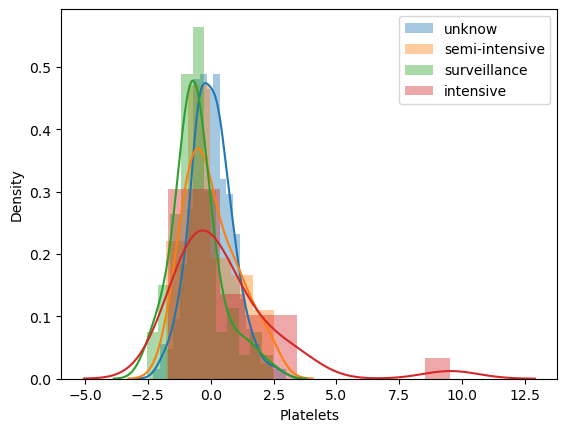

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

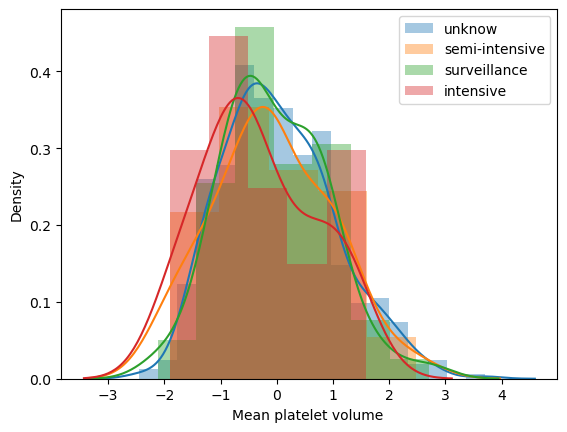

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

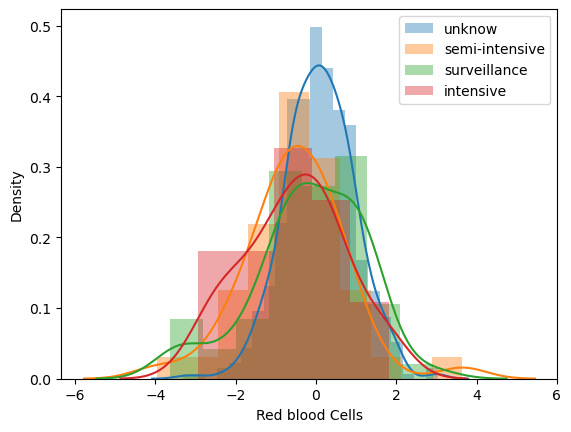

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

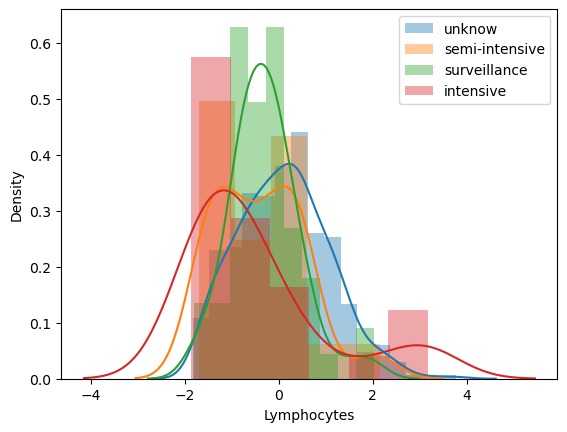

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

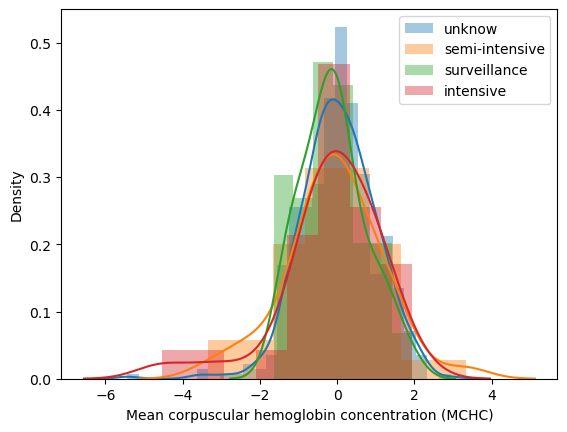

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

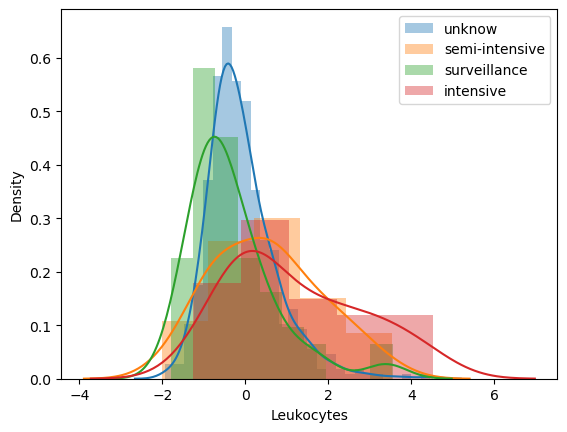

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

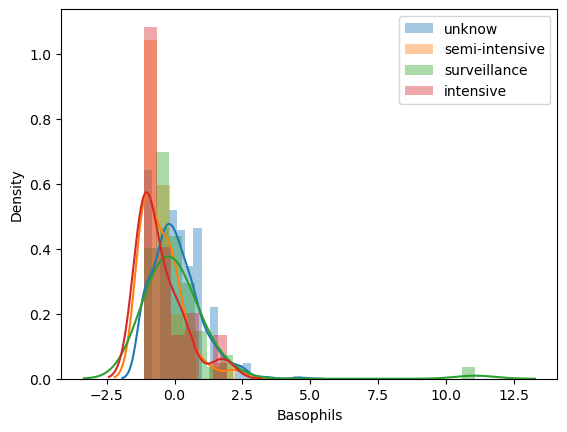

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

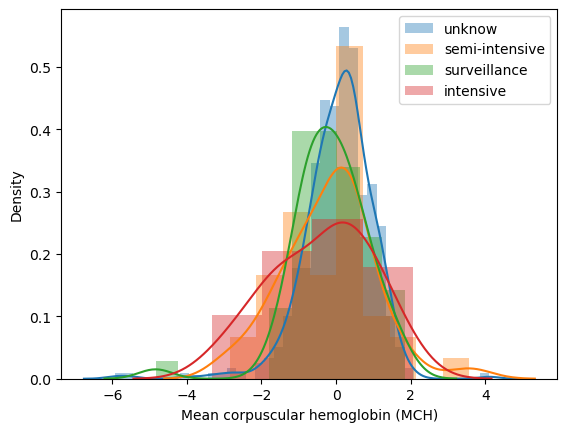

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

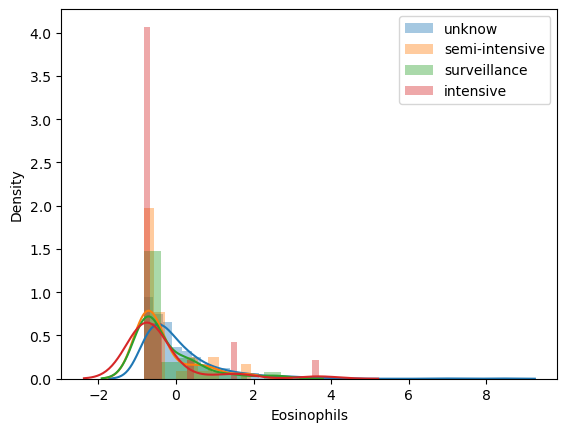

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

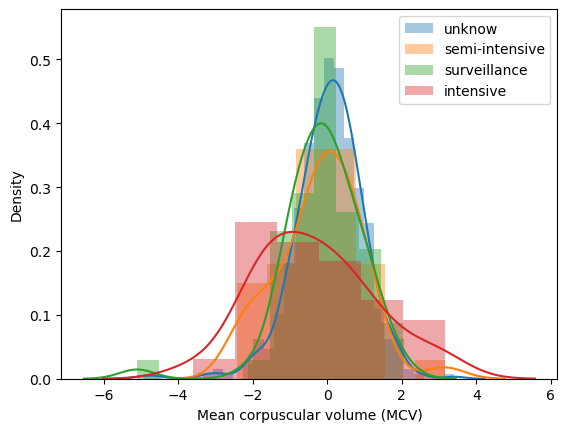

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

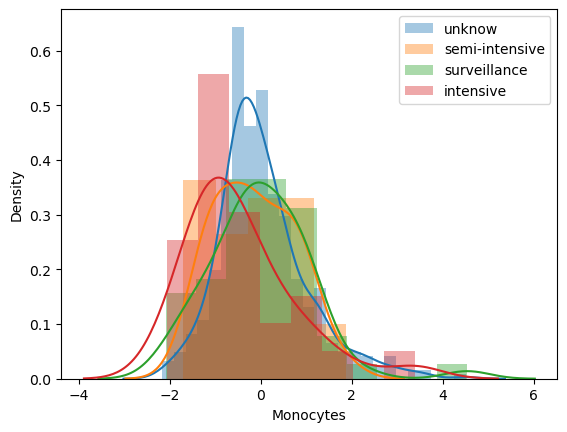

/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_26145/2375698173.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function wi

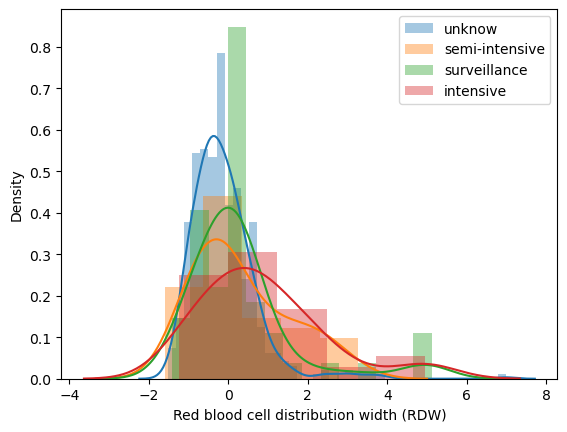

In [860]:
for col in blood_columns:
    plt.figure()
    for cat in select_features["Hopspitalisation Status"].unique():
        sns.distplot(select_features[select_features["Hopspitalisation Status"] == cat][col], label=cat)
        plt.legend()
    plt.show()

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

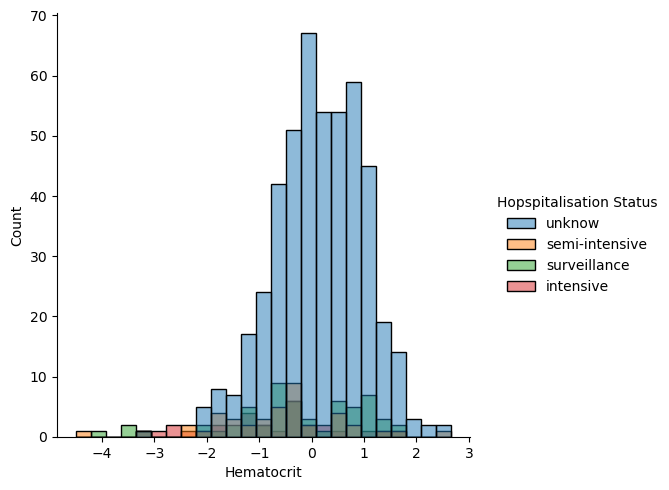

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

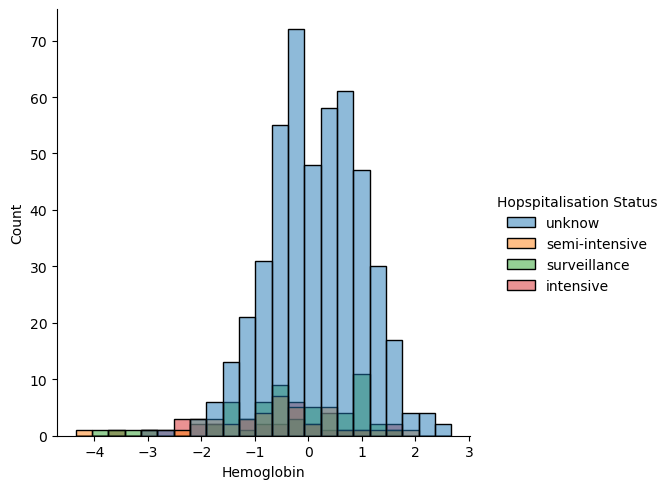

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

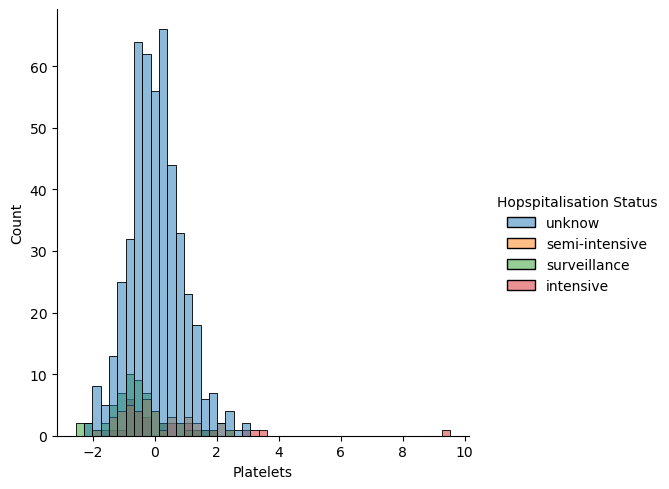

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

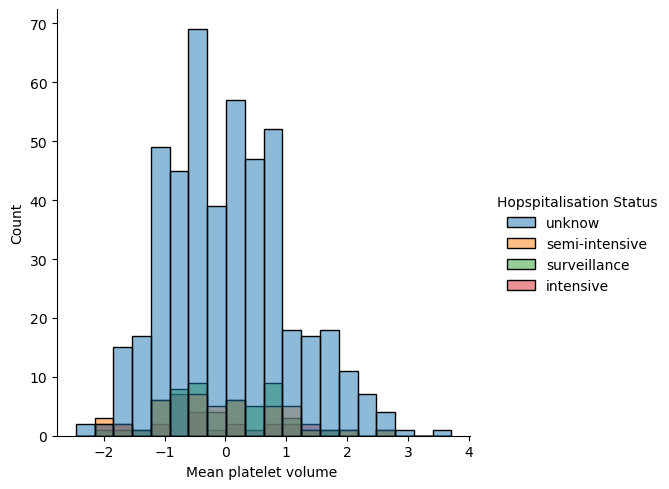

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

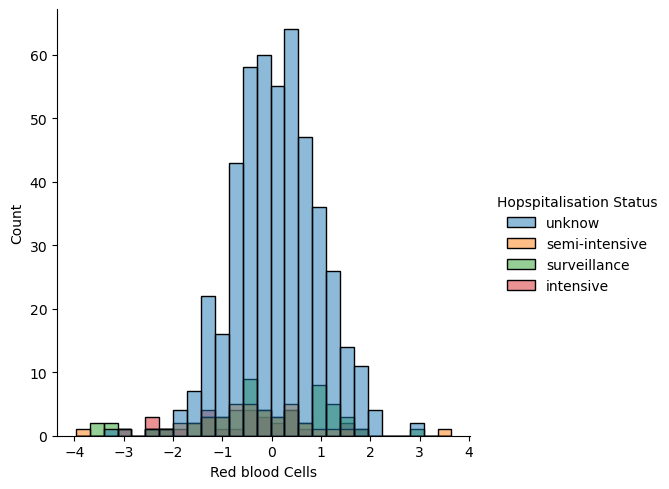

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

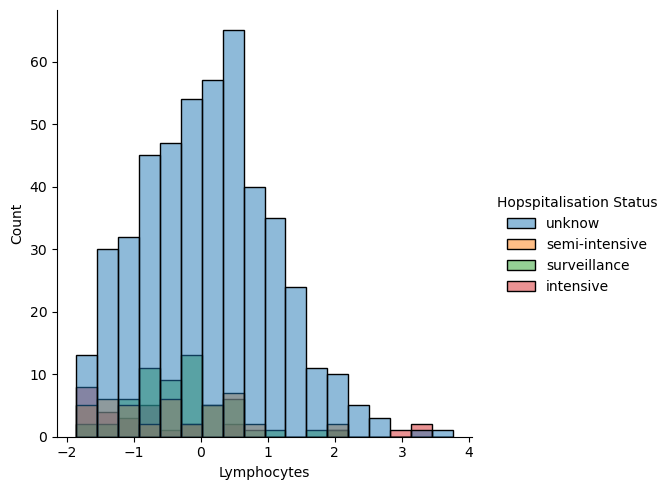

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

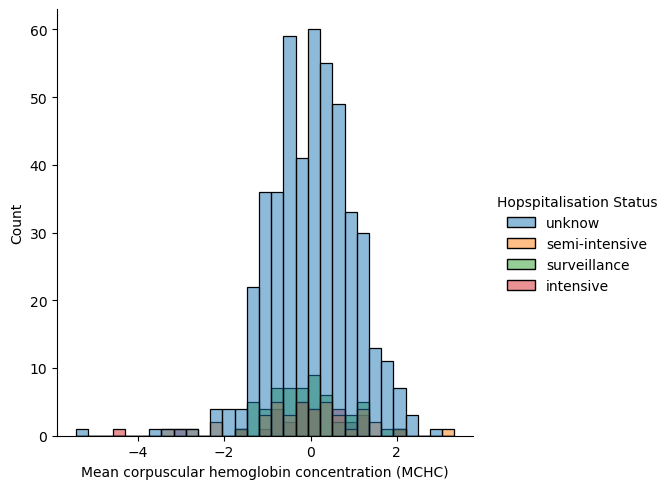

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

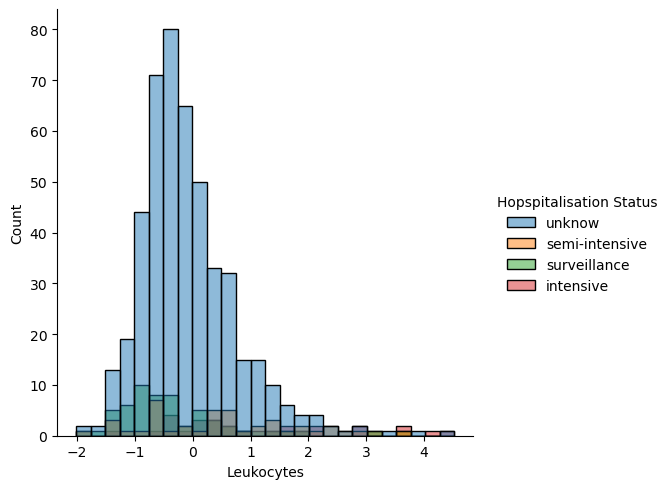

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

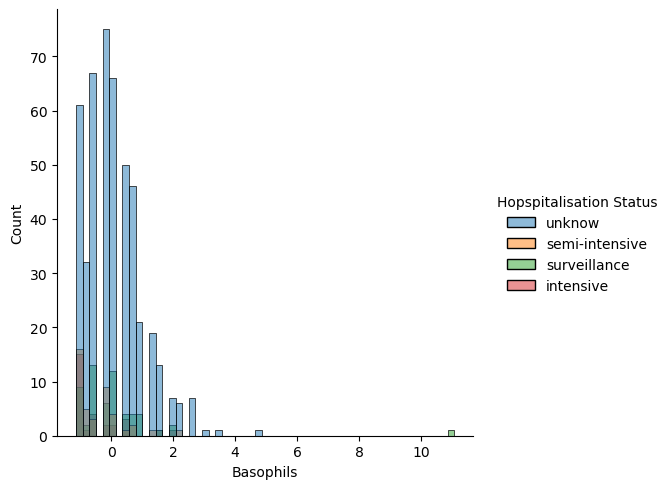

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

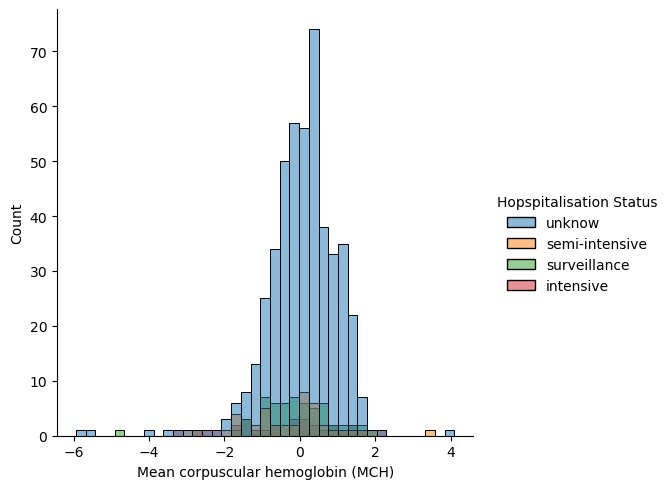

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

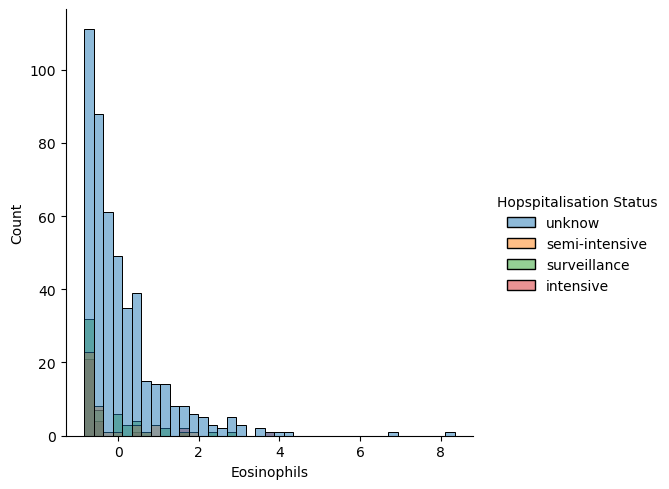

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

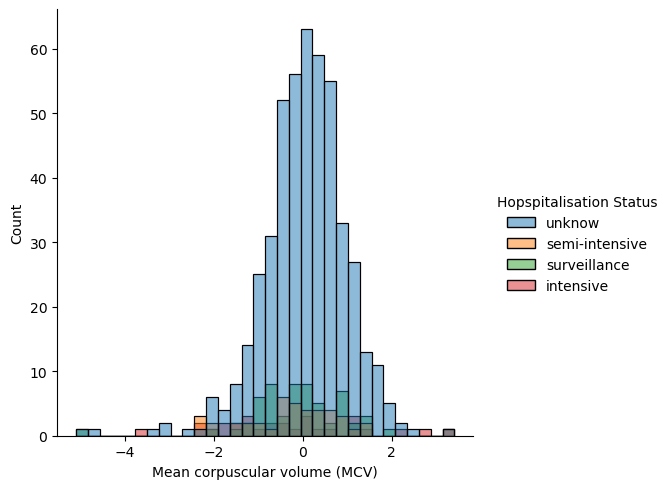

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

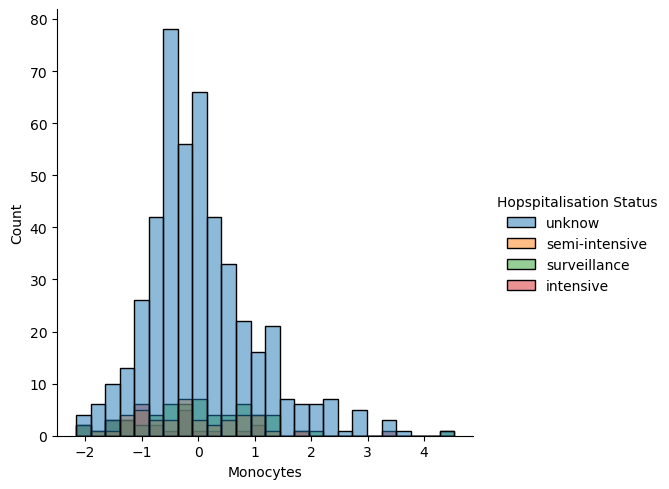

/home/akromic/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Figure size 640x480 with 0 Axes>

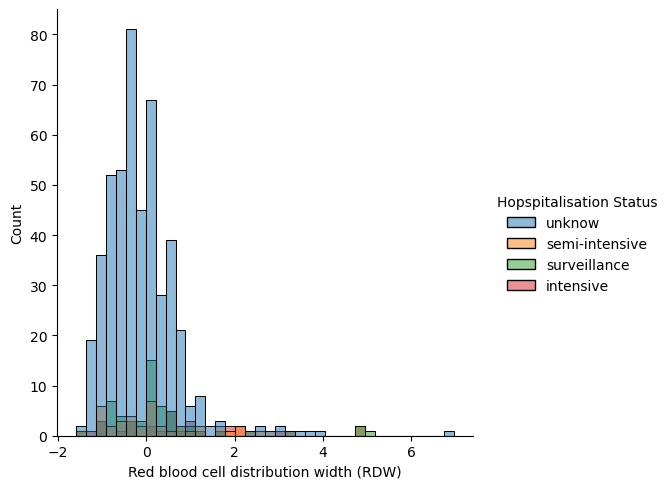

In [861]:
for col in blood_columns:
    plt.figure()
    sns.displot(data=select_features, x=col, hue="Hopspitalisation Status")
    plt.show()

#### NAN Analysis

In [862]:
# Dimension if only the blood value are keep
select_features[blood_columns].dropna().count()

Hematocrit                                 598
Hemoglobin                                 598
Platelets                                  598
Mean platelet volume                       598
Red blood Cells                            598
                                          ... 
Mean corpuscular hemoglobin (MCH)          598
Eosinophils                                598
Mean corpuscular volume (MCV)              598
Monocytes                                  598
Red blood cell distribution width (RDW)    598
Length: 14, dtype: int64

In [863]:
# Delete 'Parainfluenza 2', 'Influenza B, rapid test','Influenza A, rapid test' from the viral columns
viral_columns = viral_columns.delete([-3, -2, -1])
viral_columns

Index(['Respiratory Syncytial Virus', 'Influenza A', 'Influenza B',
       'Parainfluenza 1', 'CoronavirusNL63', 'Rhinovirus/Enterovirus',
       'Coronavirus HKU1', 'Parainfluenza 3', 'Chlamydophila pneumoniae',
       'Adenovirus', 'Parainfluenza 4', 'Coronavirus229E', 'CoronavirusOC43',
       'Inf A H1N1 2009', 'Bordetella pertussis', 'Metapneumovirus'],
      dtype='object')

In [864]:
# Dimension if only the viral load value are keep
select_features[viral_columns].dropna().count()

Respiratory Syncytial Virus    1352
Influenza A                    1352
Influenza B                    1352
Parainfluenza 1                1352
CoronavirusNL63                1352
                               ... 
Coronavirus229E                1352
CoronavirusOC43                1352
Inf A H1N1 2009                1352
Bordetella pertussis           1352
Metapneumovirus                1352
Length: 16, dtype: int64

In [865]:
select_features.dropna().count()

Patient age quantile                                     99
Patient addmited to regular ward (1=yes, 0=no)           99
Patient addmited to semi-intensive unit (1=yes, 0=no)    99
Patient addmited to intensive care unit (1=yes, 0=no)    99
Hematocrit                                               99
                                                         ..
Parainfluenza 2                                          99
Influenza B, rapid test                                  99
Influenza A, rapid test                                  99
sick                                                     99
Hopspitalisation Status                                  99
Length: 39, dtype: int64

In [866]:
# Check ration target value just with viral load
df_viral = select_features[viral_columns]
df_viral["target"] = df_covid["SARS-Cov-2 exam result"]
df_viral.dropna()["target"].value_counts(normalize=True)

/tmp/ipykernel_26145/1386011648.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_viral["target"] = df_covid["SARS-Cov-2 exam result"]


target
negative    0.91716
positive    0.08284
Name: proportion, dtype: float64

In [867]:
# Check ration target value just with blood
df_blood = select_features[blood_columns]
df_blood["target"] = df_covid["SARS-Cov-2 exam result"]
df_blood.dropna()["target"].value_counts(normalize=True)

/tmp/ipykernel_26145/3735429245.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_blood["target"] = df_covid["SARS-Cov-2 exam result"]


target
negative    0.864548
positive    0.135452
Name: proportion, dtype: float64

In [868]:
# Check ration target value without missing values
slt_feat_copy = select_features.copy()
slt_feat_copy["target"] = df_covid["SARS-Cov-2 exam result"]
slt_feat_copy["target"].dropna().value_counts(normalize= True)

target
negative    0.901134
positive    0.098866
Name: proportion, dtype: float64

### NUll Hypothesis H0

#### T-Test

In [869]:
from scipy.stats import ttest_ind

In [870]:
#The test must be done on balance class

print(df_pos.shape)
print(df_neg.shape)

(558, 37)
(5086, 37)


In [871]:
sample_neg = df_neg.sample(df_pos.shape[0])
sample_neg

,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,...,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
5082,11,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1097,2,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
1748,12,0,0,0,-0.129702,0.102972,-0.705840,-0.325903,-0.091930,-1.191275,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,negative,negative
3494,2,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4095,8,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1087,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
4423,18,0,0,0,-0.862136,-0.774212,-0.517413,-0.774677,-1.149751,-1.413030,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3853,5,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2414,15,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [872]:
sample_pos = df_pos.copy()
sample_pos

,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,...,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
67,7,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
284,16,1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
513,10,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
568,2,0,0,0,0.991838,0.792188,-0.341548,1.469188,1.653476,-0.048383,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN
676,15,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5632,16,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5633,4,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5634,15,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5639,3,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [873]:
def t_test(col: pd.Series):
    alpha = 0.05
    stat, p = ttest_ind(sample_neg[col].dropna(), sample_pos[col].dropna())
    
    if p < alpha :
        return "H0 rejected"
    else:
        return "H0 can not be rejected"
    

In [874]:
for col in blood_columns:
    print(f"{col:_<50}{t_test(col)}")

Hematocrit________________________________________H0 can not be rejected
Hemoglobin________________________________________H0 can not be rejected
Platelets_________________________________________H0 rejected
Mean platelet volume _____________________________H0 rejected
Red blood Cells___________________________________H0 rejected
Lymphocytes_______________________________________H0 can not be rejected
Mean corpuscular hemoglobin concentration (MCHC)__H0 can not be rejected
Leukocytes________________________________________H0 rejected
Basophils_________________________________________H0 can not be rejected
Mean corpuscular hemoglobin (MCH)_________________H0 can not be rejected
Eosinophils_______________________________________H0 rejected
Mean corpuscular volume (MCV)_____________________H0 can not be rejected
Monocytes_________________________________________H0 rejected
Red blood cell distribution width (RDW)___________H0 can not be rejected


# 2. Prepocessing
 - **Feature selection.**
    - Delete columns with less 10% of values.
    - Delete "Patient ID" because it bring any information on the patient disease but simply identify the patient.
    - Delete "Parainfluenza 2" because it does not varies.
    - Delete "The Influenza A/B quick test" beacause they are not reliable.
    - Delete "SARS-Cov-2 exam result" Because it has the target variable.
    - "Patient addmited to regular ward (1=yes, 0=no)", "Patient addmited to semi-intensive unit (1=yes, 0=no)", "Patient addmited to intensive care unit (1=yes, 0=no)" can fuse into only one column.

 - **Eliminate the NaN (dropna, fillna, imputation function, empty columns).**
   - Drop all the line from viral columns to pick 1352 line.
   - All the categorical missing will be fill with the "most_frequent" strategy.
   - All the numerical missing will be fill with the "mean" strategy.
 - **Features engineering (create new features to optimise the model - Ex: Polynomial feature).**
   - None doe yet.
 - **Create training and testing set.**
   - Divide the dataset into train set (80%) ans testing set (20%).
 - **Suppress the outliers, which has a negative impact on the model.**
 - **Encoding of the categorical variables.**
   - Create make column for categorical variable with OneHotEncoders.
 - **Freatures scalling.**
   - Create make column for numerical variable with StandardScaler.


In [875]:
#Selection of features 
X = df_covid.copy()
y = df_covid["SARS-Cov-2 exam result"]
X.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,...,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [876]:
#pd.set_option("display.max_row", df_covid.shape[0])
pd.set_option("display.max_row", df_covid.shape[1])
(X.isna().sum(axis=0)/X.shape[0]).sort_values(ascending= True)

Patient ID                                               0.000000
Patient age quantile                                     0.000000
SARS-Cov-2 exam result                                   0.000000
Patient addmited to regular ward (1=yes, 0=no)           0.000000
Patient addmited to semi-intensive unit (1=yes, 0=no)    0.000000
Patient addmited to intensive care unit (1=yes, 0=no)    0.000000
Influenza B                                              0.760099
Respiratory Syncytial Virus                              0.760099
Influenza A                                              0.760099
Rhinovirus/Enterovirus                                   0.760454
Inf A H1N1 2009                                          0.760454
CoronavirusOC43                                          0.760454
Coronavirus229E                                          0.760454
Parainfluenza 4                                          0.760454
Adenovirus                                               0.760454
Chlamydoph

In [877]:
# Calculate missing values rate
missing_rate = X.isna().sum(axis=0)/X.shape[0]
missing_rate = missing_rate[missing_rate < 0.90]
missing_rate

Patient ID                                               0.000000
Patient age quantile                                     0.000000
SARS-Cov-2 exam result                                   0.000000
Patient addmited to regular ward (1=yes, 0=no)           0.000000
Patient addmited to semi-intensive unit (1=yes, 0=no)    0.000000
Patient addmited to intensive care unit (1=yes, 0=no)    0.000000
Hematocrit                                               0.893161
Hemoglobin                                               0.893161
Platelets                                                0.893338
Mean platelet volume                                     0.893870
Red blood Cells                                          0.893338
Lymphocytes                                              0.893338
Mean corpuscular hemoglobin concentration (MCHC)         0.893338
Leukocytes                                               0.893338
Basophils                                                0.893338
Mean corpu

In [878]:
# Delete columns with less 10% of values.
print(X[missing_rate.index].columns)
X = X[missing_rate.index]
X.head()

Index(['Patient ID', 'Patient age quantile', 'SARS-Cov-2 exam result',
       'Patient addmited to regular ward (1=yes, 0=no)',
       'Patient addmited to semi-intensive unit (1=yes, 0=no)',
       'Patient addmited to intensive care unit (1=yes, 0=no)', 'Hematocrit',
       'Hemoglobin', 'Platelets', 'Mean platelet volume ', 'Red blood Cells',
       'Lymphocytes', 'Mean corpuscular hemoglobin concentration (MCHC)',
       'Leukocytes', 'Basophils', 'Mean corpuscular hemoglobin (MCH)',
       'Eosinophils', 'Mean corpuscular volume (MCV)', 'Monocytes',
       'Red blood cell distribution width (RDW)',
       'Respiratory Syncytial Virus', 'Influenza A', 'Influenza B',
       'Parainfluenza 1', 'CoronavirusNL63', 'Rhinovirus/Enterovirus',
       'Coronavirus HKU1', 'Parainfluenza 3', 'Chlamydophila pneumoniae',
       'Adenovirus', 'Parainfluenza 4', 'Coronavirus229E', 'CoronavirusOC43',
       'Inf A H1N1 2009', 'Bordetella pertussis', 'Metapneumovirus',
       'Parainfluenza 2', 'In

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,...,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test"
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,5,negative,0,0,0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,15,negative,0,0,0,NaN,NaN,NaN,NaN,...,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN


In [879]:
# Delete anothers columns, which are not needed for the model.
X.drop(['Patient ID', 
        'SARS-Cov-2 exam result',
        'Parainfluenza 2', 
        'Influenza B, rapid test', 
        'Influenza A, rapid test',], axis=1, inplace= True,)

In [880]:
#Features Engineering
#Fuse Hospitalisation status colummns into one colmun.
X["Status"] = X.apply(hospitalisation, axis=1)
X.drop(["Patient addmited to regular ward (1=yes, 0=no)",
        "Patient addmited to semi-intensive unit (1=yes, 0=no)",
        "Patient addmited to intensive care unit (1=yes, 0=no)",
       ], axis= 1, inplace= True)

In [881]:
X.shape

(5644, 32)

## SPLIT DATASET (TRAIN AND TESTING SET)

In [882]:
# Create training and testing set.
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state= 2)

In [883]:
#Check the output proportion in both set
print(f"TRAIN SET : {y_train.value_counts(normalize= True)}")
print()
print(f"TEST SET : {y_test.value_counts(normalize= True)}")

TRAIN SET : SARS-Cov-2 exam result
negative    0.904319
positive    0.095681
Name: proportion, dtype: float64

TEST SET : SARS-Cov-2 exam result
negative    0.888397
positive    0.111603
Name: proportion, dtype: float64


## ENCODING CATEGORICAL DATA

In [884]:
 encoders = {'not_detected': 0,
            'detected' : 1,
             "negative" : 0,
             "positive" : 1,
             "unknow": 0,
             "surveillance": 1,
             "semi-intensive": 2,
             "intensive": 3,
            }
def encoding(X, y):
    for col in X.select_dtypes("object"):
        X[col] = X[col].map(encoders, na_action= "ignore")
    return X, y.map(encoders, na_action= "ignore")

In [885]:
X_bis, y_bis = encoding(X, y)
X_bis.shape

(5644, 32)

In [886]:
y_bis.value_counts(normalize= True)

SARS-Cov-2 exam result
0    0.901134
1    0.098866
Name: proportion, dtype: float64

## CLEAN DATASET

In [887]:
def cleaning(X, y):
    X_clean = X.dropna(axis=0)
    y_clean = y[X_clean.index] 
    return X_clean, y_clean

## PREPROCESSING (ENCODING + CLEAN)

In [888]:
def preprocessing(X, y):
    X, y = encoding(X, y)
    X, y = cleaning(X, y)
    
    return X, y

In [889]:
X_train_clean, y_train_clean = preprocessing(X_train, y_train)

In [890]:
X_test_clean, y_test_clean = preprocessing(X_test, y_test)

In [891]:
y_train_clean.value_counts(normalize= True)

SARS-Cov-2 exam result
0    0.88
1    0.12
Name: proportion, dtype: float64

In [892]:
X_train_clean.shape

(275, 32)

## Modelisation

In [893]:
# Import classification algorithm 
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
# Bagging algorithm : RandomForest
# Boosting algorithm : AdaBosst
# Support vector machine algorithm are good for small/medium size dataset.

In [894]:
# Create the various model
decision_tree_model = DecisionTreeClassifier(random_state= 0)
random_forest_model = RandomForestClassifier(random_state= 0)


dict_model = {"Decision Tree": decision_tree_model, 
              "Random Forest": random_forest_model, 
             }

## Metrics

In [895]:
#Import model evaluation metrics 
from sklearn.metrics import f1_score, confusion_matrix, classification_report
from sklearn.model_selection import learning_curve

In [896]:
def evaluation(models):
    for name, model in models.items():
        
        model.fit(X_train_clean, y_train_clean)
        y_pred = model.predict(X_test_clean)

        print(model)
        print(confusion_matrix(y_test_clean, y_pred))
        print(classification_report(y_test_clean, y_pred))

        N, train_scores, val_scores = learning_curve(estimator= model,
                                                    X= X_train_clean,
                                                    y= y_train_clean,
                                                    train_sizes= np.linspace(0.1, 1, 10),
                                                    cv =5,
                                                    scoring="f1",
                                                     )
        plt.figure(figsize=(12,8))
        plt.title(name)
        plt.plot(N, train_scores.mean(axis=1), c="orange", label= "Training score")
        plt.plot(N, val_scores.mean(axis=1), c="blue", label= "Validation score")
        plt.legend()
        plt.show()        

DecisionTreeClassifier(random_state=0)
[[67  3]
 [ 8  9]]
              precision    recall  f1-score   support

           0       0.89      0.96      0.92        70
           1       0.75      0.53      0.62        17

    accuracy                           0.87        87
   macro avg       0.82      0.74      0.77        87
weighted avg       0.87      0.87      0.86        87



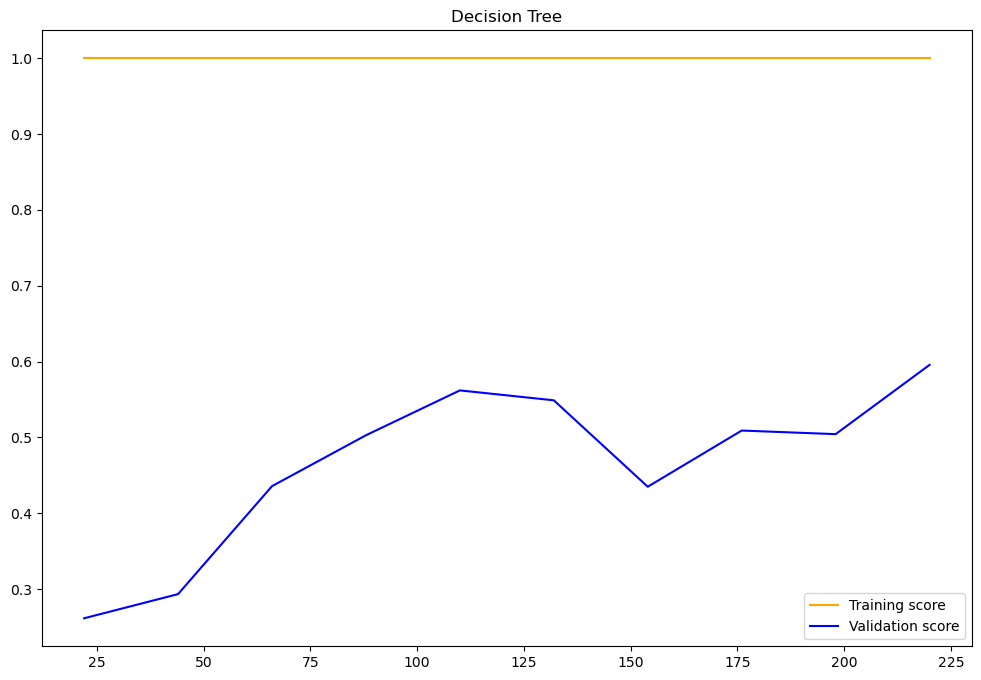

RandomForestClassifier(random_state=0)
[[70  0]
 [14  3]]
              precision    recall  f1-score   support

           0       0.83      1.00      0.91        70
           1       1.00      0.18      0.30        17

    accuracy                           0.84        87
   macro avg       0.92      0.59      0.60        87
weighted avg       0.87      0.84      0.79        87



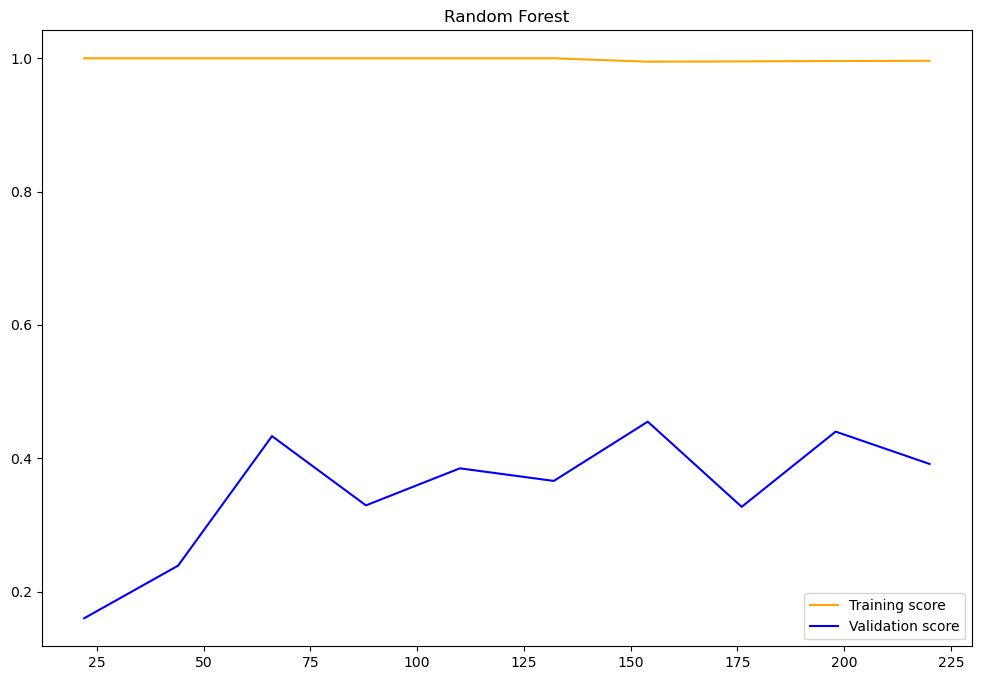

In [897]:
evaluation(dict_model)

In [898]:
df_corr_tree =pd.DataFrame(decision_tree_model.feature_importances_, index=X_train_clean.columns)
df_corr_tree

,0
Patient age quantile,0.000000
Hematocrit,0.000000
Hemoglobin,0.035318
Platelets,0.000000
Mean platelet volume,0.000000
Red blood Cells,0.120825
Lymphocytes,0.000000
Mean corpuscular hemoglobin concentration (MCHC),0.013685
Leukocytes,0.321965
Basophils,0.045914


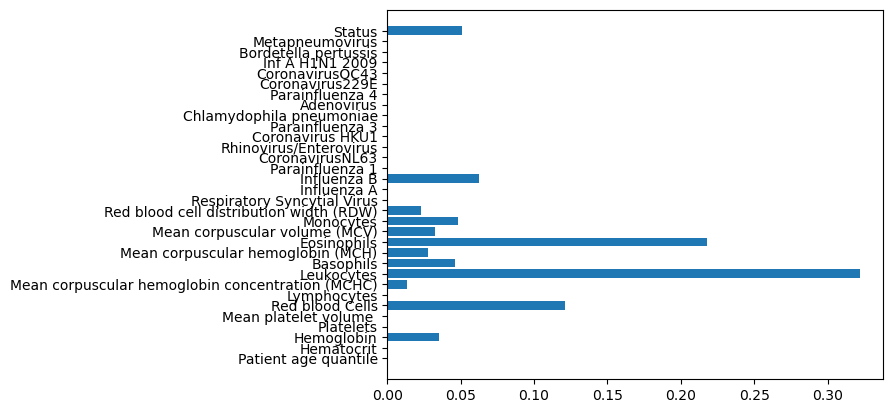

In [899]:
plt.figure()
plt.barh(df_corr_tree.index, df_corr_tree[0])
plt.show()

In [900]:
df_corr_forest =pd.DataFrame(random_forest_model.feature_importances_, index=X_train_clean.columns)
df_corr_forest

,0
Patient age quantile,3.746292e-02
Hematocrit,5.845816e-02
Hemoglobin,7.069641e-02
Platelets,6.964279e-02
Mean platelet volume,3.896689e-02
Red blood Cells,7.400763e-02
Lymphocytes,4.580205e-02
Mean corpuscular hemoglobin concentration (MCHC),3.041694e-02
Leukocytes,1.772493e-01
Basophils,2.340934e-02


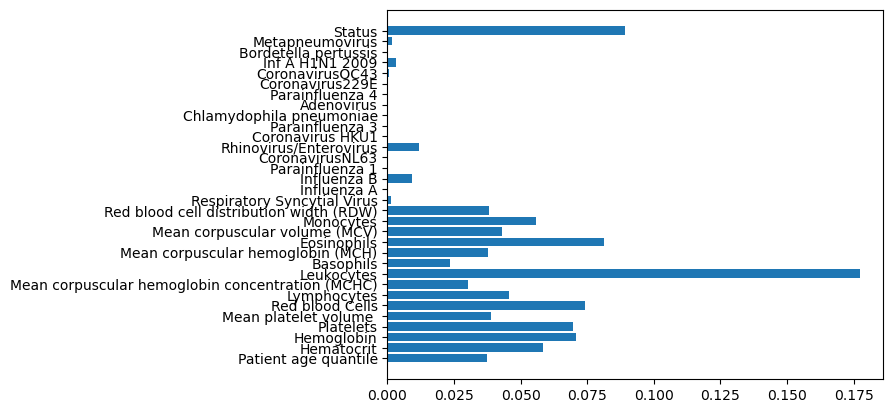

In [901]:
plt.figure()
plt.barh(df_corr_forest.index, df_corr_forest[0])
plt.show()

## Features Selection

In [902]:
from sklearn.feature_selection import f_classif, chi2 , SelectKBest
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler

In [903]:
degrees = 2
n_features = 10
preprocessor = make_pipeline(PolynomialFeatures(degree= degrees, include_bias= False), 
                             SelectKBest(score_func=f_classif, k= n_features), 
                      )
random_forest_pipeline = make_pipeline(preprocessor, 
                                       RandomForestClassifier(random_state= 0))
ada_boost_pipeline = make_pipeline(preprocessor, 
                                   AdaBoostClassifier(random_state= 0))
svm_pipeline = make_pipeline(preprocessor, 
                             StandardScaler(), 
                             SVC(random_state= 0))
k_neighbors_pipeline = make_pipeline(preprocessor, 
                                     StandardScaler(), 
                                     KNeighborsClassifier())

dict_model_pipeline = {"Random Forest": random_forest_pipeline, 
                       "Ada Boost": ada_boost_pipeline,
                       "SVM": svm_pipeline,
                       "K_NEIGHBORS": k_neighbors_pipeline,
                      }

/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [ 18  23  29  50  55  56  57  61  81  86  92 111 116 122 140 145 151 168
 173 179 195 200 206 221 226 232 246 251 257 270 275 281 293 298 304 315
 320 326 336 341 347 356 361 367 375 380 386 393 398 404 408 409 410 411
 413 414 415 417 418 419 420 421 422 425 426 427 428 429 430 431 432 434
 435 437 438 439 441 442 444 445 446 447 448 449 450 452 455 456 457 458
 459 460 461 462 463 464 465 466 467 468 470 471 473 474 475 476 477 478
 479 480 483 484 485 487 488 490 491 492 495 496 497 498 499 500 502 503
 504 506 507 508 509 510 511 512 513 515 516 517 518 519 520 521 522 523
 525 526 527 528 529 530 531 533 534 535 536 537 538 540 541 542 543 544
 546 547 548 549 551 552 554 555 556] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)


Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('polynomialfeatures',
                                  PolynomialFeatures(include_bias=False)),
                                 ('selectkbest', SelectKBest())])),
                ('randomforestclassifier',
                 RandomForestClassifier(random_state=0))])
[[70  0]
 [11  6]]
              precision    recall  f1-score   support

           0       0.86      1.00      0.93        70
           1       1.00      0.35      0.52        17

    accuracy                           0.87        87
   macro avg       0.93      0.68      0.72        87
weighted avg       0.89      0.87      0.85        87



/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [ 15  16  18  19  21  22  23  24  25  27  29  47  48  50  51  53  54  55
  56  57  59  61  62  78  79  81  82  84  85  86  87  88  90  92 108 109
 111 112 114 115 116 117 118 120 122 137 138 140 141 143 144 145 146 147
 149 151 165 166 168 169 171 172 173 174 175 177 179 192 193 195 196 198
 199 200 201 202 204 206 218 219 221 222 224 225 226 227 228 230 232 243
 244 246 247 249 250 251 252 253 255 257 267 268 270 271 273 274 275 276
 277 279 281 290 291 293 294 296 297 298 299 300 302 304 312 313 315 316
 318 319 320 321 322 324 326 333 334 336 337 339 340 341 342 343 345 347
 353 354 356 357 359 360 361 362 363 365 367 372 373 375 376 378 379 380
 381 382 384 386 390 391 393 394 396 397 398 399 400 402 404 407 408 409
 410 411 412 413 414 415 416 417 418 419 420 421 422 423 424 425 426 427
 428 429 430 431 432 433 434 435 436 437 438 439 441 442 443 444 4

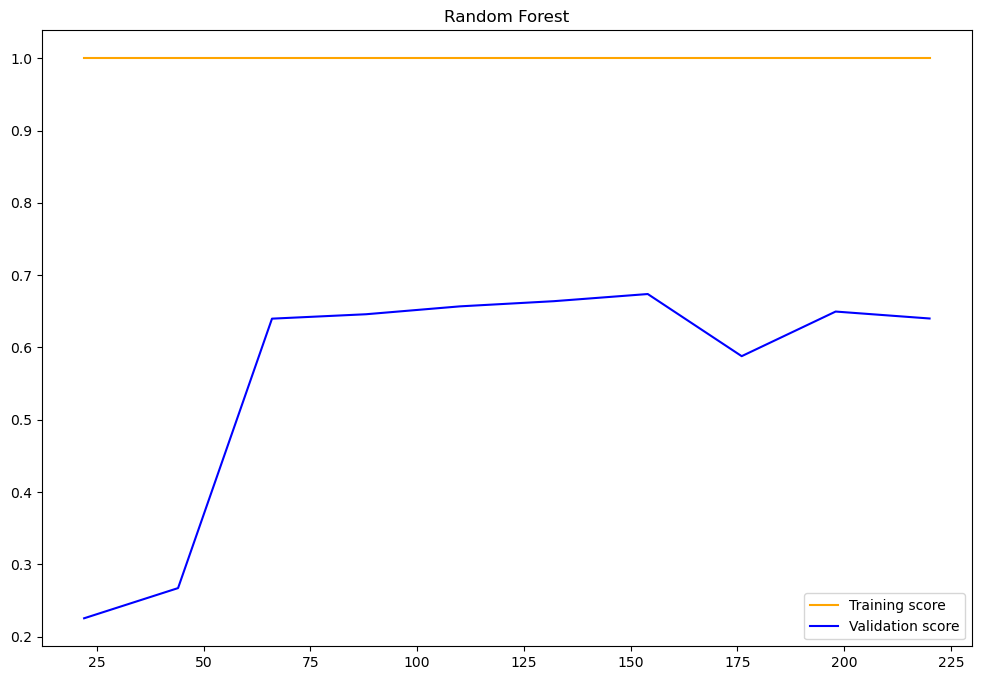

/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [ 18  23  29  50  55  56  57  61  81  86  92 111 116 122 140 145 151 168
 173 179 195 200 206 221 226 232 246 251 257 270 275 281 293 298 304 315
 320 326 336 341 347 356 361 367 375 380 386 393 398 404 408 409 410 411
 413 414 415 417 418 419 420 421 422 425 426 427 428 429 430 431 432 434
 435 437 438 439 441 442 444 445 446 447 448 449 450 452 455 456 457 458
 459 460 461 462 463 464 465 466 467 468 470 471 473 474 475 476 477 478
 479 480 483 484 485 487 488 490 491 492 495 496 497 498 499 500 502 503
 504 506 507 508 509 510 511 512 513 515 516 517 518 519 520 521 522 523
 525 526 527 528 529 530 531 533 534 535 536 537 538 540 541 542 543 544
 546 547 548 549 551 552 554 555 556] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('polynomialfeatures',
                                  PolynomialFeatures(include_bias=False)),
                                 ('selectkbest', SelectKBest())])),
                ('adaboostclassifier', AdaBoostClassifier(random_state=0))])
[[68  2]
 [ 9  8]]
              precision    recall  f1-score   support

           0       0.88      0.97      0.93        70
           1       0.80      0.47      0.59        17

    accuracy                           0.87        87
   macro avg       0.84      0.72      0.76        87
weighted avg       0.87      0.87      0.86        87



/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [ 16  18  21  23  24  25  27  29  47  48  50  53  55  56  57  59  61  62
  79  81  84  86  87  88  90  92 109 111 114 116 117 118 120 122 138 140
 143 145 146 147 149 151 166 168 171 173 174 175 177 179 193 195 198 200
 201 202 204 206 219 221 224 226 227 228 230 232 244 246 249 251 252 253
 255 257 268 270 273 275 276 277 279 281 291 293 296 298 299 300 302 304
 313 315 318 320 321 322 324 326 334 336 339 341 342 343 345 347 354 356
 359 361 362 363 365 367 373 375 378 380 381 382 384 386 391 393 396 398
 399 400 402 404 408 409 410 411 412 413 414 415 416 417 418 419 420 421
 422 424 425 426 427 428 429 430 431 432 433 434 435 436 437 438 439 441
 442 443 444 445 446 447 448 449 450 451 452 454 455 456 457 458 459 460
 461 462 463 464 465 466 467 468 470 471 472 473 474 475 476 477 478 479
 480 481 483 484 485 486 487 488 489 490 491 492 494 495 496 497 4

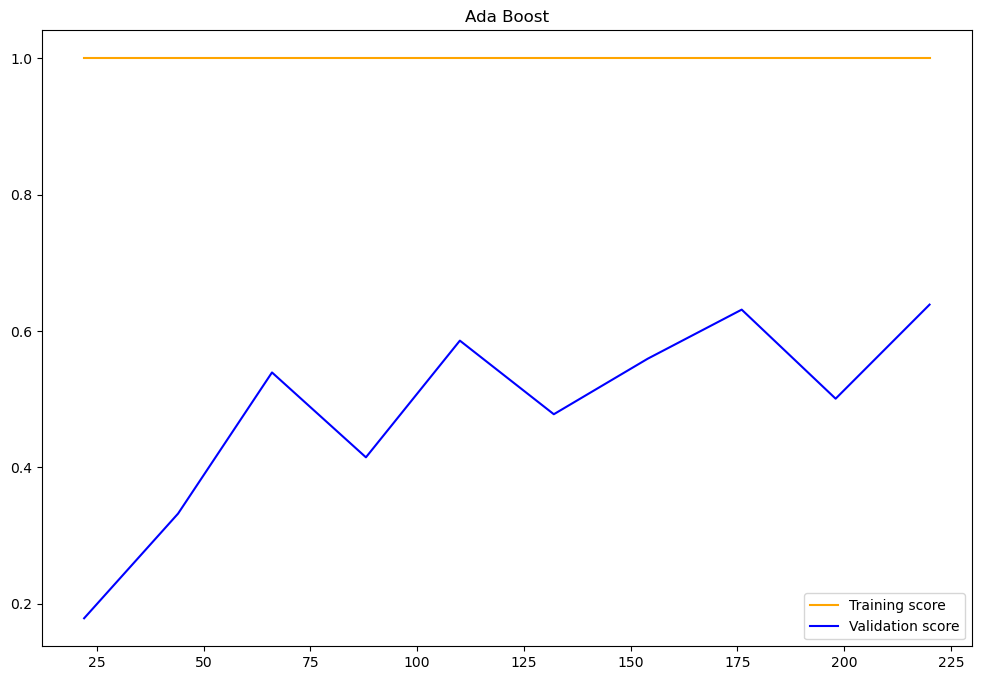

/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [ 18  23  29  50  55  56  57  61  81  86  92 111 116 122 140 145 151 168
 173 179 195 200 206 221 226 232 246 251 257 270 275 281 293 298 304 315
 320 326 336 341 347 356 361 367 375 380 386 393 398 404 408 409 410 411
 413 414 415 417 418 419 420 421 422 425 426 427 428 429 430 431 432 434
 435 437 438 439 441 442 444 445 446 447 448 449 450 452 455 456 457 458
 459 460 461 462 463 464 465 466 467 468 470 471 473 474 475 476 477 478
 479 480 483 484 485 487 488 490 491 492 495 496 497 498 499 500 502 503
 504 506 507 508 509 510 511 512 513 515 516 517 518 519 520 521 522 523
 525 526 527 528 529 530 531 533 534 535 536 537 538 540 541 542 543 544
 546 547 548 549 551 552 554 555 556] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('polynomialfeatures',
                                  PolynomialFeatures(include_bias=False)),
                                 ('selectkbest', SelectKBest())])),
                ('standardscaler', StandardScaler()),
                ('svc', SVC(random_state=0))])
[[70  0]
 [12  5]]
              precision    recall  f1-score   support

           0       0.85      1.00      0.92        70
           1       1.00      0.29      0.45        17

    accuracy                           0.86        87
   macro avg       0.93      0.65      0.69        87
weighted avg       0.88      0.86      0.83        87



/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [ 18  23  24  27  29  47  48  50  55  56  57  59  61  81  86  87  90  92
 111 116 117 120 122 140 145 146 149 151 168 173 174 177 179 195 200 201
 204 206 221 226 227 230 232 246 251 252 255 257 270 275 276 279 281 293
 298 299 302 304 315 320 321 324 326 336 341 342 345 347 356 361 362 365
 367 375 380 381 384 386 393 398 399 402 404 408 409 410 411 412 413 414
 415 416 417 418 419 420 421 422 425 426 427 428 429 430 431 432 434 435
 436 437 438 439 441 442 444 445 446 447 448 449 450 451 452 455 456 457
 458 459 460 461 462 463 464 465 466 467 468 470 471 473 474 475 476 477
 478 479 480 483 484 485 486 487 488 489 490 491 492 495 496 497 498 499
 500 501 502 503 504 506 507 508 509 510 511 512 513 515 516 517 518 519
 520 521 522 523 524 525 526 527 528 529 530 531 533 534 535 536 537 538
 540 541 542 543 544 545 546 547 548 549 551 552 554 555 556 558] 

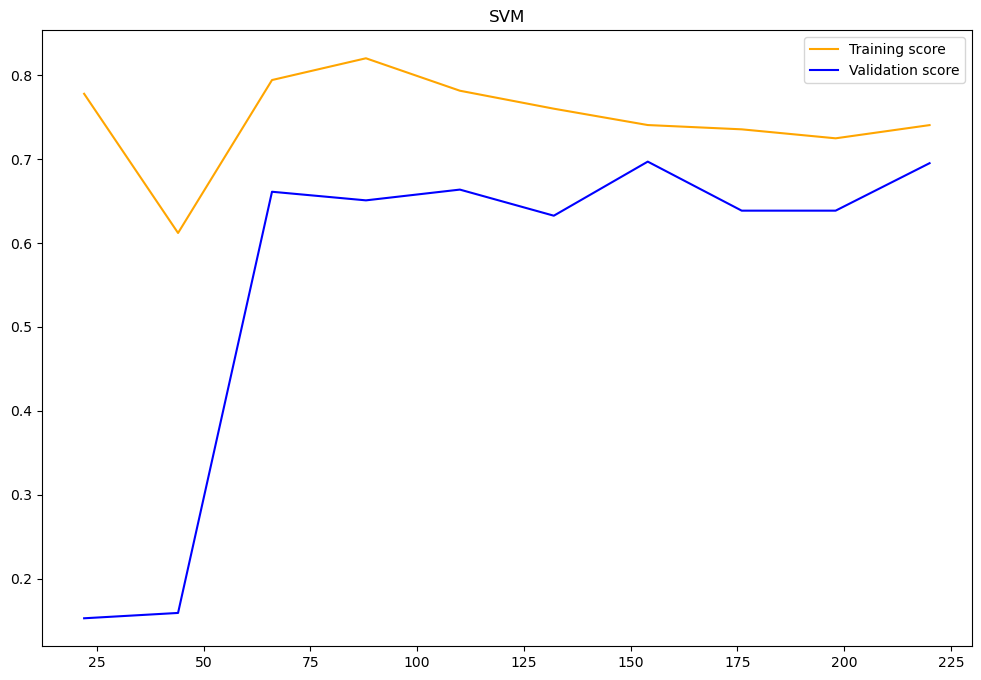

/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [ 18  23  29  50  55  56  57  61  81  86  92 111 116 122 140 145 151 168
 173 179 195 200 206 221 226 232 246 251 257 270 275 281 293 298 304 315
 320 326 336 341 347 356 361 367 375 380 386 393 398 404 408 409 410 411
 413 414 415 417 418 419 420 421 422 425 426 427 428 429 430 431 432 434
 435 437 438 439 441 442 444 445 446 447 448 449 450 452 455 456 457 458
 459 460 461 462 463 464 465 466 467 468 470 471 473 474 475 476 477 478
 479 480 483 484 485 487 488 490 491 492 495 496 497 498 499 500 502 503
 504 506 507 508 509 510 511 512 513 515 516 517 518 519 520 521 522 523
 525 526 527 528 529 530 531 533 534 535 536 537 538 540 541 542 543 544
 546 547 548 549 551 552 554 555 556] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('polynomialfeatures',
                                  PolynomialFeatures(include_bias=False)),
                                 ('selectkbest', SelectKBest())])),
                ('standardscaler', StandardScaler()),
                ('kneighborsclassifier', KNeighborsClassifier())])
[[69  1]
 [ 9  8]]
              precision    recall  f1-score   support

           0       0.88      0.99      0.93        70
           1       0.89      0.47      0.62        17

    accuracy                           0.89        87
   macro avg       0.89      0.73      0.77        87
weighted avg       0.89      0.89      0.87        87



/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [ 18  23  24  27  29  47  48  50  55  56  57  59  61  81  86  87  90  92
 111 116 117 120 122 140 145 146 149 151 168 173 174 177 179 195 200 201
 204 206 221 226 227 230 232 246 251 252 255 257 270 275 276 279 281 293
 298 299 302 304 315 320 321 324 326 336 341 342 345 347 356 361 362 365
 367 375 380 381 384 386 393 398 399 402 404 408 409 410 411 412 413 414
 415 416 417 418 419 420 421 422 425 426 427 428 429 430 431 432 434 435
 436 437 438 439 441 442 444 445 446 447 448 449 450 451 452 455 456 457
 458 459 460 461 462 463 464 465 466 467 468 470 471 473 474 475 476 477
 478 479 480 483 484 485 486 487 488 489 490 491 492 495 496 497 498 499
 500 501 502 503 504 506 507 508 509 510 511 512 513 515 516 517 518 519
 520 521 522 523 524 525 526 527 528 529 530 531 533 534 535 536 537 538
 540 541 542 543 544 545 546 547 548 549 551 552 554 555 556 558] 

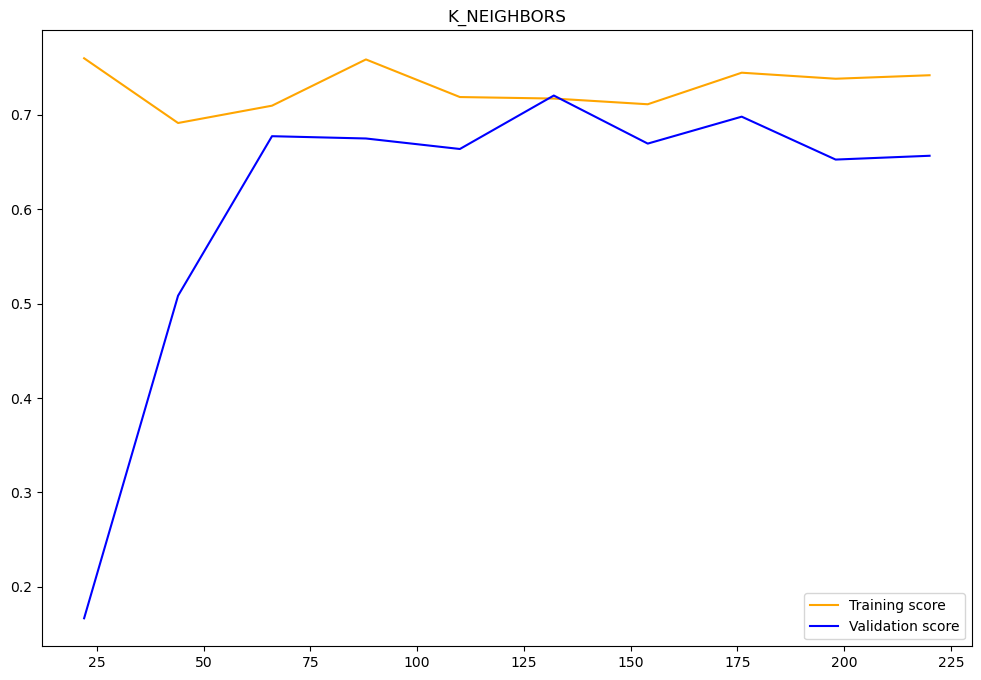

In [904]:
evaluation(dict_model_pipeline)

## Model Optimization

In [905]:
#Import GridSearchCV to optimize the model hyperparamters
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [906]:
ada_boost_pipeline.get_params

<bound method Pipeline.get_params of Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('polynomialfeatures',
                                  PolynomialFeatures(include_bias=False)),
                                 ('selectkbest', SelectKBest())])),
                ('adaboostclassifier', AdaBoostClassifier(random_state=0))])>

In [907]:
#AdaBoost Optimization 
hyper_params_ada = {"pipeline__polynomialfeatures__degree": [1, 2, 3],
                "pipeline__selectkbest__score_func": [f_classif, chi2],
                "pipeline__selectkbest__k": np.arange(5, 35, 1), 
                "adaboostclassifier__random_state": np.arange(0, 5, 1),
               }
grid_ada = GridSearchCV(ada_boost_pipeline, 
                    param_grid= hyper_params_ada, 
                    scoring="recall", 
                    cv=5)
grid_ada.fit(X_train_clean, y_train_clean)
grid_ada.best_params_

/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 24 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 25 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/sit

{'adaboostclassifier__random_state': 0,
 'pipeline__polynomialfeatures__degree': 1,
 'pipeline__selectkbest__k': 28,
 'pipeline__selectkbest__score_func': <function sklearn.feature_selection._univariate_selection.f_classif(X, y)>}

/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [15 16 18 19 21 22 23 24 25 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)


Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('polynomialfeatures',
                                  PolynomialFeatures(degree=1,
                                                     include_bias=False)),
                                 ('selectkbest', SelectKBest(k=28))])),
                ('adaboostclassifier', AdaBoostClassifier(random_state=0))])
[[68  2]
 [10  7]]
              precision    recall  f1-score   support

           0       0.87      0.97      0.92        70
           1       0.78      0.41      0.54        17

    accuracy                           0.86        87
   macro avg       0.82      0.69      0.73        87
weighted avg       0.85      0.86      0.84        87



/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [16 18 21 23 24 25 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [16 18 21 23 24 25 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 24 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 24 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/

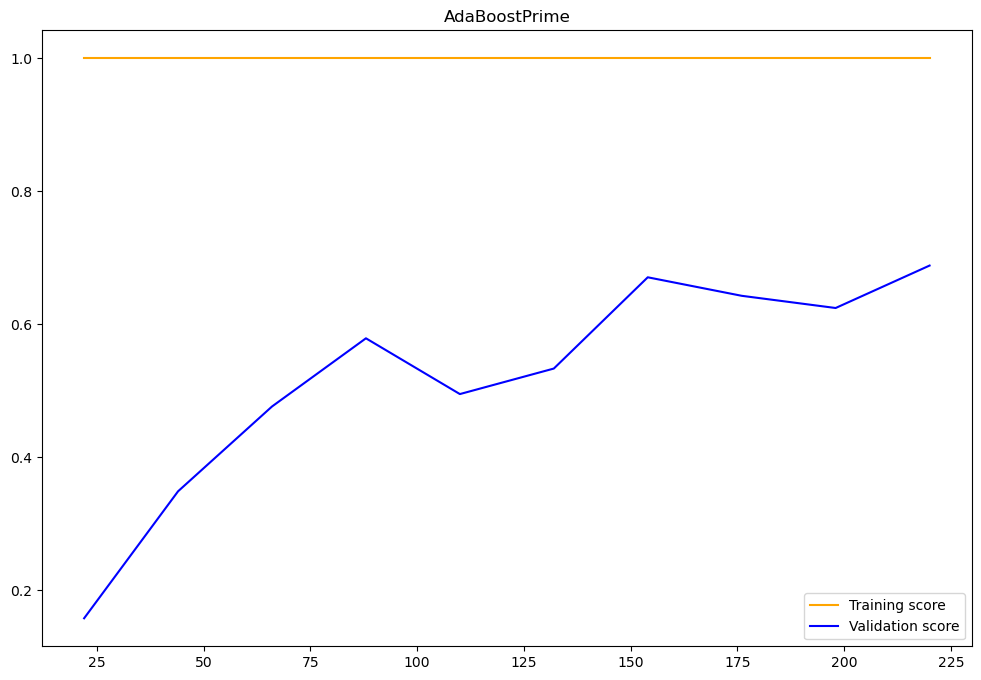

In [908]:
ada_boost_best_model = grid_ada.best_estimator_

evaluation({"AdaBoostPrime": ada_boost_best_model})

In [909]:
#SVM Random Optimization
hyper_params_svc= {"pipeline__polynomialfeatures__degree": [1, 2, 3],
                "pipeline__selectkbest__score_func": [f_classif, chi2],
                "pipeline__selectkbest__k": np.arange(5, 35, 1),
                "svc__gamma": [1e-3, 1e-4],
                "svc__C": [1, 10, 100, 1000],
                  }
random_grid_svc = RandomizedSearchCV(svm_pipeline,
                                     param_distributions= hyper_params_svc,
                                     scoring="recall",
                                     cv= 5,
                                     n_iter= 50,
                                    )
random_grid_svc.fit(X_train_clean, y_train_clean)
random_grid_svc.best_params_

/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 24 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 25 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/sit

{'svc__gamma': 0.001,
 'svc__C': 1000,
 'pipeline__selectkbest__score_func': <function sklearn.feature_selection._univariate_selection.f_classif(X, y)>,
 'pipeline__selectkbest__k': 26,
 'pipeline__polynomialfeatures__degree': 1}

/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [15 16 18 19 21 22 23 24 25 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [16 18 21 23 24 25 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [16 18 21 23 24 25 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWar

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('polynomialfeatures',
                                  PolynomialFeatures(degree=1,
                                                     include_bias=False)),
                                 ('selectkbest', SelectKBest(k=26))])),
                ('standardscaler', StandardScaler()),
                ('svc', SVC(C=1000, gamma=0.001, random_state=0))])
[[69  1]
 [10  7]]
              precision    recall  f1-score   support

           0       0.87      0.99      0.93        70
           1       0.88      0.41      0.56        17

    accuracy                           0.87        87
   macro avg       0.87      0.70      0.74        87
weighted avg       0.87      0.87      0.85        87



/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 24 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 24 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [16 18 19 21 22 23 24 25 26 27 29 30] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 19 21 22 23 25 26 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarnin

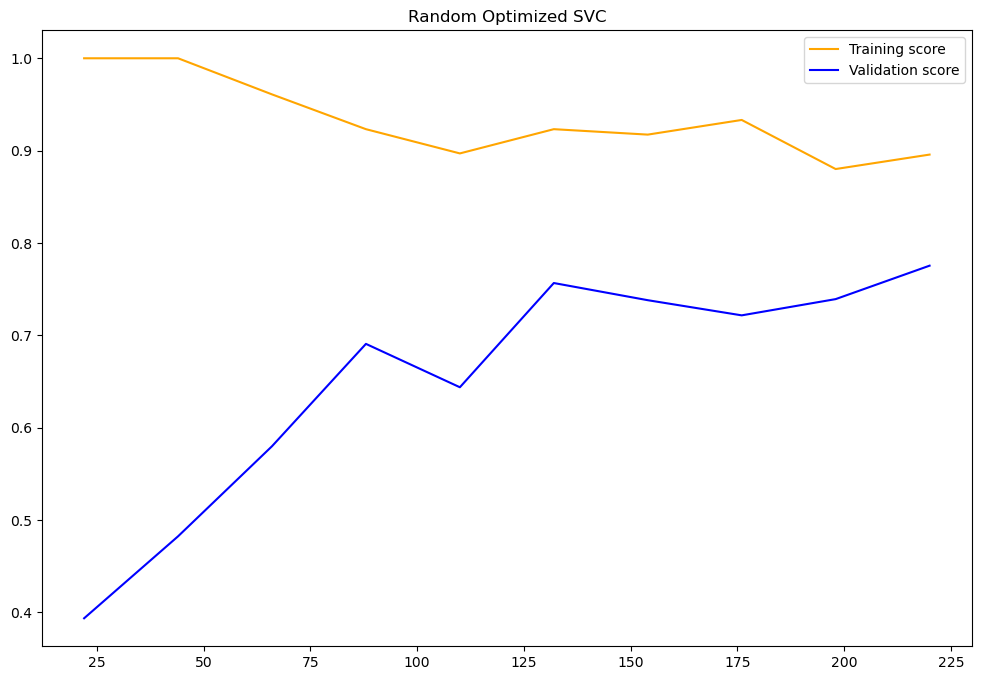

In [910]:
svc_random_best_model = random_grid_svc.best_estimator_
evaluation({"Random Optimized SVC": svc_random_best_model}) 

In [911]:
#SVM Optimization
hyper_params_svc= {"pipeline__polynomialfeatures__degree": [1, 2, 3],
                "pipeline__selectkbest__score_func": [f_classif, chi2],
                "pipeline__selectkbest__k": np.arange(5, 35, 1),
                "svc__gamma": [1e-3, 1e-4],
                "svc__C": [1, 10, 100, 1000],
                  }
grid_svc = GridSearchCV(svm_pipeline,
                         param_grid= hyper_params_svc,
                         scoring="recall",
                         cv= 5,
                                    )
grid_svc.fit(X_train_clean, y_train_clean)
grid_svc.best_params_

/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 24 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 25 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/sit

{'pipeline__polynomialfeatures__degree': 1,
 'pipeline__selectkbest__k': 18,
 'pipeline__selectkbest__score_func': <function sklearn.feature_selection._univariate_selection.f_classif(X, y)>,
 'svc__C': 1000,
 'svc__gamma': 0.001}

/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [15 16 18 19 21 22 23 24 25 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [16 18 21 23 24 25 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [16 18 21 23 24 25 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWar

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('polynomialfeatures',
                                  PolynomialFeatures(degree=1,
                                                     include_bias=False)),
                                 ('selectkbest', SelectKBest(k=18))])),
                ('standardscaler', StandardScaler()),
                ('svc', SVC(C=1000, gamma=0.001, random_state=0))])
[[69  1]
 [10  7]]
              precision    recall  f1-score   support

           0       0.87      0.99      0.93        70
           1       0.88      0.41      0.56        17

    accuracy                           0.87        87
   macro avg       0.87      0.70      0.74        87
weighted avg       0.87      0.87      0.85        87



/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 24 27 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 24 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [18 23 24 29] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akromic/anaconda3/lib/python3.11/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [16 18 19 21 22 23 24 25 26 27 29 30] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/akr

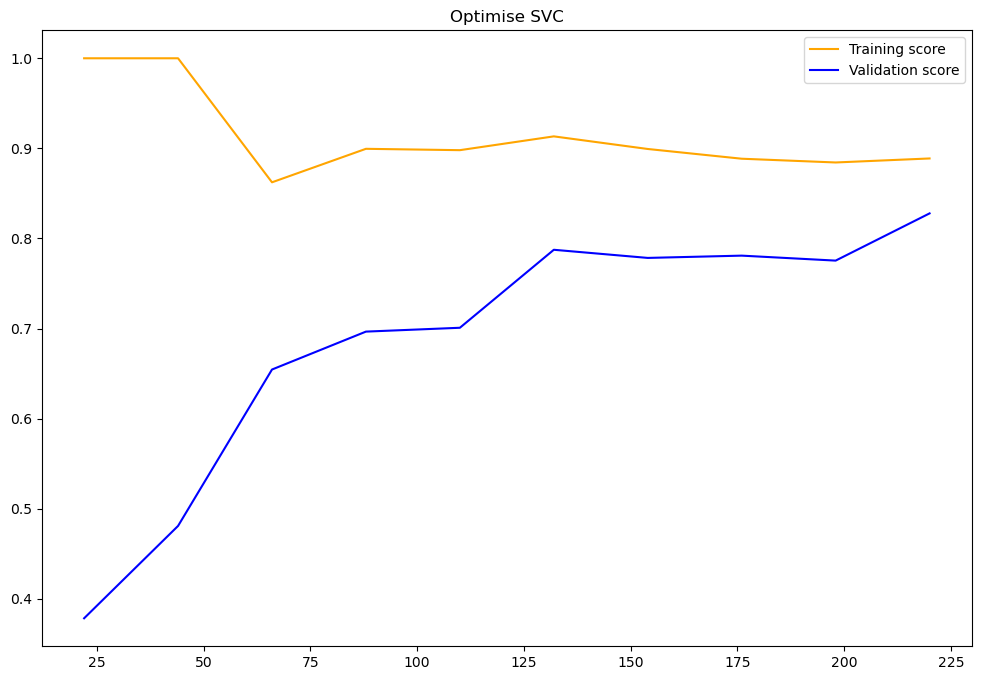

In [912]:
svc_best_model = grid_svc.best_estimator_
evaluation({"Optimise SVC": svc_best_model}) 

## Precision Recall Curve

In [913]:
from sklearn.metrics import precision_recall_curve

In [914]:
precision_ada, recall_ada, threshold_ada = precision_recall_curve(y_test_clean,ada_boost_best_model.decision_function(X_test_clean))

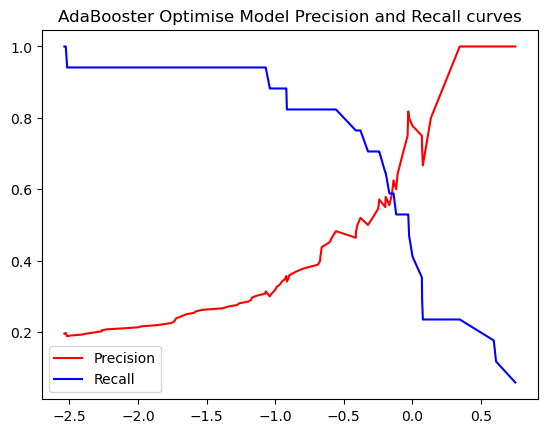

In [915]:
plt.figure()
plt.title("AdaBooster Optimise Model Precision and Recall curves")
plt.plot(threshold_ada, precision_ada[:-1], label="Precision", c="red")
plt.plot(threshold_ada, recall_ada[:-1], label="Recall", c="blue")
plt.legend()
plt.show()

In [916]:
precision_svc_random, recall_svc_random, threshold_svc_random = precision_recall_curve(y_test_clean,random_grid_svc.decision_function(X_test_clean))


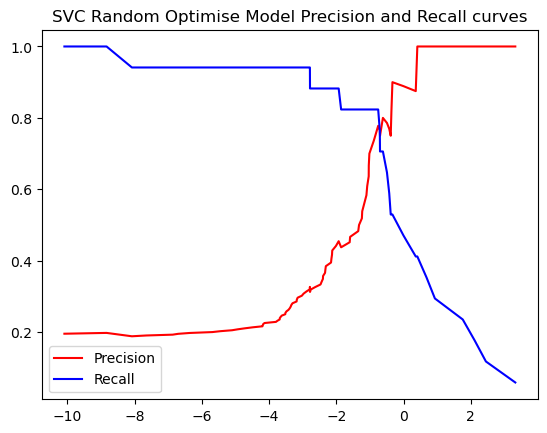

In [917]:
plt.figure()
plt.title("SVC Random Optimise Model Precision and Recall curves")
plt.plot(threshold_svc_random, precision_svc_random[:-1], label="Precision", c="red")
plt.plot(threshold_svc_random, recall_svc_random[:-1], label="Recall", c="blue")
plt.legend()
plt.show()

In [918]:
precision_svc, recall_svc, threshold_svc = precision_recall_curve(y_test_clean, grid_svc.decision_function(X_test_clean))

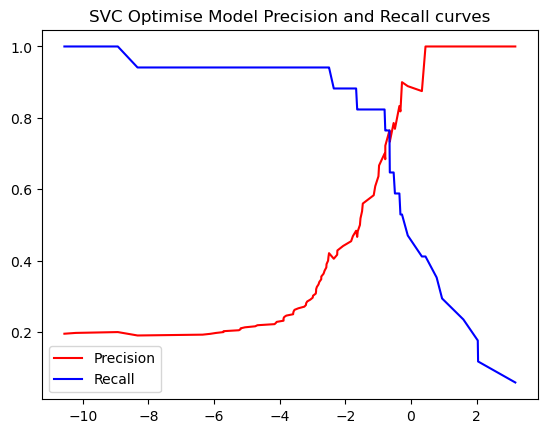

In [919]:
plt.figure()
plt.title("SVC Optimise Model Precision and Recall curves")
plt.plot(threshold_svc, precision_svc[:-1], label="Precision", c="red")
plt.plot(threshold_svc, recall_svc[:-1], label="Recall", c="blue")
plt.legend()
plt.show()

In [920]:
# Function to fix the threshold and boost the recall value
def final_model(model, X, threshold=0):
    return model.decision_function(X) > threshold

In [921]:
y_pred_ada = final_model(ada_boost_best_model, X_test_clean, threshold=-0.3)
print(classification_report(y_test_clean, y_pred_ada))

              precision    recall  f1-score   support

           0       0.92      0.84      0.88        70
           1       0.52      0.71      0.60        17

    accuracy                           0.82        87
   macro avg       0.72      0.77      0.74        87
weighted avg       0.84      0.82      0.83        87



In [931]:
y_pred_svc_random = final_model(svc_random_best_model, X_test_clean, threshold=-0.8)
print(classification_report(y_test_clean, y_pred_svc_random))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95        70
           1       0.78      0.82      0.80        17

    accuracy                           0.92        87
   macro avg       0.87      0.88      0.87        87
weighted avg       0.92      0.92      0.92        87



In [941]:
y_pred_svc = final_model(svc_best_model, X_test_clean, threshold=-0.9)
print(classification_report(y_test_clean, y_pred_svc))

              precision    recall  f1-score   support

           0       0.96      0.91      0.93        70
           1       0.70      0.82      0.76        17

    accuracy                           0.90        87
   macro avg       0.83      0.87      0.85        87
weighted avg       0.91      0.90      0.90        87



In [924]:
from sklearn.metrics import f1_score, recall_score

In [944]:
f1_score(y_test_clean, y_pred_svc_random)

0.7999999999999999

In [945]:
recall_score(y_test_clean, y_pred_svc_random)

0.8235294117647058

# Conclusion